## Credit Card Fraud Detection

In this project you will predict fraudulent credit card transactions with the help of Machine learning models. Please import the following libraries to get started.

In [1]:
#import the package
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import sklearn
from sklearn import metrics
from sklearn import preprocessing
from sklearn import model_selection
from sklearn import linear_model 

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score

# GridSearchCV to find optimal max_features
from sklearn.model_selection import GridSearchCV

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

# Importing classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn import linear_model 
from sklearn.preprocessing import PowerTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsClassifier

# Importing required packages for visualization
from IPython.display import Image  
from io import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz

#- import class imbalanced packages
from imblearn import over_sampling 
from imblearn.over_sampling import RandomOverSampler
from collections import Counter
from sklearn.datasets import make_classification


# Importing XGBoost library
from xgboost import XGBClassifier

import warnings
warnings.filterwarnings("ignore")


## Exploratory data analysis

In [94]:
# Read Data File in CSV File Format
df = pd.read_csv('creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [95]:
#observe the different feature type present in the data
print('DataSet consists of {0} rows X {1} columns'.format(df.shape[0], df.shape[1]))
print('\n')
print('-' * 66)
print('| Column Name | Data Type','\t','| Null Count','\t','| Unique Record |')
print('-' * 66)
for col in df:
    x = df[col].unique().tolist()
    print('|',col.ljust(11),'|',df[col].dtypes, '\t','|', df[col].isnull().sum(),'\t\t','|',df[col].nunique(),'\t','|')
print('-' * 66)

DataSet consists of 284807 rows X 31 columns


------------------------------------------------------------------
| Column Name | Data Type 	 | Null Count 	 | Unique Record |
------------------------------------------------------------------
| Time        | float64 	 | 0 		 | 124592 	 |
| V1          | float64 	 | 0 		 | 275663 	 |
| V2          | float64 	 | 0 		 | 275663 	 |
| V3          | float64 	 | 0 		 | 275663 	 |
| V4          | float64 	 | 0 		 | 275663 	 |
| V5          | float64 	 | 0 		 | 275663 	 |
| V6          | float64 	 | 0 		 | 275663 	 |
| V7          | float64 	 | 0 		 | 275663 	 |
| V8          | float64 	 | 0 		 | 275663 	 |
| V9          | float64 	 | 0 		 | 275663 	 |
| V10         | float64 	 | 0 		 | 275663 	 |
| V11         | float64 	 | 0 		 | 275663 	 |
| V12         | float64 	 | 0 		 | 275663 	 |
| V13         | float64 	 | 0 		 | 275663 	 |
| V14         | float64 	 | 0 		 | 275663 	 |
| V15         | float64 	 | 0 		 | 275663 	 |
| V16         | float6

Here we will observe the distribution of our classes

In [96]:
classes=df['Class'].value_counts()

normal_share=round(classes[0]/df['Class'].count()*100,2)
fraud_share=round(classes[1]/df['Class'].count()*100,2)


normal_count = df['Class'].count() - classes[1]
fraud_count = df['Class'].count() - classes[0]


AxesSubplot(0.125,0.125;0.775x0.755)


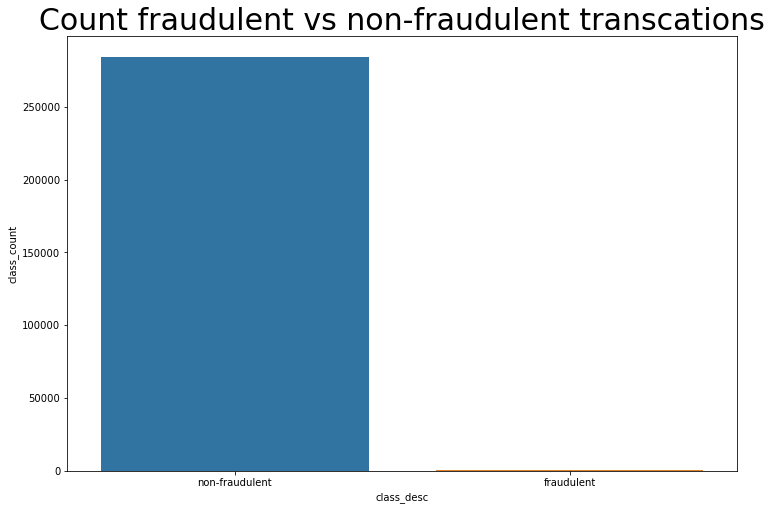

AxesSubplot(0.125,0.125;0.775x0.755)


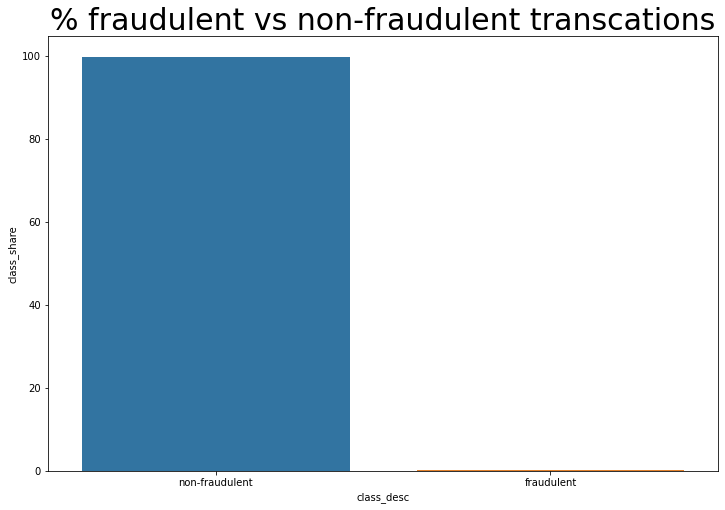

In [5]:
# Create a bar plot for the number and percentage of fraudulent vs non-fraudulent transcations

dfchart = pd.DataFrame({'class_desc':['non-fraudulent', 'fraudulent'],
                        'class_count':[normal_count,fraud_count],'class_share':[normal_share,fraud_share]})
dfchart.reset_index()

plt.figure(figsize=(12, 8))
print(sns.barplot(dfchart.class_desc,dfchart.class_count))
plt.title("Count fraudulent vs non-fraudulent transcations", fontsize=30)
plt.show()

plt.figure(figsize=(12, 8))
print(sns.barplot(dfchart.class_desc,dfchart.class_share))
plt.title("% fraudulent vs non-fraudulent transcations", fontsize=30)
plt.show()


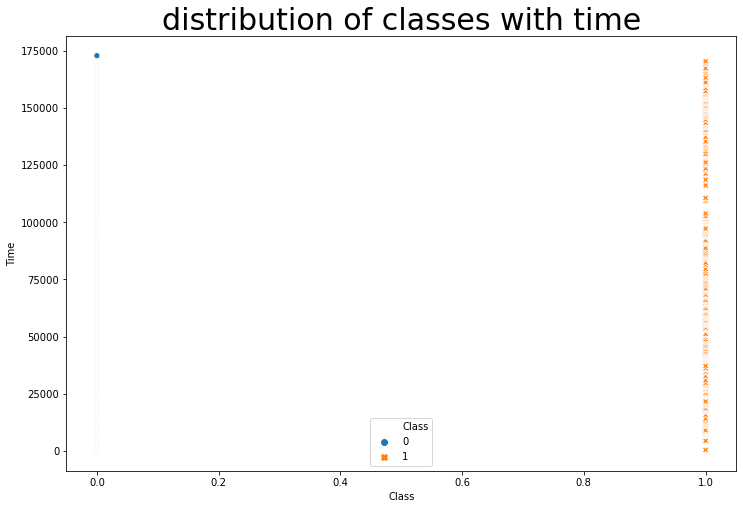

In [6]:
# Create a scatter plot to observe the distribution of classes with time
plt.figure(figsize=(12, 8))
sns.scatterplot(x=df.Class, y=df.Time, hue=df.Class, style=df.Class, data=df)
plt.title("distribution of classes with time", fontsize=30)
plt.show()

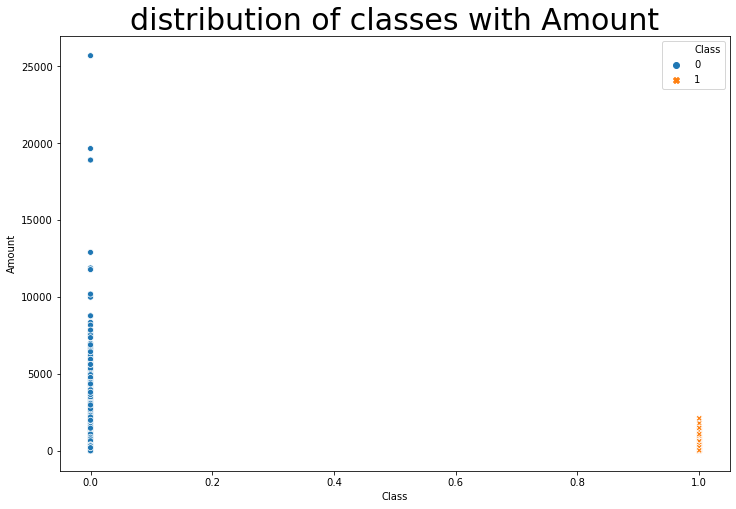

In [7]:
# Create a scatter plot to observe the distribution of classes with Amount
plt.figure(figsize=(12, 8))
sns.scatterplot(x=df.Class, y=df.Amount, hue=df.Class, style=df.Class, data=df)
plt.title("distribution of classes with Amount", fontsize=30)
plt.show()

In [100]:
# Drop unnecessary columns
df.drop(['Time'], axis=1, inplace=True)
df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


### Splitting the data into train & test data

In [6]:
# Putting feature variable to X
X= df.drop('Class', axis=1)

# Putting response variable to y
y= df['Class']#class variable

In [195]:
#Code used to split the data set into data set Train and data set test of 80-20
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2, random_state = 42)

print("Number transactions train dataset: ", len(X_train))
print("Number transactions test dataset: ", len(X_test))
print("Total number of transactions: ", len(X_train)+len(X_test))
print("\n")
print("X train Shape ({0},{1})".format(X_train.shape[0], X_train.shape[1]))
print("y train Shape ({0},1)".format(y_train.shape[0]))
print("\n")
print("X test Shape ({0},{1})".format(X_test.shape[0], X_test.shape[1]))
print("y test Shape ({0},1)".format(y_test.shape[0]))

Number transactions train dataset:  227845
Number transactions test dataset:  56962
Total number of transactions:  284807


X train Shape (227845,29)
y train Shape (227845,1)


X test Shape (56962,29)
y test Shape (56962,1)


##### Preserve X_test & y_test to evaluate on the test data once you build the model

In [11]:
print(np.sum(y))
print(np.sum(y_train))
print(np.sum(y_test))

492
394
98


### Plotting the distribution of a variable

count    227845.000000
mean          0.000916
std           1.958337
min         -56.407510
25%          -0.919918
50%           0.017978
75%           1.315548
max           2.454930
Name: V1, dtype: float64


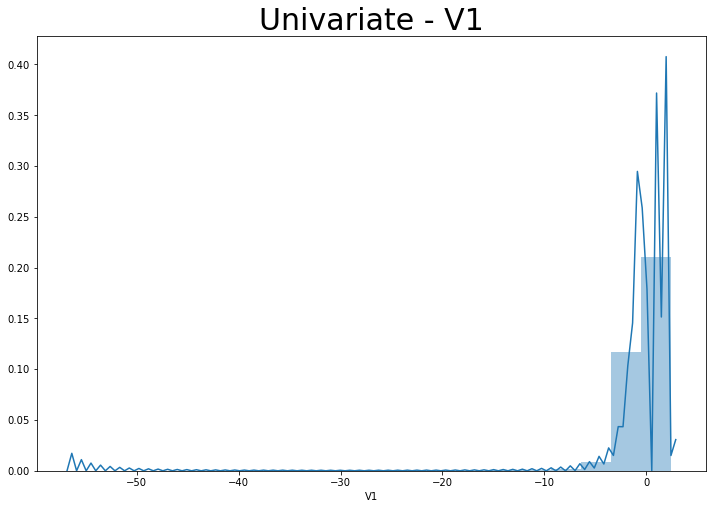

count    227845.000000
mean         -0.000384
std           1.656602
min         -72.715728
25%          -0.597971
50%           0.066050
75%           0.803898
max          22.057729
Name: V2, dtype: float64


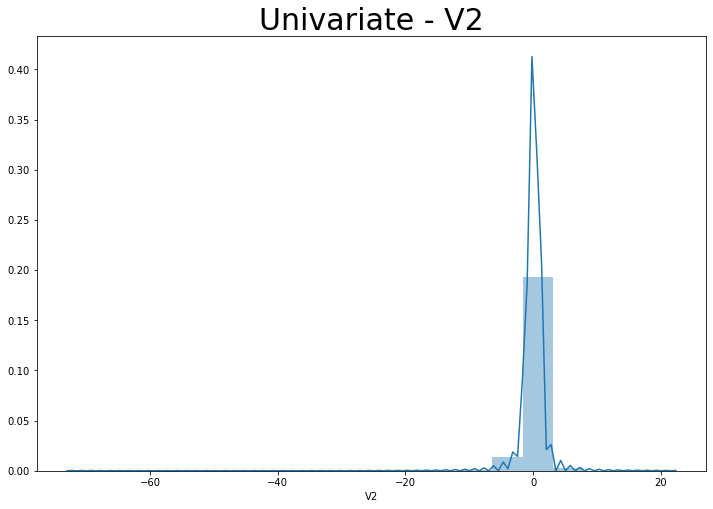

count    227845.000000
mean         -0.000920
std           1.514545
min         -48.325589
25%          -0.890786
50%           0.179041
75%           1.025399
max           4.187811
Name: V3, dtype: float64


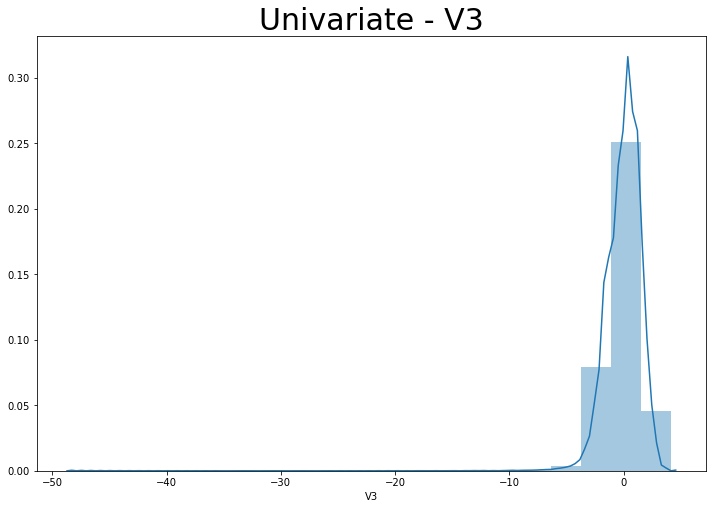

count    227845.000000
mean         -0.001458
std           1.415853
min          -5.683171
25%          -0.849270
50%          -0.020959
75%           0.741630
max          16.875344
Name: V4, dtype: float64


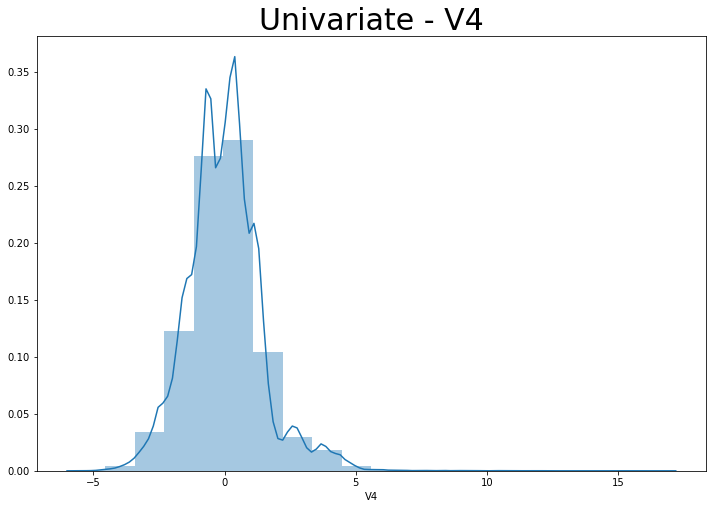

count    227845.000000
mean          0.000997
std           1.387667
min        -113.743307
25%          -0.688802
50%          -0.054711
75%           0.611173
max          34.801666
Name: V5, dtype: float64


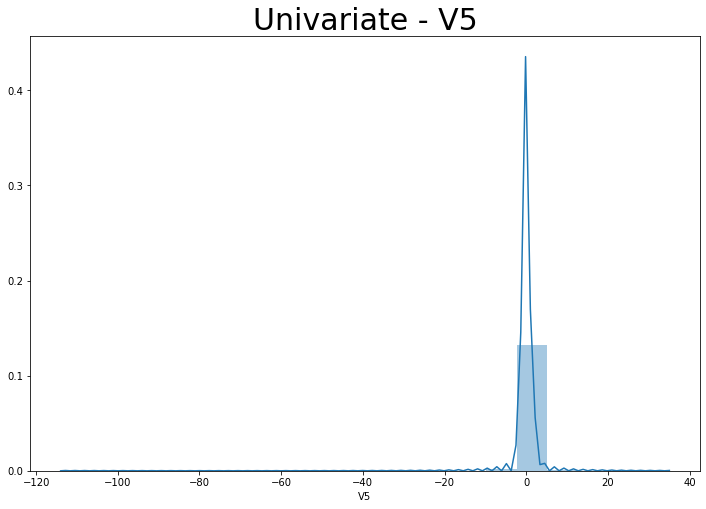

count    227845.000000
mean         -0.000613
std           1.336803
min         -26.160506
25%          -0.768573
50%          -0.274846
75%           0.396056
max          73.301626
Name: V6, dtype: float64


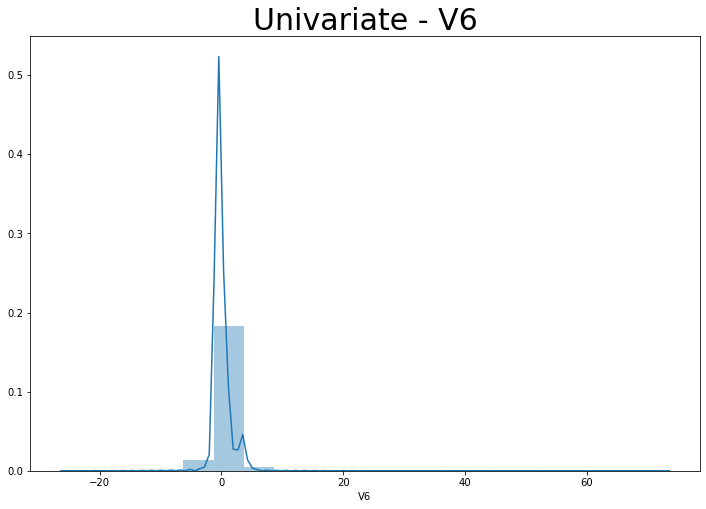

count    227845.000000
mean          0.001090
std           1.243493
min         -43.557242
25%          -0.552156
50%           0.041272
75%           0.570639
max         120.589494
Name: V7, dtype: float64


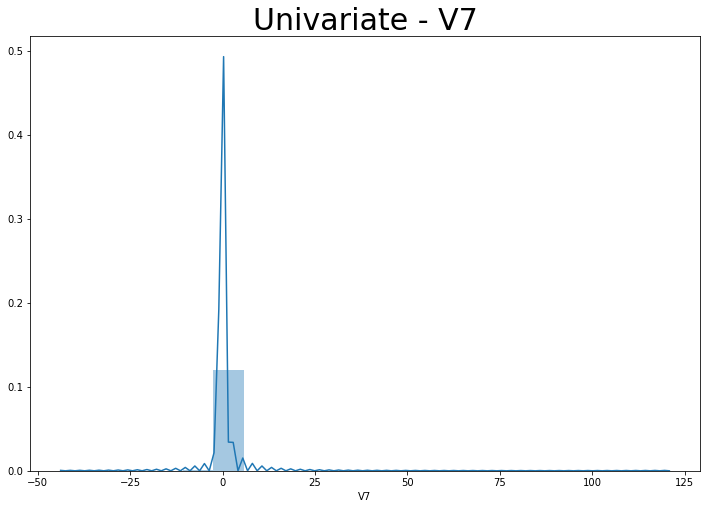

count    227845.000000
mean         -0.000383
std           1.188643
min         -73.216718
25%          -0.208431
50%           0.022233
75%           0.327504
max          20.007208
Name: V8, dtype: float64


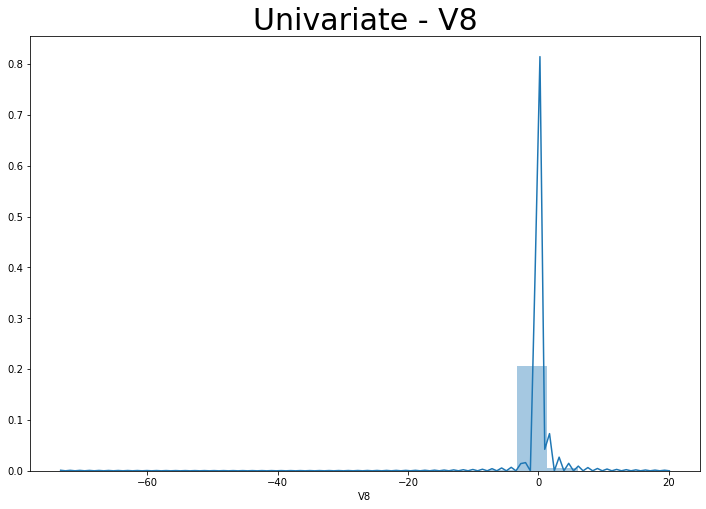

count    227845.000000
mean          0.000961
std           1.097553
min         -13.320155
25%          -0.642386
50%          -0.050414
75%           0.599040
max          10.392889
Name: V9, dtype: float64


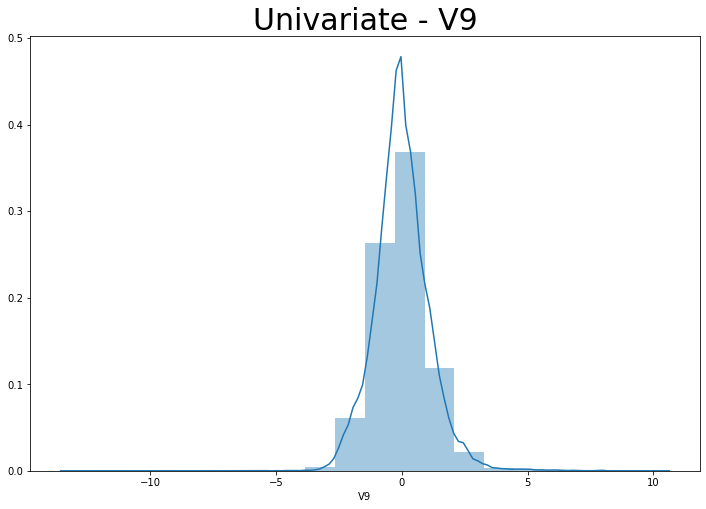

count    227845.000000
mean         -0.001250
std           1.086659
min         -24.588262
25%          -0.536120
50%          -0.094026
75%           0.450669
max          15.245686
Name: V10, dtype: float64


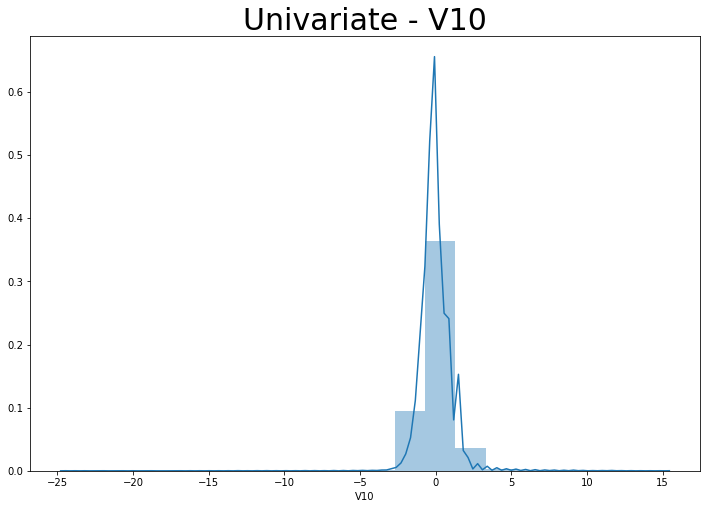

count    227845.000000
mean          0.000577
std           1.021130
min          -4.797473
25%          -0.763311
50%          -0.031764
75%           0.740126
max          12.018913
Name: V11, dtype: float64


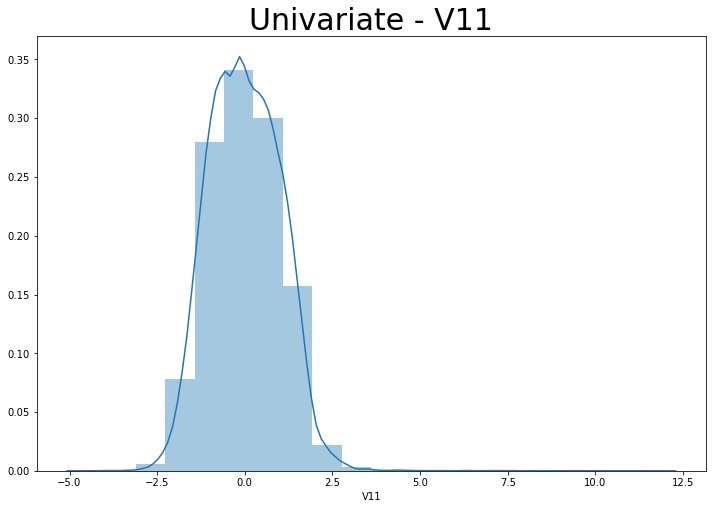

count    227845.000000
mean         -0.001405
std           1.001724
min         -18.683715
25%          -0.406727
50%           0.139452
75%           0.617962
max           7.848392
Name: V12, dtype: float64


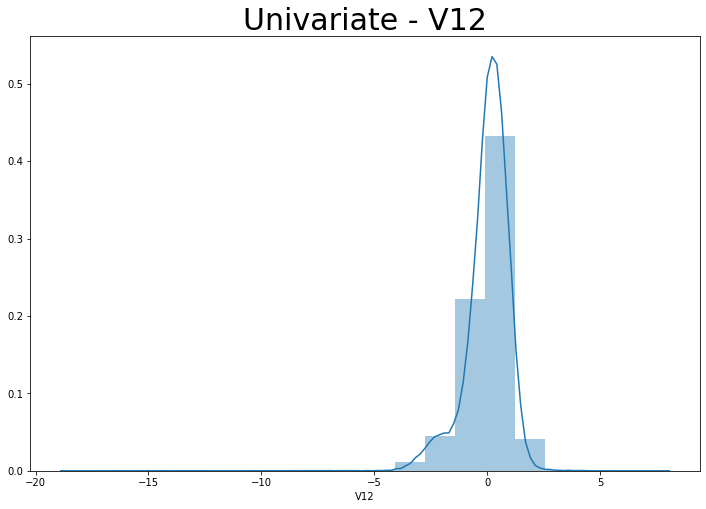

count    227845.000000
mean          0.000066
std           0.995426
min          -5.791881
25%          -0.647707
50%          -0.014114
75%           0.661502
max           7.126883
Name: V13, dtype: float64


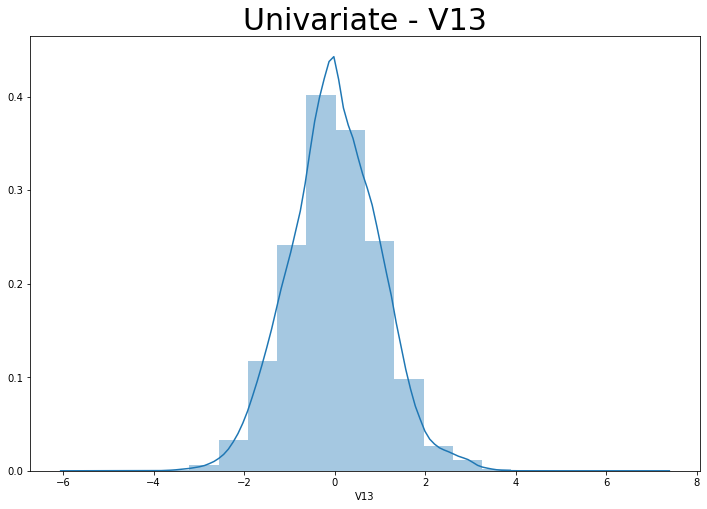

count    227845.000000
mean          0.000004
std           0.959456
min         -19.214325
25%          -0.425856
50%           0.051191
75%           0.494204
max          10.526766
Name: V14, dtype: float64


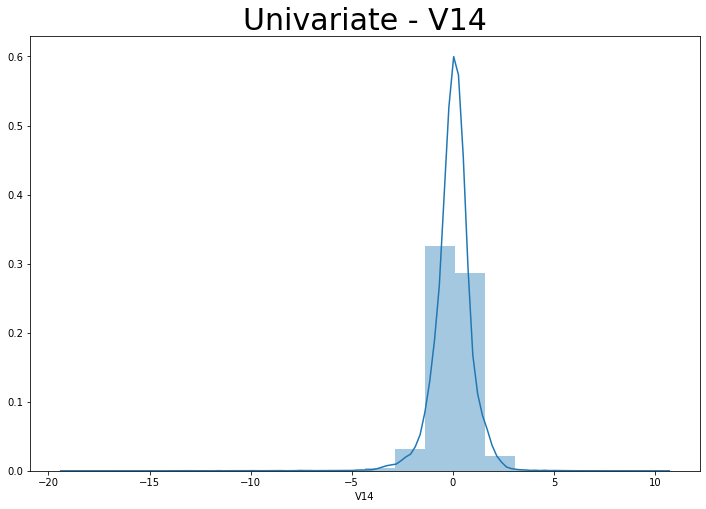

count    227845.000000
mean          0.000023
std           0.914004
min          -4.391307
25%          -0.581592
50%           0.048299
75%           0.648036
max           8.877742
Name: V15, dtype: float64


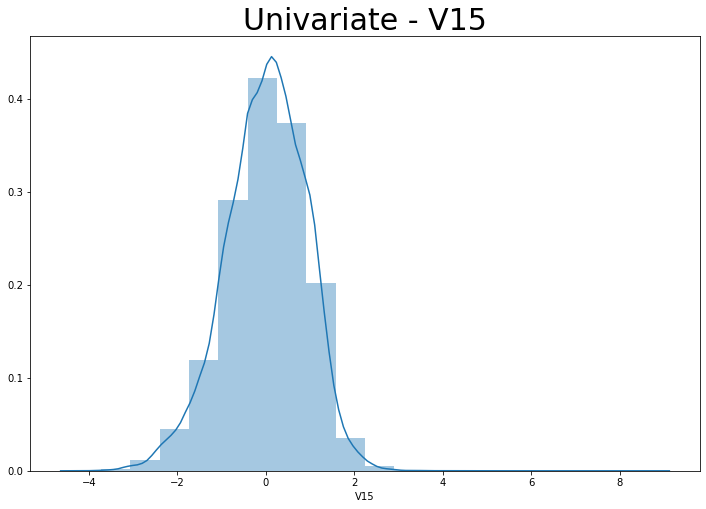

count    227845.000000
mean          0.000668
std           0.877394
min         -14.129855
25%          -0.467322
50%           0.067910
75%           0.523986
max          17.315112
Name: V16, dtype: float64


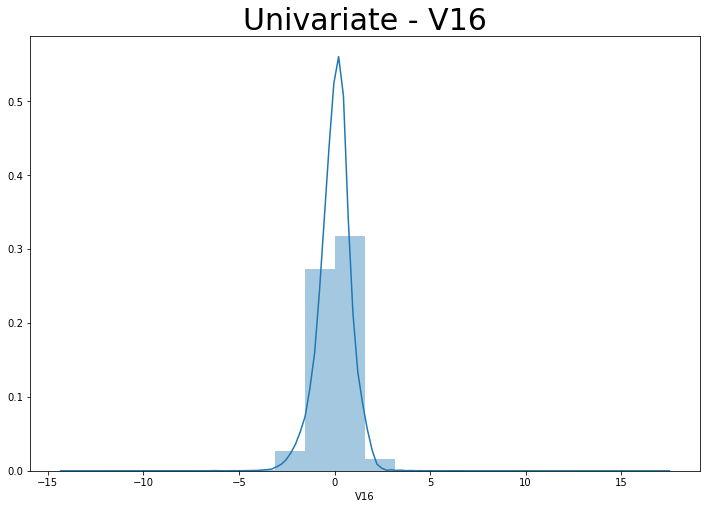

count    227845.000000
mean          0.000616
std           0.851612
min         -25.162799
25%          -0.484129
50%          -0.065443
75%           0.400649
max           9.253526
Name: V17, dtype: float64


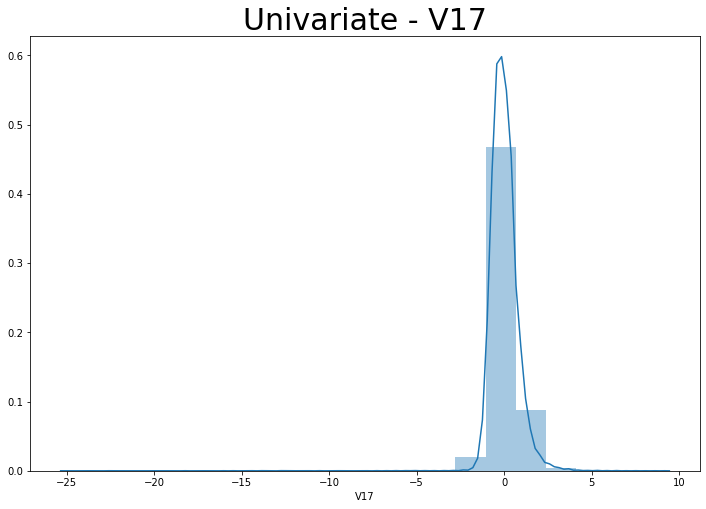

count    227845.000000
mean         -0.000344
std           0.838031
min          -9.498746
25%          -0.498850
50%          -0.004699
75%           0.500715
max           5.041069
Name: V18, dtype: float64


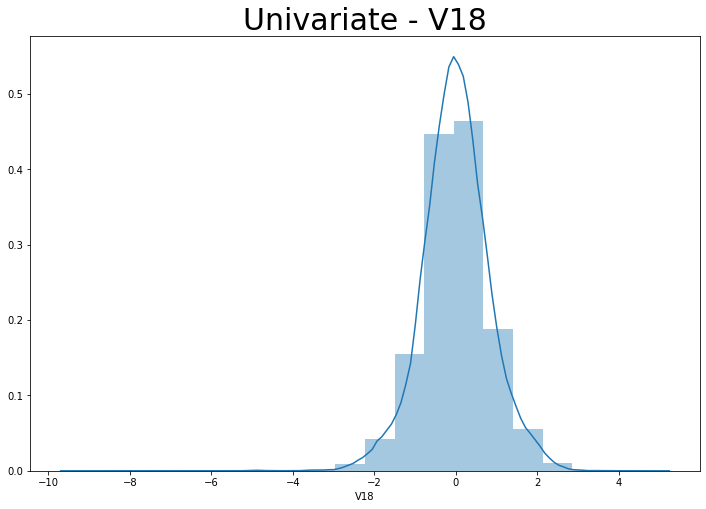

count    227845.000000
mean          0.000113
std           0.814306
min          -7.213527
25%          -0.455756
50%           0.004464
75%           0.458395
max           5.591971
Name: V19, dtype: float64


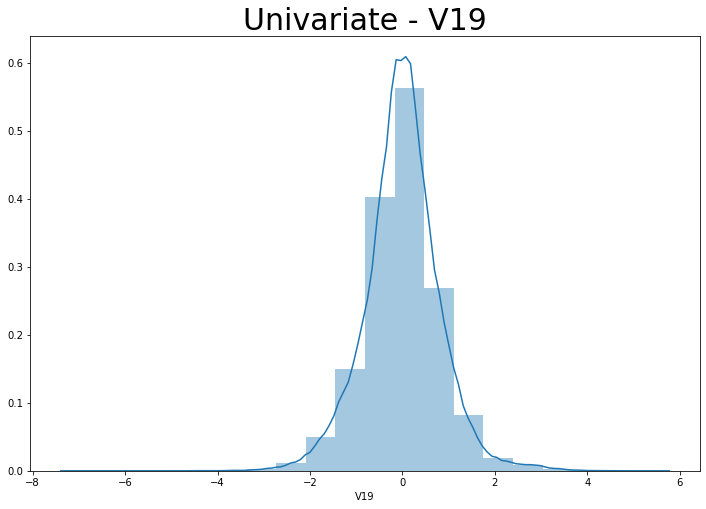

count    227845.000000
mean          0.000398
std           0.774045
min         -54.497720
25%          -0.211969
50%          -0.062614
75%           0.133017
max          39.420904
Name: V20, dtype: float64


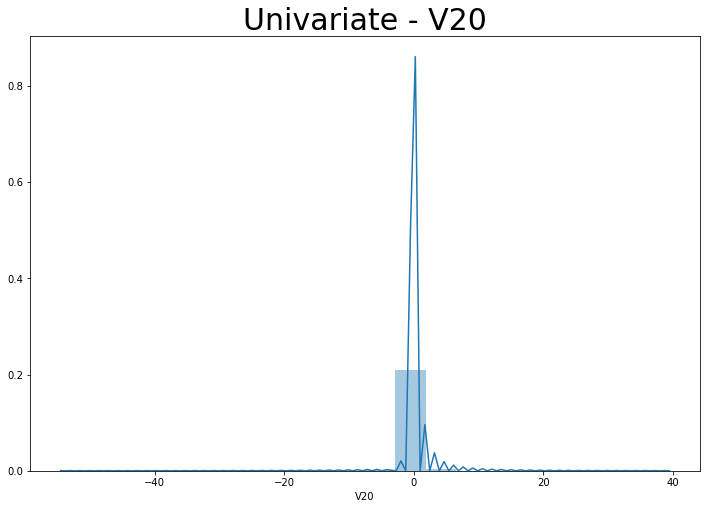

count    227845.000000
mean          0.000215
std           0.732617
min         -34.830382
25%          -0.228730
50%          -0.029639
75%           0.186080
max          27.202839
Name: V21, dtype: float64


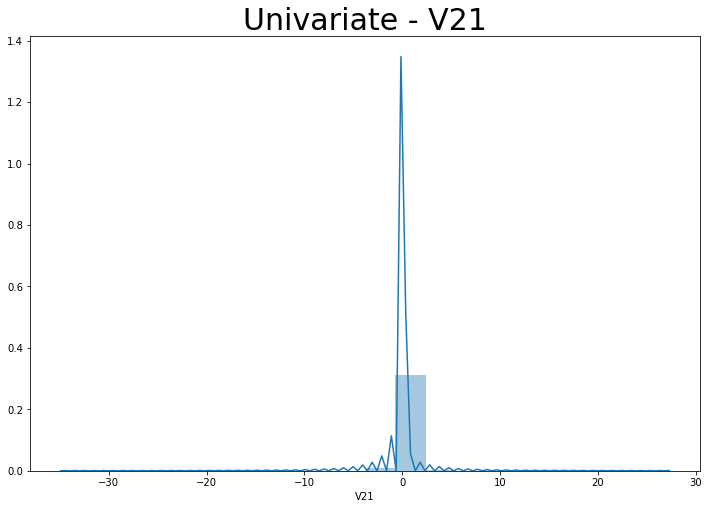

count    227845.000000
mean         -0.001215
std           0.725311
min         -10.933144
25%          -0.542809
50%           0.005491
75%           0.527408
max          10.503090
Name: V22, dtype: float64


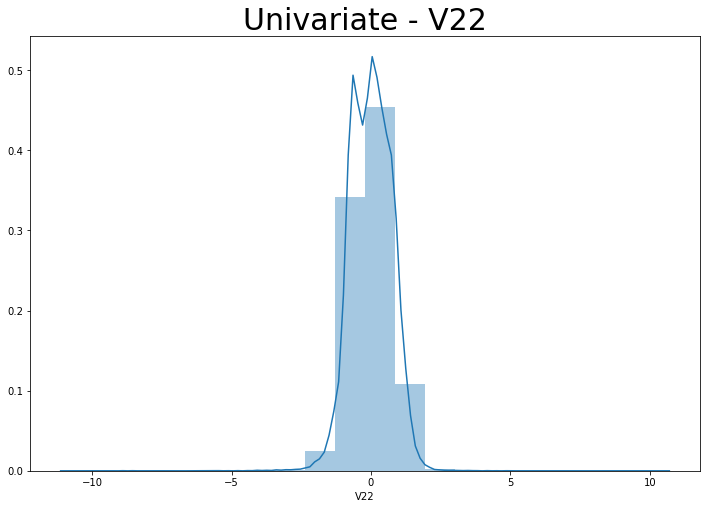

count    227845.000000
mean          0.000175
std           0.627103
min         -44.807735
25%          -0.161296
50%          -0.010595
75%           0.148202
max          22.528412
Name: V23, dtype: float64


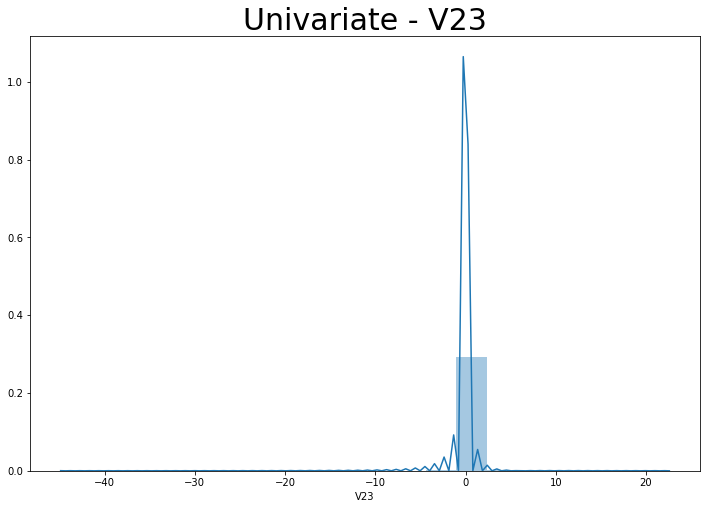

count    227845.000000
mean         -0.000217
std           0.605446
min          -2.836627
25%          -0.354887
50%           0.040766
75%           0.439790
max           4.584549
Name: V24, dtype: float64


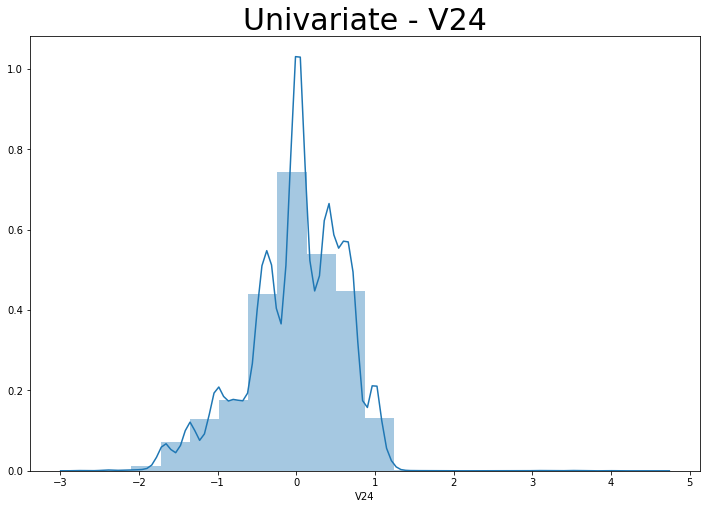

count    227845.000000
mean         -0.000979
std           0.521764
min         -10.295397
25%          -0.317835
50%           0.015101
75%           0.350453
max           7.519589
Name: V25, dtype: float64


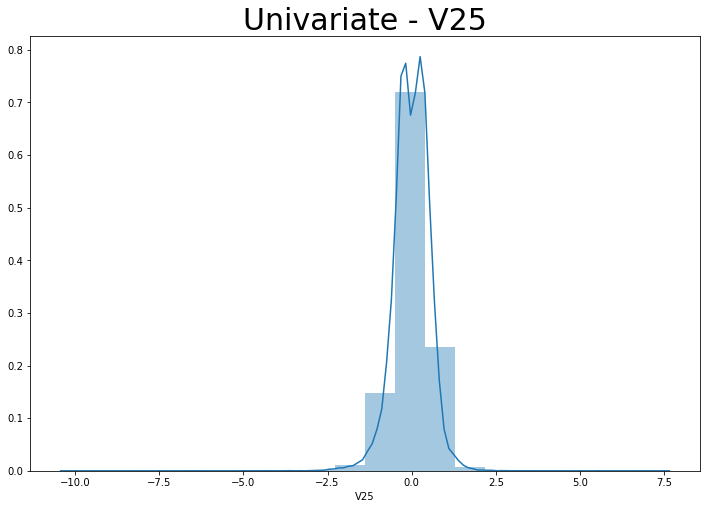

count    227845.000000
mean         -0.000192
std           0.482443
min          -2.604551
25%          -0.327476
50%          -0.052011
75%           0.240813
max           3.517346
Name: V26, dtype: float64


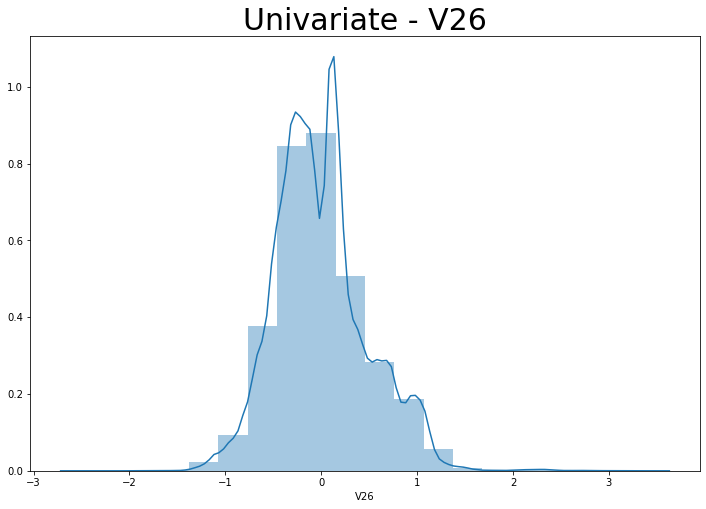

count    227845.000000
mean         -0.000032
std           0.401821
min          -9.895244
25%          -0.070960
50%           0.001359
75%           0.091400
max          31.612198
Name: V27, dtype: float64


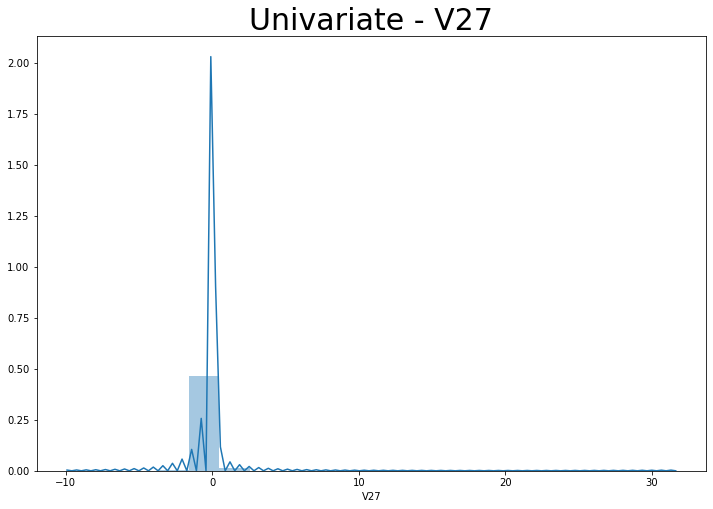

count    227845.000000
mean          0.000257
std           0.329776
min         -15.430084
25%          -0.052980
50%           0.011366
75%           0.078464
max          33.847808
Name: V28, dtype: float64


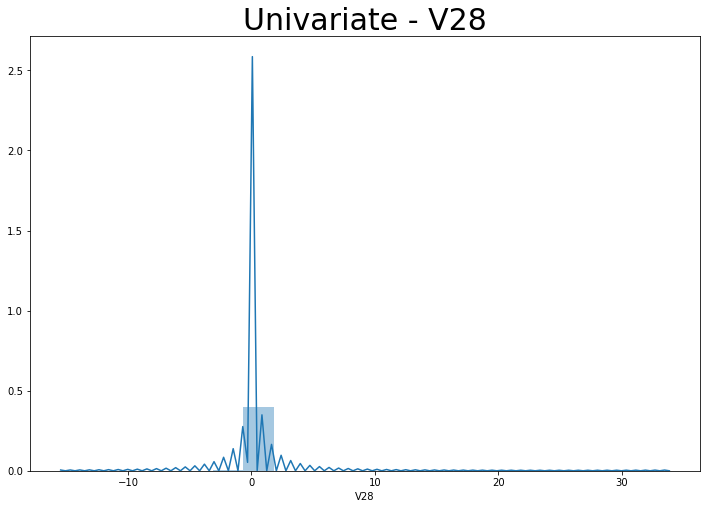

count    227845.000000
mean         88.479993
std         254.930277
min           0.000000
25%           5.600000
50%          22.000000
75%          77.100000
max       25691.160000
Name: Amount, dtype: float64


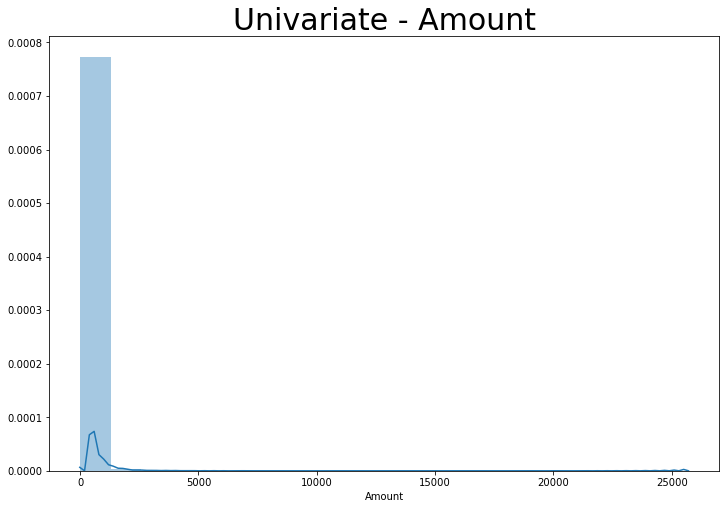

In [12]:
# plot the histogram of a variable from the dataset to see the skewness
for col in X_train:
    print(X_train[col].describe())
    plt.subplots(figsize=(12,8), sharex=True)
    sns.distplot(X_train[col], bins=20)
    plt.title("Univariate - "+col, fontsize=30)
    plt.show()

### If there is skewness present in the distribution use:
- <b>Power Transformer</b> package present in the <b>preprocessing library provided by sklearn</b> to make distribution more gaussian

In [13]:
# - Apply : preprocessing.PowerTransformer(copy=False) to fit & transform the train & test data

pt = preprocessing.PowerTransformer(copy=False)
pt.fit(X_train)
X_train_pt = pt.transform(X_train)
X_test_pt = pt.transform(X_test)

count    2.278450e+05
mean    -7.700697e-16
std      1.000002e+00
min     -8.488986e+00
25%     -7.231025e-01
50%     -2.491362e-01
75%      7.355798e-01
max      1.867856e+00
Name: V1, dtype: float64


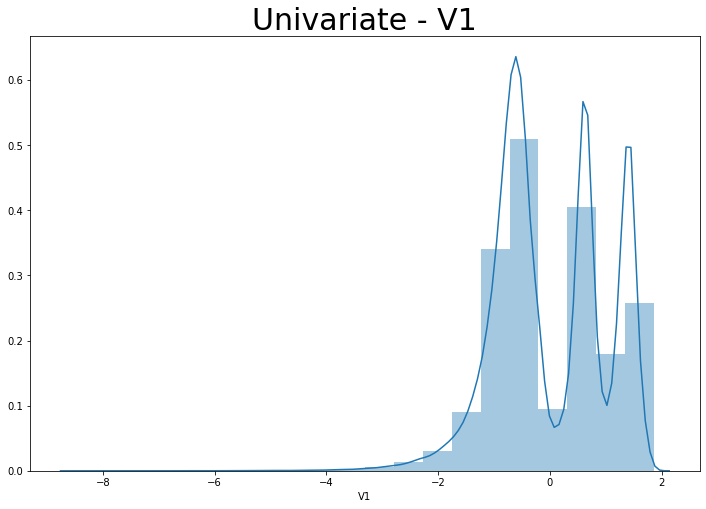

count    2.278450e+05
mean     1.370452e-15
std      1.000002e+00
min     -2.331158e+01
25%     -4.551315e-01
50%     -4.336159e-02
75%      4.750541e-01
max      2.376984e+01
Name: V2, dtype: float64


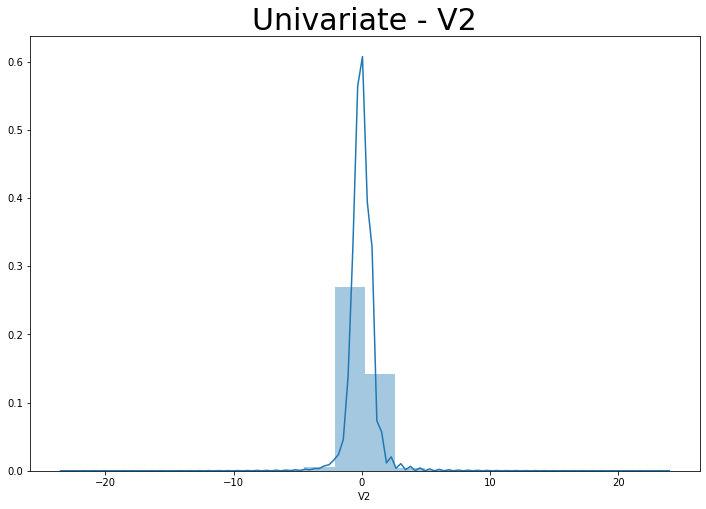

count    2.278450e+05
mean     1.347336e-15
std      1.000002e+00
min     -1.301025e+01
25%     -7.126243e-01
50%     -2.517013e-02
75%      6.736701e-01
max      4.103002e+00
Name: V3, dtype: float64


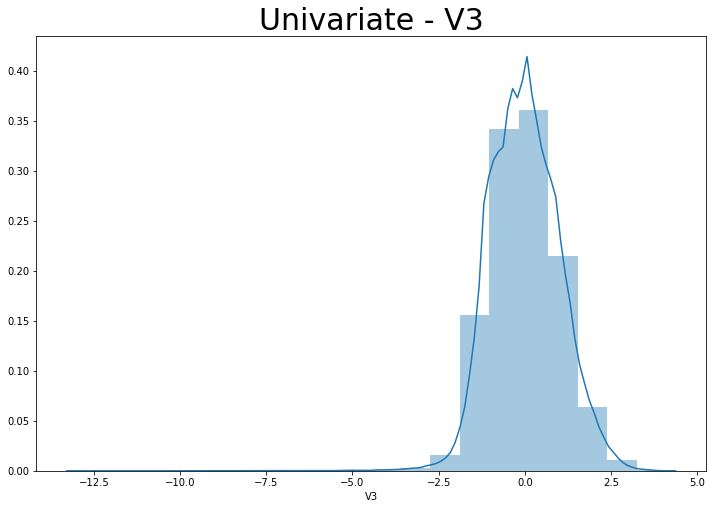

count    2.278450e+05
mean     2.884623e-16
std      1.000002e+00
min     -5.016610e+00
25%     -5.688250e-01
50%      6.332465e-02
75%      5.826337e-01
max      8.547147e+00
Name: V4, dtype: float64


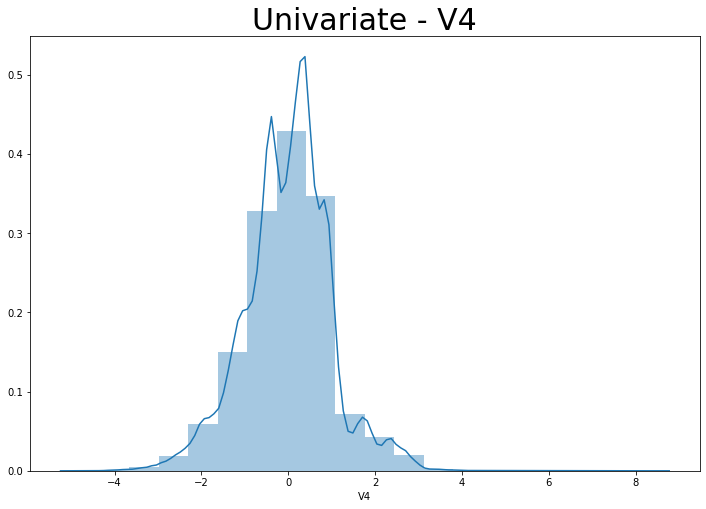

count    2.278450e+05
mean    -2.966429e-16
std      1.000002e+00
min     -7.153036e+01
25%     -5.068809e-01
50%     -5.378375e-02
75%      4.316413e-01
max      2.776752e+01
Name: V5, dtype: float64


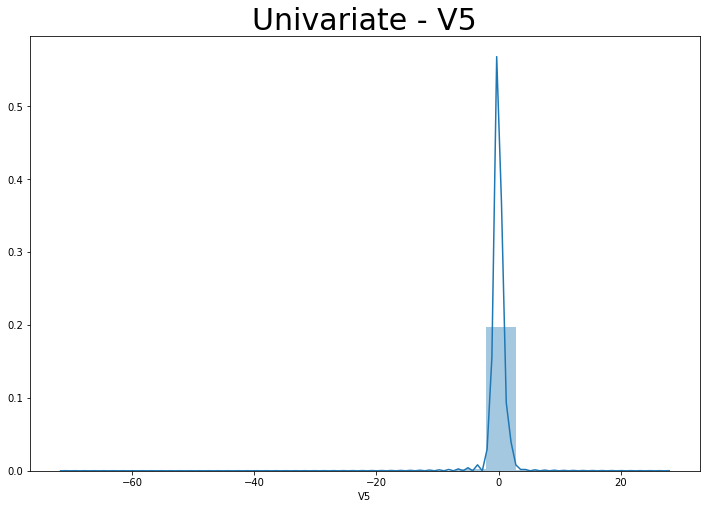

count    2.278450e+05
mean    -4.196811e-16
std      1.000002e+00
min     -4.216909e+01
25%     -5.551411e-01
50%     -1.143795e-01
75%      4.103726e-01
max      2.317212e+01
Name: V6, dtype: float64


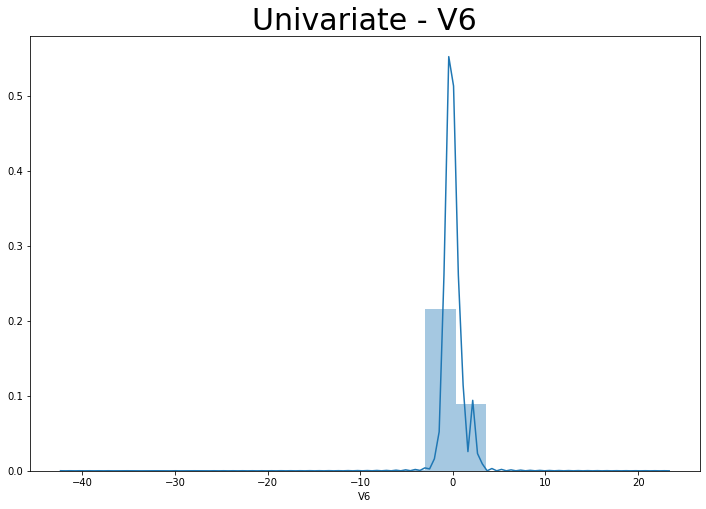

count    2.278450e+05
mean     6.283703e-17
std      1.000002e+00
min     -3.652353e+01
25%     -4.422705e-01
50%      3.673720e-02
75%      4.611257e-01
max      9.186255e+01
Name: V7, dtype: float64


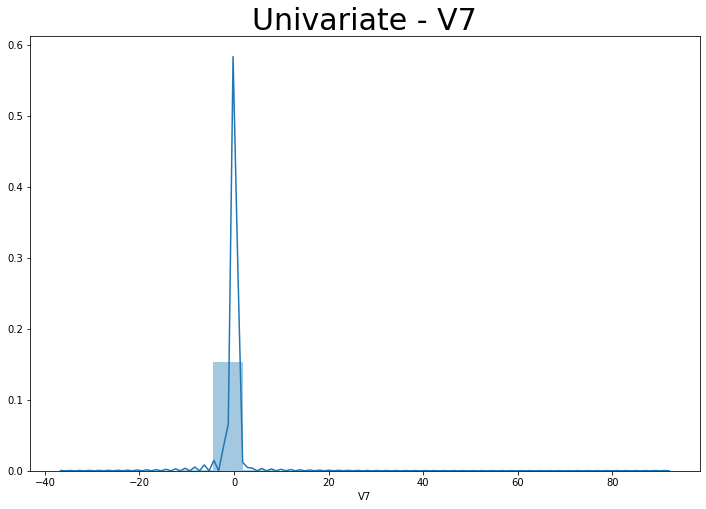

count    2.278450e+05
mean    -3.298309e-16
std      1.000002e+00
min     -2.798561e+01
25%     -2.761910e-01
50%     -5.576828e-02
75%      2.575807e-01
max      3.784550e+01
Name: V8, dtype: float64


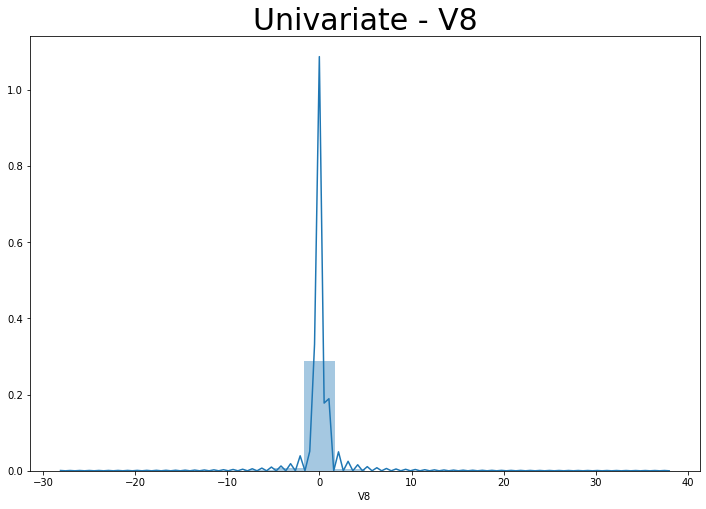

count    2.278450e+05
mean    -3.322303e-16
std      1.000002e+00
min     -1.620564e+01
25%     -5.617465e-01
50%      6.687631e-03
75%      5.835742e-01
max      7.529212e+00
Name: V9, dtype: float64


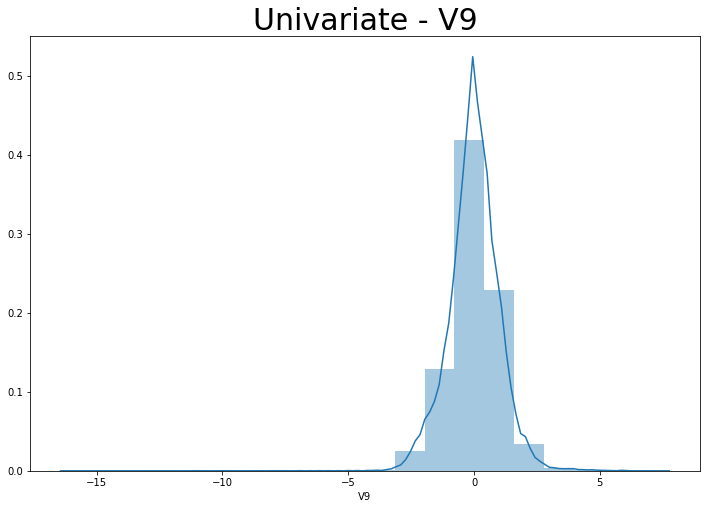

count    2.278450e+05
mean    -5.603541e-16
std      1.000002e+00
min     -3.227273e+01
25%     -4.740120e-01
50%     -4.348036e-02
75%      4.563889e-01
max      1.094462e+01
Name: V10, dtype: float64


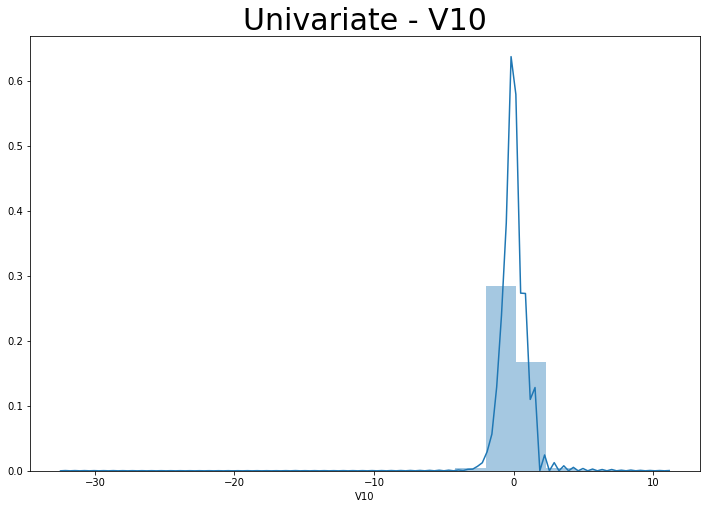

count    2.278450e+05
mean     1.099638e-15
std      1.000002e+00
min     -5.438811e+00
25%     -7.357003e-01
50%      1.555303e-02
75%      7.466712e-01
max      9.428042e+00
Name: V11, dtype: float64


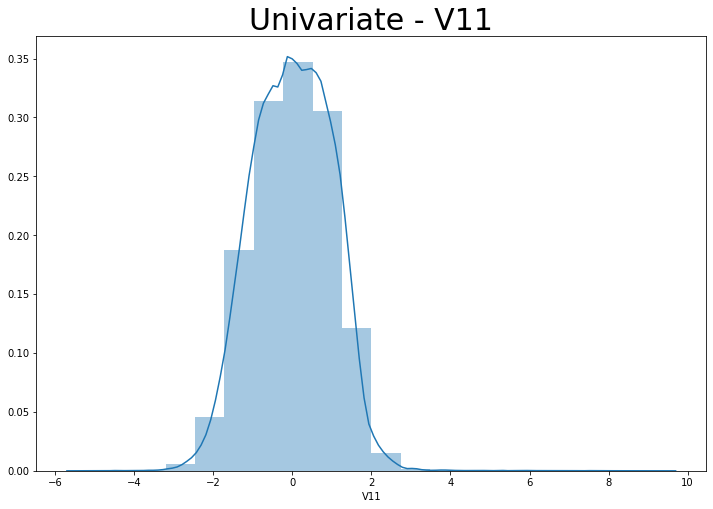

count    2.278450e+05
mean     2.396674e-15
std      1.000002e+00
min     -7.219681e+00
25%     -5.862909e-01
50%     -1.872632e-02
75%      6.090131e-01
max      1.972119e+01
Name: V12, dtype: float64


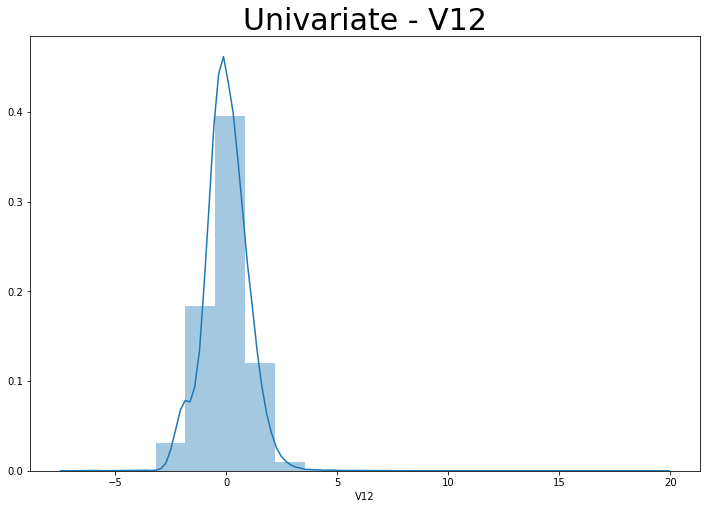

count    2.278450e+05
mean     2.625076e-17
std      1.000002e+00
min     -6.040229e+00
25%     -6.455575e-01
50%     -3.391262e-03
75%      6.698309e-01
max      6.869959e+00
Name: V13, dtype: float64


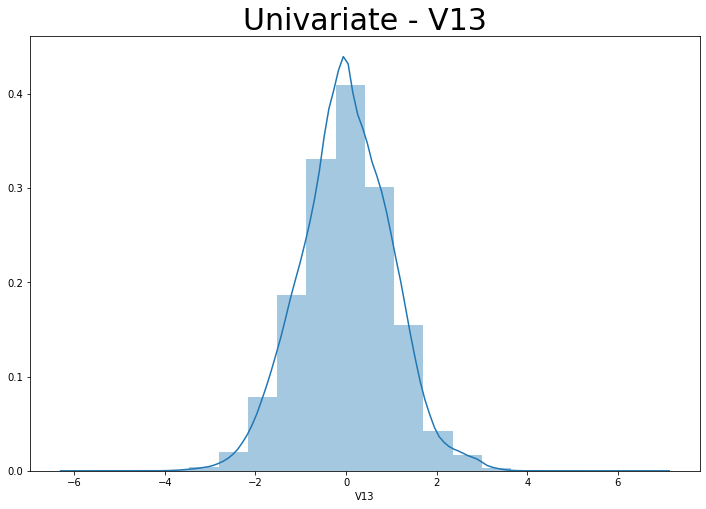

count    2.278450e+05
mean     6.516414e-16
std      1.000002e+00
min     -1.212381e+01
25%     -5.197024e-01
50%     -2.462005e-02
75%      4.858805e-01
max      1.780968e+01
Name: V14, dtype: float64


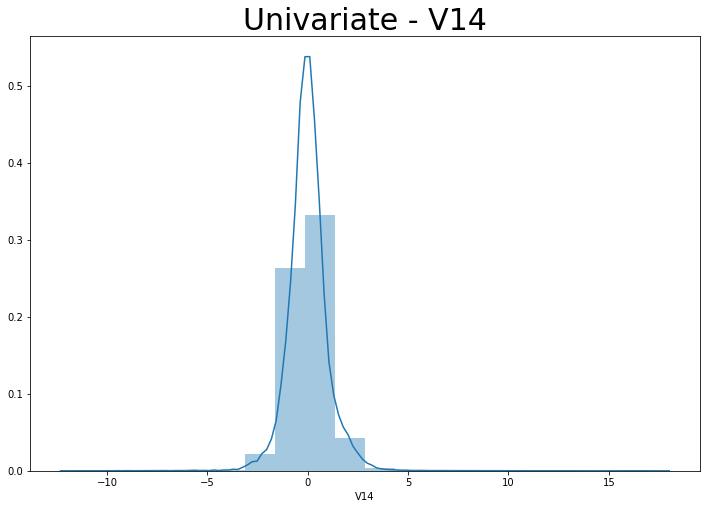

count    2.278450e+05
mean     8.700685e-16
std      1.000002e+00
min     -4.083820e+00
25%     -6.706695e-01
50%     -3.730497e-03
75%      6.909622e-01
max      1.280553e+01
Name: V15, dtype: float64


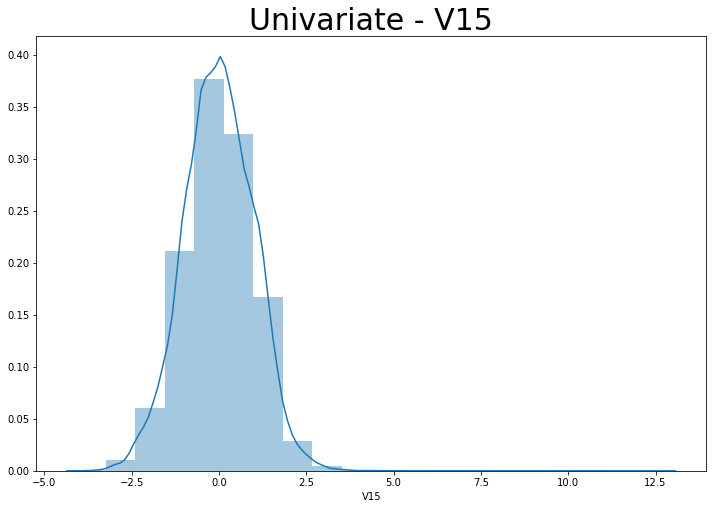

count    2.278450e+05
mean    -1.098991e-16
std      1.000002e+00
min     -1.028325e+01
25%     -5.969219e-01
50%      2.599093e-04
75%      5.687375e-01
max      3.506283e+01
Name: V16, dtype: float64


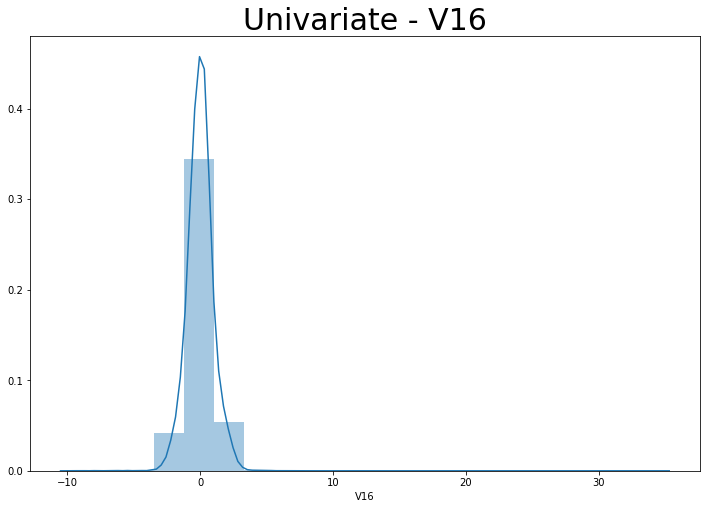

count    2.278450e+05
mean     6.722461e-16
std      1.000002e+00
min     -2.137022e+01
25%     -6.042590e-01
50%     -1.183241e-01
75%      4.546724e-01
max      1.408385e+01
Name: V17, dtype: float64


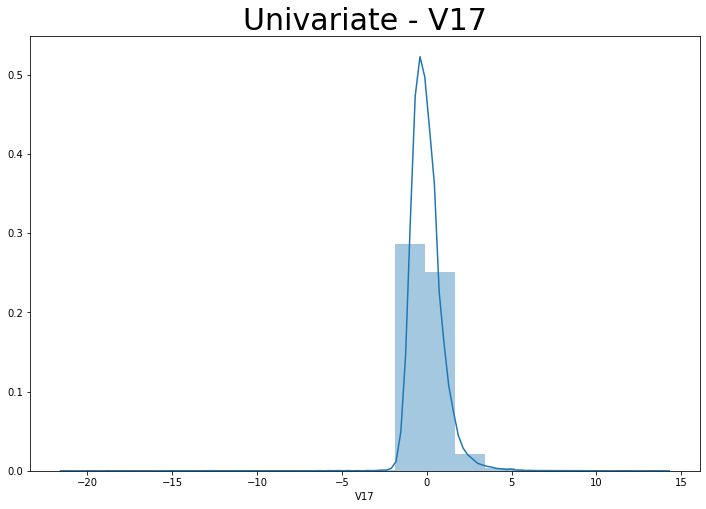

count    2.278450e+05
mean     7.148756e-17
std      1.000002e+00
min     -1.017794e+01
25%     -6.077570e-01
50%     -2.615491e-02
75%      5.870140e-01
max      6.515489e+00
Name: V18, dtype: float64


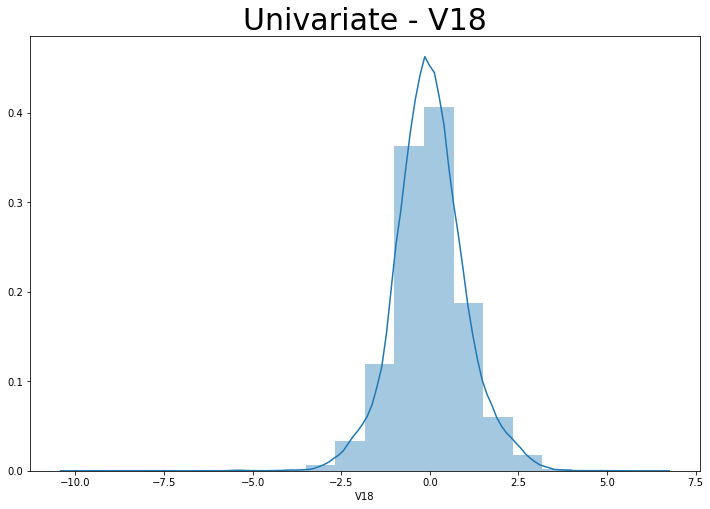

count    2.278450e+05
mean    -1.352465e-16
std      1.000002e+00
min     -9.283833e+00
25%     -5.539612e-01
50%      1.520868e-02
75%      5.690305e-01
max      6.600927e+00
Name: V19, dtype: float64


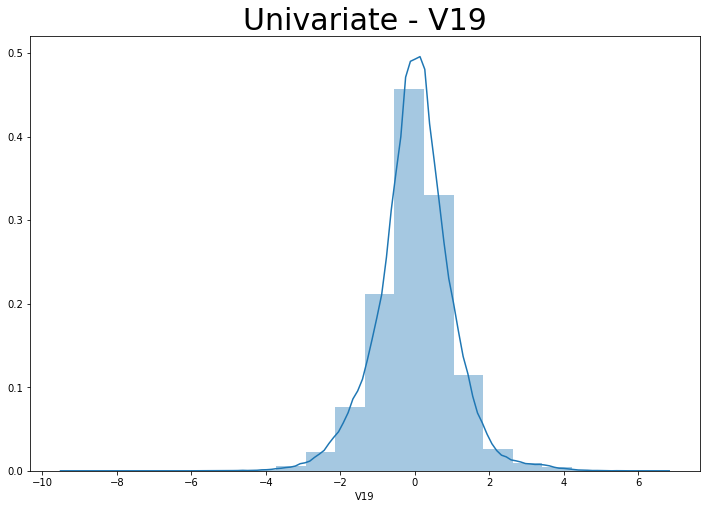

count    2.278450e+05
mean     3.053485e-17
std      1.000002e+00
min     -6.731684e+01
25%     -2.769685e-01
50%     -8.425327e-02
75%      1.687753e-01
max      5.310903e+01
Name: V20, dtype: float64


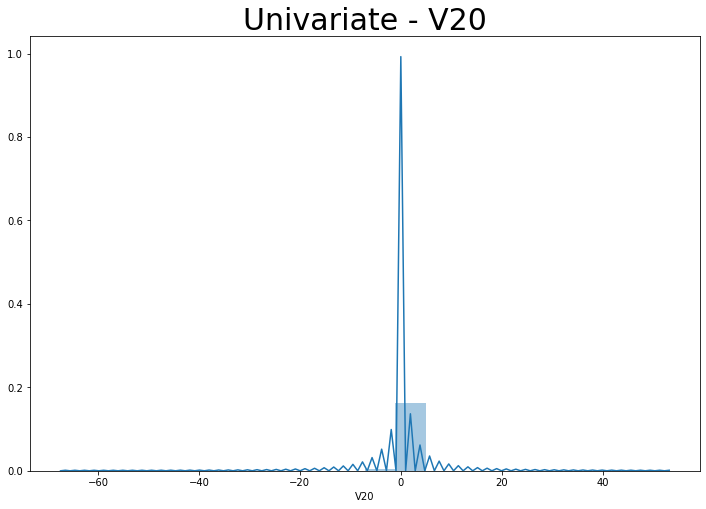

count    2.278450e+05
mean    -6.190126e-17
std      1.000002e+00
min     -6.443004e+01
25%     -3.038349e-01
50%     -2.295742e-02
75%      2.752695e-01
max      2.940564e+01
Name: V21, dtype: float64


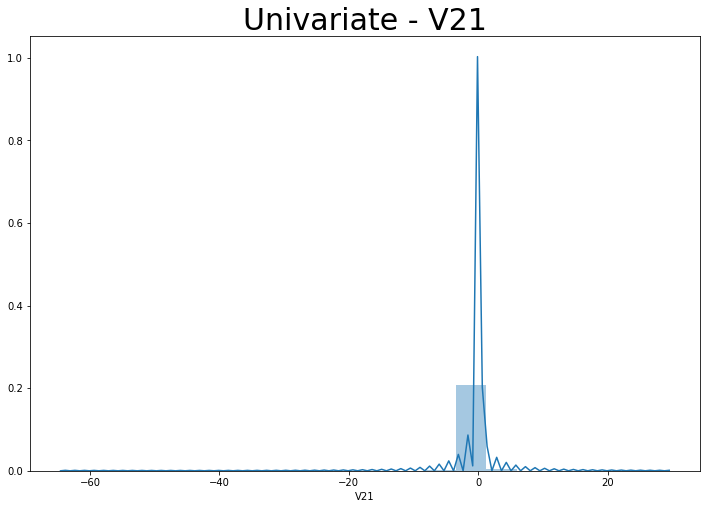

count    2.278450e+05
mean     4.907357e-17
std      1.000002e+00
min     -1.319752e+01
25%     -7.559243e-01
50%     -1.270558e-02
75%      7.213544e-01
max      1.659292e+01
Name: V22, dtype: float64


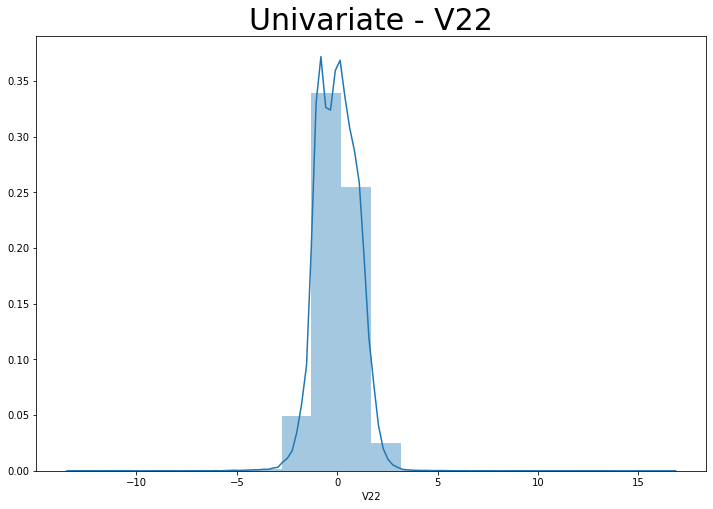

count    2.278450e+05
mean    -9.579745e-17
std      1.000002e+00
min     -5.747316e+01
25%     -2.718027e-01
50%     -2.974664e-02
75%      2.283488e-01
max      4.387673e+01
Name: V23, dtype: float64


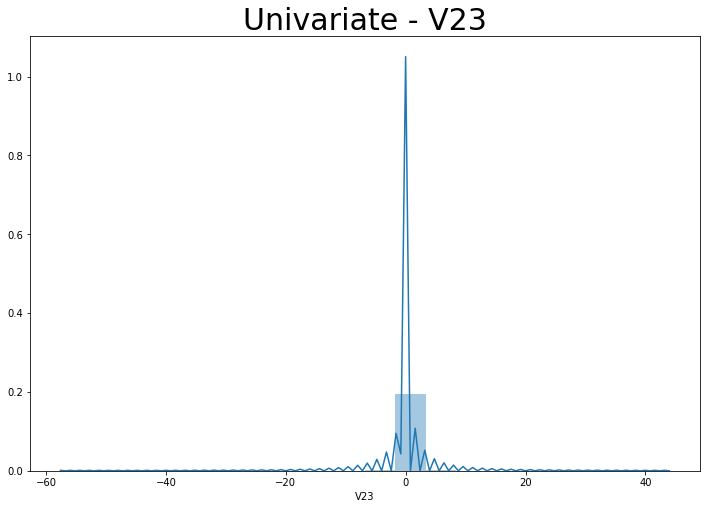

count    2.278450e+05
mean     1.256125e-15
std      1.000002e+00
min     -3.535604e+00
25%     -6.597912e-01
50%     -2.971976e-02
75%      7.070780e-01
max      1.239659e+01
Name: V24, dtype: float64


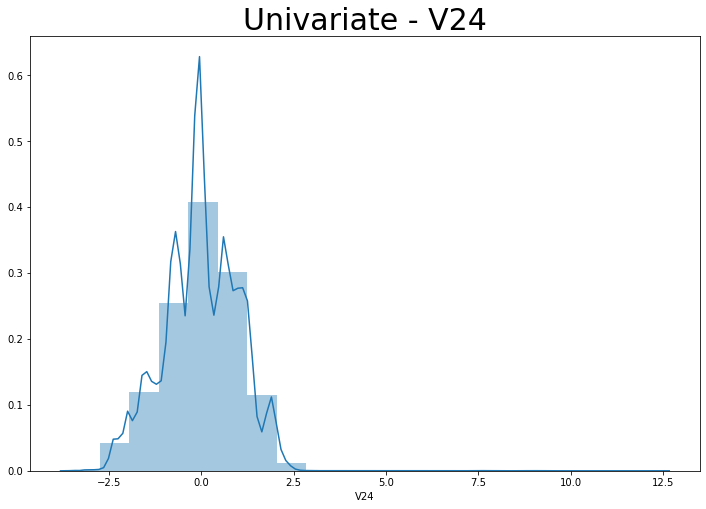

count    2.278450e+05
mean    -2.431712e-16
std      1.000002e+00
min     -1.459630e+01
25%     -6.334718e-01
50%     -8.147047e-03
75%      6.590962e-01
max      1.910622e+01
Name: V25, dtype: float64


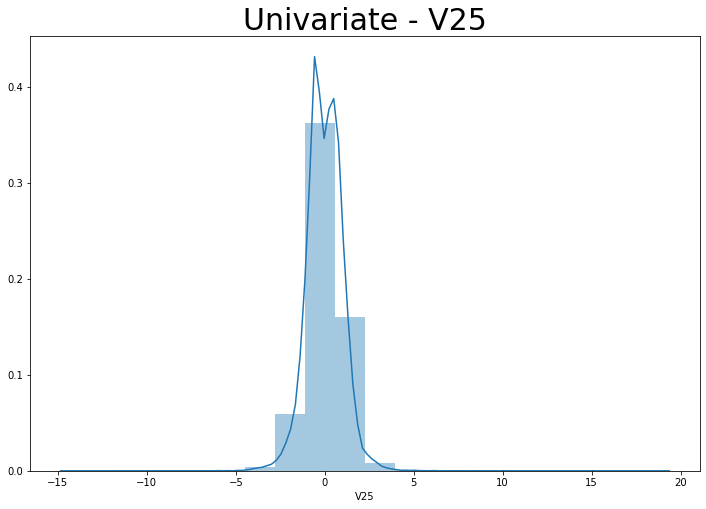

count    2.278450e+05
mean    -3.680622e-16
std      1.000002e+00
min     -8.025802e+00
25%     -6.502165e-01
50%     -1.667197e-02
75%      5.779354e-01
max      4.932707e+00
Name: V26, dtype: float64


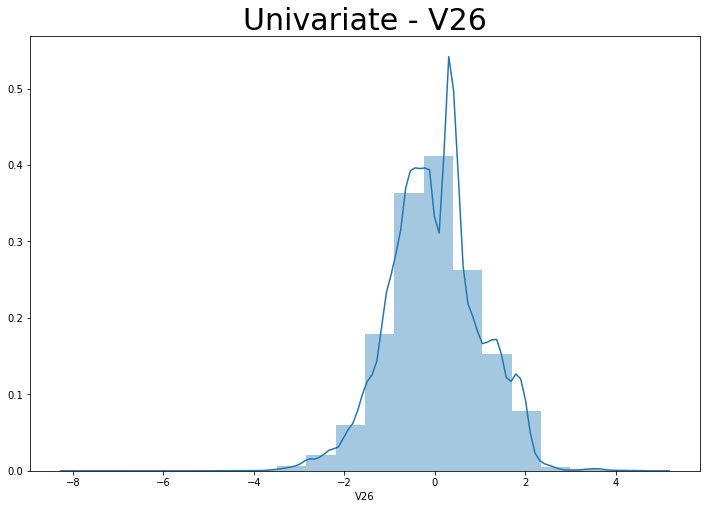

count    2.278450e+05
mean     8.724859e-17
std      1.000002e+00
min     -2.175814e+01
25%     -1.873483e-01
50%     -6.825808e-03
75%      2.193684e-01
max      9.769236e+01
Name: V27, dtype: float64


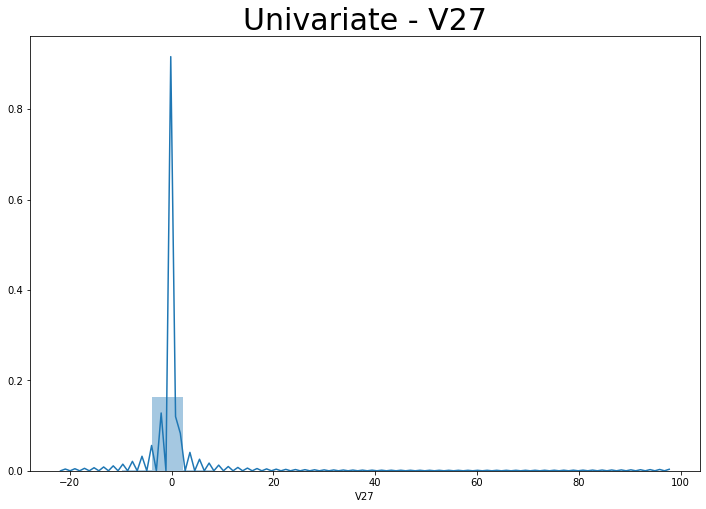

count    2.278450e+05
mean     1.513004e-16
std      1.000002e+00
min     -6.173171e+01
25%     -1.536076e-01
50%      4.652204e-02
75%      2.535192e-01
max      7.539139e+01
Name: V28, dtype: float64


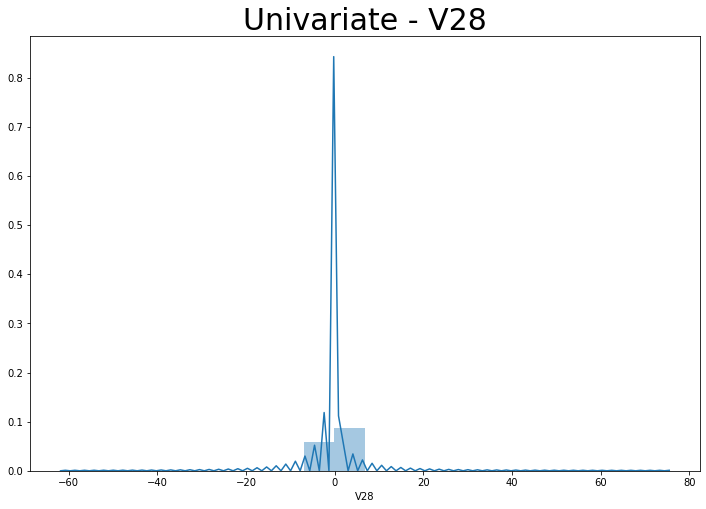

count    2.278450e+05
mean    -5.283745e-13
std      1.000002e+00
min     -2.013472e+00
25%     -7.503466e-01
50%      2.782380e-02
75%      7.483155e-01
max      3.669755e+00
Name: Amount, dtype: float64


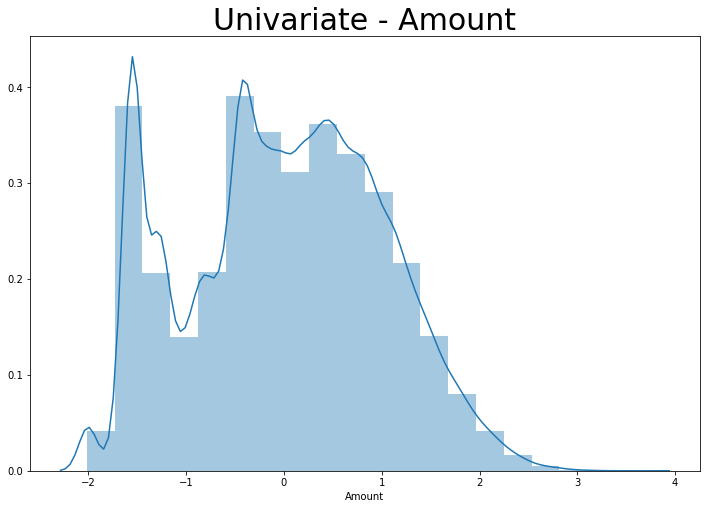

In [14]:
# plot the histogram of a variable from the dataset again to see the result 
for col in X_train:
    print(X_train[col].describe())
    plt.subplots(figsize=(12,8))
    sns.distplot(X_train[col], bins=20)
    plt.title("Univariate - "+col, fontsize=30)
    plt.show()

## Model Building
- Build different models on the imbalanced dataset and see the result

# Logistic Regression

In [15]:
# Logistic Regression

for i in range (2,29):
    # specify model
    lm = LogisticRegression()
    lm.fit(X_train,y_train)
    
    rfe=RFE(lm,i)
    rfe = rfe.fit(X_train, y_train)
    
    # tuples of (feature name, whether selected, ranking)
    list(zip(X_train.columns,rfe.support_,rfe.ranking_))
    
    # predict prices of X_test
    y_pred = rfe.predict(X_test)
    
    # evaluate the model on test set
    r2 = sklearn.metrics.r2_score(y_test, y_pred)
    print('{0}. RFE Score {1} with number of features={2}'.format(i-1,round(r2,2)*100,i))

print('\n')
# k-fold CV (using all the 29 variables)
for i in range (2,10):
    cv_num = cross_val_score(lm, X_train, y_train, scoring='r2', cv=i)
    print('cv = {0}, mean value is {1}'.format(i,round(cv_num.mean(),2)*100))


1. RFE Score 44.0 with number of features=2
2. RFE Score 42.0 with number of features=3
3. RFE Score 49.0 with number of features=4
4. RFE Score 50.0 with number of features=5
5. RFE Score 50.0 with number of features=6
6. RFE Score 49.0 with number of features=7
7. RFE Score 51.0 with number of features=8
8. RFE Score 50.0 with number of features=9
9. RFE Score 51.0 with number of features=10
10. RFE Score 51.0 with number of features=11
11. RFE Score 52.0 with number of features=12
12. RFE Score 51.0 with number of features=13
13. RFE Score 52.0 with number of features=14
14. RFE Score 53.0 with number of features=15
15. RFE Score 56.00000000000001 with number of features=16
16. RFE Score 53.0 with number of features=17
17. RFE Score 53.0 with number of features=18
18. RFE Score 53.0 with number of features=19
19. RFE Score 54.0 with number of features=20
20. RFE Score 53.0 with number of features=21
21. RFE Score 52.0 with number of features=22
22. RFE Score 53.0 with number of feat

In [16]:
rfe=RFE(lm,15)
rfe = rfe.fit(X_train, y_train)
column_names = ['Feature','RFE_Support','RFE_ranking']
dffeature = pd.DataFrame(list(zip(X_train.columns,rfe.support_,rfe.ranking_)),columns=column_names)
dffeature = dffeature[dffeature['RFE_ranking']==1]
num_C = list(dffeature['Feature'])  #--> list of values 
num_C

['V1',
 'V2',
 'V3',
 'V4',
 'V6',
 'V7',
 'V8',
 'V9',
 'V12',
 'V13',
 'V14',
 'V16',
 'V19',
 'V21',
 'V22']

In [17]:
# k-fold CV (using all the 13 variables)
for i in range (2,10):
    cv_score = cross_val_score(lm, X_train, y_train, scoring='r2', cv=i)
    print('cv = {0}, mean value is {1}'.format(i,round(cv_score.mean(),2)*100))
    
cv_num = cross_val_score(lm, X_train, y_train, scoring='r2', cv=5) #--> list of values
cv_num

cv = 2, mean value is 55.00000000000001
cv = 3, mean value is 57.99999999999999
cv = 4, mean value is 55.00000000000001
cv = 5, mean value is 56.00000000000001
cv = 6, mean value is 56.00000000000001
cv = 7, mean value is 56.00000000000001
cv = 8, mean value is 54.0
cv = 9, mean value is 56.00000000000001


array([0.60188265, 0.55619263, 0.5308322 , 0.45475094, 0.65763431])

#### perfom cross validation on the X_train & y_train to create:
- X_train_cv
- X_test_cv 
- y_train_cv
- y_test_cv 

In [18]:

#perform cross validation
# creating a KFold object with 5 splits 
folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

#perform hyperparameter tuning
hyper_params = [{'n_features_to_select': list(range(1, 30))}]

X_train_cv = X_train.values
X_test_cv = X_test.values
y_train_cv = y_train.values
y_test_cv = y_test.values

#print the evaluation result by choosing a evaluation metric
model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)

# fit the model
model_cv.fit(X_train_cv, y_train_cv)  


Fitting 5 folds for each of 29 candidates, totalling 145 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 145 out of 145 | elapsed: 18.3min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score=nan,
             estimator=RFE(estimator=LogisticRegression(C=1.0,
                                                        class_weight=None,
                                                        dual=False,
                                                        fit_intercept=True,
                                                        intercept_scaling=1,
                                                        l1_ratio=None,
                                                        max_iter=100,
                                                        multi_class='auto',
                                                        n_jobs=None,
                                                        penalty='l2',
                                                        random_state=None,
                                                        solver='lbfgs',
                             

In [19]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,10.450036,0.349680,0.001885,0.000098,1,{'n_features_to_select': 1},0.370718,0.416710,0.226507,0.277228,...,0.328894,0.068131,29,0.308929,0.309919,0.357620,0.335359,0.325819,0.327529,0.018032
1,10.303256,0.258756,0.002234,0.000374,2,{'n_features_to_select': 2},0.524828,0.543512,0.480111,0.442071,...,0.496663,0.035376,28,0.486451,0.481644,0.497544,0.510265,0.491184,0.493418,0.009930
2,10.165994,0.171720,0.002462,0.000214,3,{'n_features_to_select': 3},0.499143,0.556193,0.505472,0.416710,...,0.499134,0.045719,27,0.508642,0.494364,0.507085,0.519805,0.503905,0.506760,0.008193
3,10.116657,0.323376,0.002815,0.000525,4,{'n_features_to_select': 4},0.537670,0.543512,0.518152,0.480111,...,0.529664,0.029601,25,0.530832,0.507085,0.535706,0.538886,0.526165,0.527735,0.011192
4,9.957145,0.254474,0.002852,0.000205,5,{'n_features_to_select': 5},0.537670,0.518152,0.518152,0.480111,...,0.524592,0.028960,26,0.530832,0.503905,0.538886,0.535706,0.526165,0.527099,0.012376
5,11.612770,0.623963,0.004554,0.000713,6,{'n_features_to_select': 6},0.550513,0.518152,0.518152,0.454751,...,0.537304,0.062148,23,0.530832,0.513445,0.538886,0.551606,0.542066,0.535367,0.012823
6,12.363890,0.589401,0.005499,0.000890,7,{'n_features_to_select': 7},0.563355,0.543512,0.543512,0.429391,...,0.544945,0.068844,17,0.527662,0.532525,0.561146,0.545246,0.551606,0.543637,0.012258
7,10.534538,0.828447,0.005136,0.000561,8,{'n_features_to_select': 8},0.563355,0.543512,0.543512,0.467431,...,0.552553,0.056681,11,0.534002,0.535706,0.564326,0.548426,0.557966,0.548085,0.011942
8,10.737923,0.200086,0.006121,0.000939,9,{'n_features_to_select': 9},0.563355,0.543512,0.505472,0.454751,...,0.534801,0.051691,24,0.540342,0.545246,0.567507,0.564326,0.557966,0.555077,0.010603
9,10.798028,0.749835,0.005652,0.000407,10,{'n_features_to_select': 10},0.589040,0.543512,0.505472,0.442071,...,0.537402,0.059402,22,0.534002,0.545246,0.573867,0.573867,0.554786,0.556354,0.015741


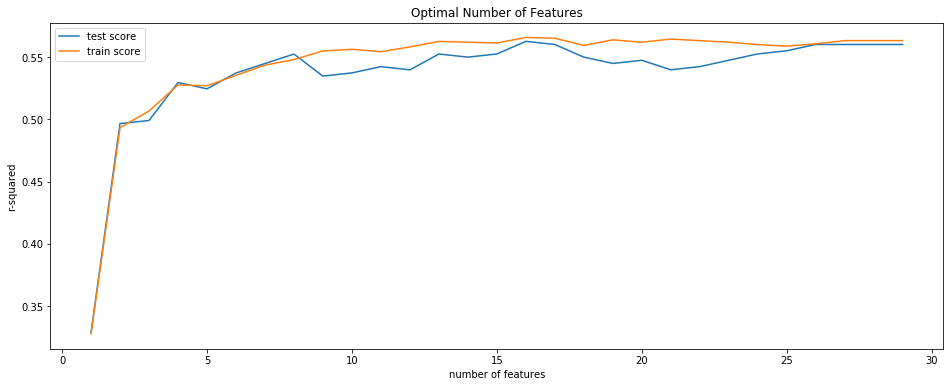

In [20]:
# plotting cv results
plt.figure(figsize=(16,6))

plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

### Similarly explore other algorithms by building models like:
- KNN
- SVM
- Decision Tree
- Random Forest
- XGBoost

# SVM

In [47]:
#Code used to split the data set into data set Train and data set test of 80-20
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2, stratify=y, 
                                                    random_state = 4)

model = SVC(C = 1, kernel='rbf')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [52]:
# confusion matrix
print("Confusion matrix",confusion_matrix(y_true=y_test, y_pred=y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

Confusion matrix [[56853    11]
 [   58    40]]
accuracy 0.9987886661282961
precision 0.7843137254901961
recall 0.40816326530612246


In [48]:
# creating a KFold object with 5 splits 
folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# specify range of hyperparameters
# Set the parameters by cross-validation
hyper_params = [ {'gamma': [1e-2, 1e-3, 1e-4],
                     'C': [1, 10, 100, 1000]}]

# specify model
model = SVC(kernel="rbf")

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring= 'accuracy', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed: 104.1min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid=[{'C': [1, 10, 100, 1000],
                          'gamma': [0.01, 0.001, 0.0001]}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='accuracy', verbose=1)

In [49]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,150.922046,14.944982,6.039222,0.415129,1,0.01,"{'C': 1, 'gamma': 0.01}",0.999188,0.998925,0.999342,...,0.999153,0.000134,10,0.999589,0.999600,0.999550,0.999545,0.999567,0.999570,0.000021
1,337.407257,280.289865,1.988754,0.032066,1,0.001,"{'C': 1, 'gamma': 0.001}",0.999078,0.999122,0.999364,...,0.999249,0.000124,7,0.999364,0.999364,0.999336,0.999287,0.999325,0.999335,0.000028
2,175.970707,241.601916,1.176278,0.089603,1,0.0001,"{'C': 1, 'gamma': 0.0001}",0.999056,0.998969,0.999188,...,0.999131,0.000102,11,0.999215,0.999161,0.999117,0.999128,0.999133,0.999151,0.000035
3,113.439148,5.858971,5.297673,0.188875,10,0.01,"{'C': 10, 'gamma': 0.01}",0.999166,0.998969,0.999451,...,0.999210,0.000155,8,0.999830,0.999830,0.999792,0.999792,0.999792,0.999807,0.000019
4,35.244442,5.505636,1.685488,0.040706,10,0.001,"{'C': 10, 'gamma': 0.001}",0.999320,0.999298,0.999561,...,0.999438,0.000110,1,0.999561,0.999578,0.999506,0.999506,0.999545,0.999539,0.000029
5,71.209801,122.199190,0.712333,0.030905,10,0.0001,"{'C': 10, 'gamma': 0.0001}",0.999188,0.999232,0.999451,...,0.999350,0.000117,5,0.999418,0.999402,0.999342,0.999347,0.999358,0.999373,0.000031
6,90.371112,14.814823,4.442715,0.258868,100,0.01,"{'C': 100, 'gamma': 0.01}",0.999166,0.998903,0.999386,...,0.999166,0.000159,9,0.999912,0.999940,0.999901,0.999918,0.999901,0.999914,0.000014
7,27.223616,3.591467,0.898811,0.043842,100,0.001,"{'C': 100, 'gamma': 0.001}",0.999298,0.999232,0.999495,...,0.999377,0.000098,4,0.999698,0.999709,0.999660,0.999643,0.999682,0.999679,0.000024
8,13.039390,0.978928,0.678407,0.087434,100,0.0001,"{'C': 100, 'gamma': 0.0001}",0.999210,0.999320,0.999539,...,0.999407,0.000123,3,0.999484,0.999523,0.999468,0.999479,0.999473,0.999485,0.000019
9,37.968502,5.382164,1.339196,0.063407,1000,0.01,"{'C': 1000, 'gamma': 0.01}",0.999034,0.998793,0.999210,...,0.999039,0.000139,12,0.999967,0.999973,0.999973,0.999967,0.999973,0.999970,0.000003


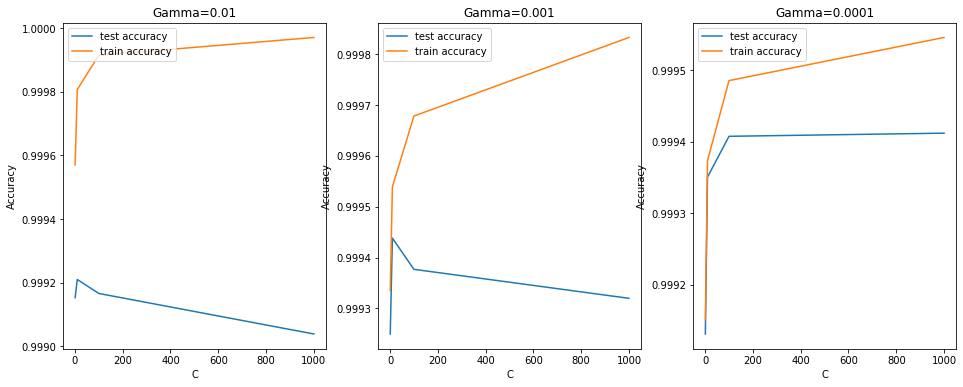

In [58]:
# converting C to numeric type for plotting on x-axis
cv_results['param_C'] = cv_results['param_C'].astype('int')

# # plotting
plt.figure(figsize=(16,6))

# subplot 1/3
plt.subplot(131)
gamma_01 = cv_results[cv_results['param_gamma']==0.01]

plt.plot(gamma_01["param_C"], gamma_01["mean_test_score"])
plt.plot(gamma_01["param_C"], gamma_01["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.01")
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')

# subplot 2/3
plt.subplot(132)
gamma_001 = cv_results[cv_results['param_gamma']==0.001]

plt.plot(gamma_001["param_C"], gamma_001["mean_test_score"])
plt.plot(gamma_001["param_C"], gamma_001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.001")
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')


# subplot 3/3
plt.subplot(133)
gamma_0001 = cv_results[cv_results['param_gamma']==0.0001]

plt.plot(gamma_0001["param_C"], gamma_0001["mean_test_score"])
plt.plot(gamma_0001["param_C"], gamma_0001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.0001")
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')

In [59]:
# printing the optimal accuracy score and hyperparameters
best_score = model_cv.best_score_
best_hyperparams = model_cv.best_params_

print("The best test score is {0} corresponding to hyperparameters {1}".format(best_score, best_hyperparams))

The best test score is 0.9994382145756985 corresponding to hyperparameters {'C': 10, 'gamma': 0.001}


In [60]:
# specify optimal hyperparameters
best_params = {"C": 10, "gamma": 0.001, "kernel":"rbf"}

# model
model = SVC(C=10, gamma=0.001, kernel="rbf")

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# metrics
print(metrics.confusion_matrix(y_test, y_pred), "\n")
print("accuracy", metrics.accuracy_score(y_test, y_pred))
print("precision", metrics.precision_score(y_test, y_pred))
print("sensitivity/recall", metrics.recall_score(y_test, y_pred))

[[56856     8]
 [   22    76]] 

accuracy 0.9994733330992591
precision 0.9047619047619048
sensitivity/recall 0.7755102040816326


# Decision Tree

In [61]:
# Importing decision tree classifier from sklearn library

# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.20, 
                                                    stratify=y, 
                                                    random_state = 99)

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(max_depth=5)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [62]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics


# Making predictions
y_pred_default = dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred_default))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.86      0.83      0.84        98

    accuracy                           1.00     56962
   macro avg       0.93      0.91      0.92     56962
weighted avg       1.00      1.00      1.00     56962



In [63]:
# Printing confusion matrix and accuracy
print(confusion_matrix(y_test,y_pred_default))
print(accuracy_score(y_test,y_pred_default))

[[56851    13]
 [   17    81]]
0.9994733330992591


In [64]:
# Putting features
features = list(df.columns[1:])
features

['V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'Amount',
 'Class']

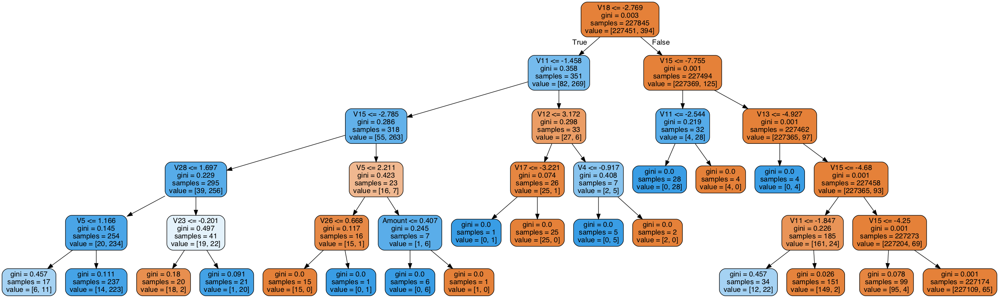

In [65]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,
                feature_names=features, filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [72]:
# Tuning max_depth
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'max_depth': range(1, 30)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = None)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
tree.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
     

In [74]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.671754,0.031400,0.008392,0.000502,1,{'max_depth': 1},0.999056,0.999100,0.999100,0.999034,...,0.999061,0.000035,29,0.999100,0.999078,0.999084,0.999095,0.999095,0.999090,0.000008
1,1.316448,0.032248,0.007808,0.001770,2,{'max_depth': 2},0.999166,0.999320,0.999188,0.999210,...,0.999232,0.000057,13,0.999287,0.999287,0.999292,0.999320,0.999303,0.999298,0.000013
2,1.947449,0.084753,0.006721,0.001544,3,{'max_depth': 3},0.999166,0.999386,0.999276,0.999210,...,0.999271,0.000078,11,0.999320,0.999386,0.999402,0.999353,0.999397,0.999371,0.000031
3,2.615751,0.132047,0.006351,0.001893,4,{'max_depth': 4},0.999144,0.999386,0.999254,0.999473,...,0.999315,0.000112,7,0.999479,0.999418,0.999418,0.999462,0.999424,0.999440,0.000025
4,3.114107,0.092301,0.005807,0.001294,5,{'max_depth': 5},0.999386,0.999539,0.999232,0.999451,...,0.999386,0.000106,3,0.999578,0.999528,0.999589,0.999594,0.999550,0.999568,0.000025


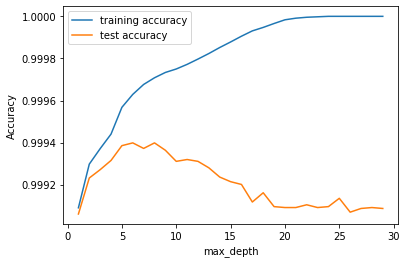

In [75]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [76]:
# Tuning min_samples_leaf
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
tree.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=100,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
      

In [77]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,9.923547,1.350771,0.009065,0.001438,5,{'min_samples_leaf': 5},0.999364,0.999473,0.999210,0.999517,...,0.999364,0.000119,1,0.999632,0.999561,0.999649,0.999589,0.999583,0.999603,0.000033
1,9.858236,1.829259,0.008570,0.001574,25,{'min_samples_leaf': 25},0.999188,0.999364,0.999100,0.999429,...,0.999285,0.000121,2,0.999429,0.999358,0.999468,0.999418,0.999369,0.999409,0.000040
2,9.300285,1.257241,0.008894,0.002001,45,{'min_samples_leaf': 45},0.999122,0.999144,0.999144,0.999100,...,0.999140,0.000029,3,0.999144,0.999188,0.999139,0.999199,0.999183,0.999170,0.000024
3,9.203213,1.070112,0.010652,0.001956,65,{'min_samples_leaf': 65},0.999056,0.998903,0.999100,0.999034,...,0.999012,0.000069,10,0.999100,0.999128,0.999084,0.999122,0.999100,0.999107,0.000016
4,8.457882,1.072489,0.009979,0.001308,85,{'min_samples_leaf': 85},0.999056,0.999100,0.999100,0.999034,...,0.999061,0.000035,4,0.999100,0.999078,0.999084,0.999095,0.999095,0.999090,0.000008


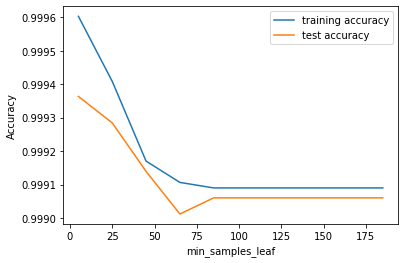

In [78]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [79]:
# Tuning min_samples_split
# GridSearchCV to find optimal min_samples_split

# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True)
tree.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=100,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
      

In [80]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,9.546130,1.340441,0.010805,0.001941,5,{'min_samples_split': 5},0.999078,0.999166,0.998991,0.999298,...,0.999135,0.000102,10,0.999984,0.999934,0.999962,0.999956,0.999945,0.999956,0.000017
1,9.571830,1.144712,0.009664,0.001381,25,{'min_samples_split': 25},0.999144,0.999254,0.999100,0.999298,...,0.999210,0.000075,1,0.999742,0.999726,0.999802,0.999737,0.999770,0.999755,0.000028
2,9.512449,1.196967,0.009545,0.003297,45,{'min_samples_split': 45},0.999056,0.999144,0.998969,0.999342,...,0.999140,0.000126,9,0.999638,0.999578,0.999654,0.999649,0.999638,0.999631,0.000028
3,9.428972,1.247707,0.009148,0.001356,65,{'min_samples_split': 65},0.999056,0.999166,0.998991,0.999342,...,0.999157,0.000125,8,0.999632,0.999556,0.999632,0.999600,0.999550,0.999594,0.000036
4,9.513408,1.154167,0.010175,0.003203,85,{'min_samples_split': 85},0.999122,0.999188,0.999034,0.999276,...,0.999175,0.000088,4,0.999528,0.999528,0.999600,0.999490,0.999545,0.999538,0.000036


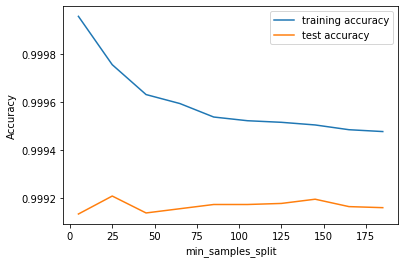

In [81]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [85]:
# Grid Search to Find Optimal Hyperparameters
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(100, 200, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, return_train_score=True)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:  6.4min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
     

In [86]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,3.984746,0.163356,0.008298,0.002567,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.999056,0.998881,0.999078,0.998991,0.998969,0.998995,0.000070,13
1,3.992262,0.125322,0.008910,0.000639,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.999056,0.998881,0.999078,0.998991,0.998969,0.998995,0.000070,13
2,3.885726,0.059326,0.008628,0.001860,entropy,5,150,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.999056,0.999056,0.999078,0.998991,0.998969,0.999030,0.000043,9
3,3.812200,0.035107,0.006070,0.001528,entropy,5,150,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.999056,0.999056,0.999078,0.998991,0.998969,0.999030,0.000043,9
4,5.383708,0.484001,0.007470,0.001576,entropy,10,100,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.999056,0.998881,0.999078,0.998991,0.998969,0.998995,0.000070,13
5,6.671012,0.423223,0.009567,0.001910,entropy,10,100,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.999056,0.998881,0.999078,0.998991,0.998969,0.998995,0.000070,13
6,6.138119,0.512833,0.007613,0.001657,entropy,10,150,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.999056,0.999056,0.999078,0.998991,0.998969,0.999030,0.000043,9
7,5.596589,0.533073,0.008628,0.001954,entropy,10,150,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.999056,0.999056,0.999078,0.998991,0.998969,0.999030,0.000043,9
8,3.132279,0.022901,0.008049,0.001784,gini,5,100,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.999056,0.999100,0.999100,0.999034,0.999012,0.999061,0.000035,1
9,3.108914,0.033237,0.007478,0.001782,gini,5,100,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.999056,0.999100,0.999100,0.999034,0.999012,0.999061,0.000035,1


In [87]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.9990607649937457
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


In [89]:
# tree with max_depth = 3
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=5, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)
clf_gini.fit(X_train, y_train)

# score
print(clf_gini.score(X_test,y_test))

0.9992099996488887


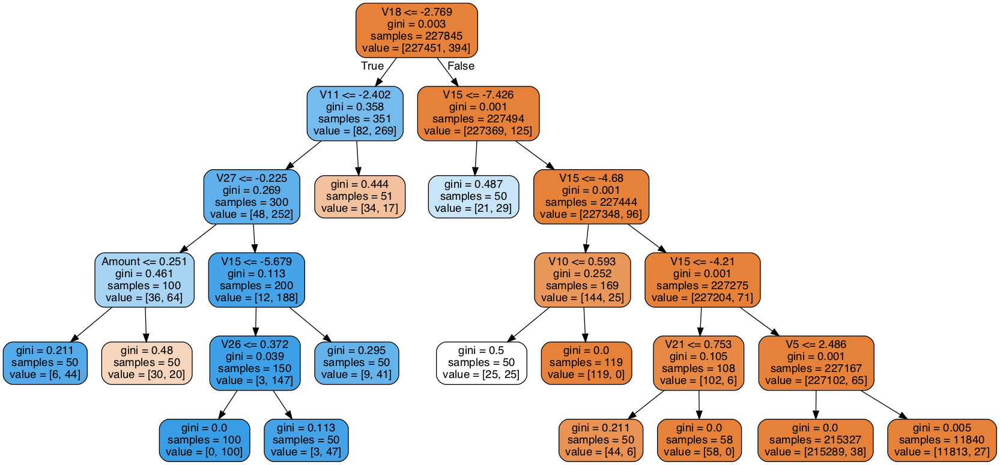

In [90]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [91]:
# classification metrics
y_pred = clf_gini.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.85      0.65      0.74        98

    accuracy                           1.00     56962
   macro avg       0.93      0.83      0.87     56962
weighted avg       1.00      1.00      1.00     56962



In [92]:
# confusion matrix
print(confusion_matrix(y_test,y_pred))

[[56853    11]
 [   34    64]]


# Random Forest

In [15]:

# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, 
                                                    random_state=101)

# Running the random forest with default parameters.
rfc = RandomForestClassifier()

# fit
rfc.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [16]:
# Making predictions
predictions = rfc.predict(X_test)

In [17]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.98      0.86      0.91        98

    accuracy                           1.00     56962
   macro avg       0.99      0.93      0.96     56962
weighted avg       1.00      1.00      1.00     56962



In [18]:
# Printing confusion matrix
print(confusion_matrix(y_test,predictions))

[[56862     2]
 [   14    84]]


In [19]:
print(accuracy_score(y_test,predictions))

0.9997191109862715


In [23]:
# Tuning max_features

# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'max_features': [4, 8, 14, 20, 24]}

# instantiate the model
rf = RandomForestClassifier(max_depth=4)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", 
                  return_train_score=True)

rf.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=4,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                            

In [24]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,26.130277,0.191677,0.145665,0.010892,4,{'max_features': 4},0.999342,0.999210,0.999342,0.998991,...,0.999197,0.000137,5,0.999325,0.999336,0.999292,0.999287,0.999243,0.999297,0.000033
1,49.338150,0.101060,0.135735,0.001523,8,{'max_features': 8},0.999429,0.999342,0.999364,0.999232,...,0.999337,0.000064,4,0.999484,0.999484,0.999479,0.999534,0.999490,0.999494,0.000020
2,84.858523,0.688224,0.137869,0.002609,14,{'max_features': 14},0.999495,0.999386,0.999342,0.999298,...,0.999390,0.000069,2,0.999545,0.999545,0.999512,0.999583,0.999556,0.999548,0.000023
3,122.021143,1.677853,0.138826,0.003135,20,{'max_features': 20},0.999495,0.999342,0.999320,0.999298,...,0.999381,0.000078,3,0.999545,0.999517,0.999539,0.999589,0.999561,0.999550,0.000024
4,144.421619,0.990508,0.135840,0.002173,24,{'max_features': 24},0.999451,0.999407,0.999429,0.999298,...,0.999412,0.000061,1,0.999550,0.999550,0.999572,0.999594,0.999561,0.999565,0.000016


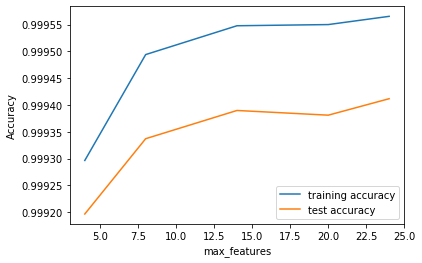

In [25]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [104]:
# Tuning min_samples_leaf
# GridSearchCV to find optimal min_samples_leaf
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", 
                  return_train_score=True)

rf.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                         

In [105]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,99.149803,1.628769,0.299328,0.017913,100,{'min_samples_leaf': 100},0.999144,0.999012,0.999210,0.998903,...,0.999052,0.000111,1,0.999018,0.999078,0.999045,0.999122,0.999095,0.999072,0.000037
1,97.411793,3.122006,0.295959,0.011459,150,{'min_samples_leaf': 150},0.999078,0.998925,0.998991,0.998859,...,0.998947,0.000080,2,0.998908,0.998974,0.998892,0.999089,0.998974,0.998967,0.000070
2,98.226368,6.249017,0.296147,0.016522,200,{'min_samples_leaf': 200},0.998815,0.998837,0.998815,0.998749,...,0.998767,0.000080,3,0.998722,0.998820,0.998623,0.998826,0.998820,0.998762,0.000080
3,90.208755,3.093578,0.274791,0.007643,250,{'min_samples_leaf': 250},0.998288,0.998266,0.998266,0.998266,...,0.998271,0.000009,4,0.998266,0.998272,0.998272,0.998272,0.998272,0.998271,0.000002
4,86.448133,2.520808,0.276570,0.016174,300,{'min_samples_leaf': 300},0.998288,0.998266,0.998266,0.998266,...,0.998271,0.000009,4,0.998266,0.998272,0.998272,0.998272,0.998272,0.998271,0.000002


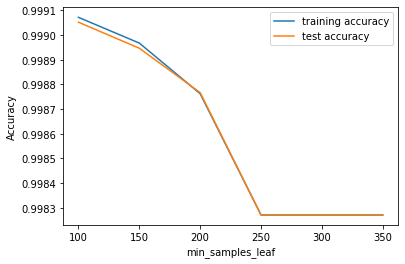

In [106]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [107]:
# Tuning min_samples_split
# GridSearchCV to find optimal min_samples_split
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", 
                  return_train_score=True)

rf.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                         

In [108]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,118.498369,2.276370,0.328458,0.013703,200,{'min_samples_split': 200},0.999298,0.999232,0.999298,0.999122,...,0.999228,0.000067,1,0.999265,0.999287,0.999254,0.999298,0.999309,0.999282,0.000020
1,122.898063,3.317816,0.350146,0.037551,250,{'min_samples_split': 250},0.999298,0.999144,0.999276,0.998991,...,0.999184,0.000111,3,0.999221,0.999259,0.999215,0.999215,0.999270,0.999236,0.000024
2,130.156749,2.819712,0.366587,0.047085,300,{'min_samples_split': 300},0.999298,0.999188,0.999298,0.999056,...,0.999197,0.000093,2,0.999270,0.999265,0.999254,0.999254,0.999287,0.999266,0.000012
3,119.722778,6.074884,0.337508,0.018110,350,{'min_samples_split': 350},0.999276,0.999144,0.999276,0.998991,...,0.999170,0.000105,5,0.999248,0.999210,0.999194,0.999221,0.999276,0.999230,0.000029
4,122.046762,2.897834,0.342229,0.022255,400,{'min_samples_split': 400},0.999276,0.999188,0.999254,0.999012,...,0.999170,0.000096,4,0.999237,0.999205,0.999221,0.999226,0.999199,0.999218,0.000014


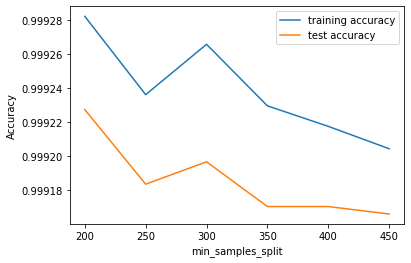

In [109]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [30]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1, return_train_score=True)

In [31]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 73.7min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 102.1min finished


GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [32]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9990695427946507 using {'max_depth': 8, 'max_features': 10, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 200}


In [33]:
# Fitting the final model with the best parameters obtained from grid search.
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=8,
                             min_samples_leaf=100, 
                             min_samples_split=200,
                             max_features=10,
                             n_estimators=200)

In [34]:
rfc.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=8, max_features=10,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=200,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [38]:
# evaluation metrics
print(classification_report(y_test,predictions))
print(confusion_matrix(y_test,predictions))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.98      0.86      0.91        98

    accuracy                           1.00     56962
   macro avg       0.99      0.93      0.96     56962
weighted avg       1.00      1.00      1.00     56962

[[56862     2]
 [   14    84]]


# XGBoost

In [ ]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.20, 
                                                    stratify=y, 
                                                    random_state = 99)

# Fitting the decision tree with default hyperparameters, apart from
model = XGBClassifier()
eval_set=[(X_train, y_train), (X_test, y_test)]
model.fit(X_train, y_train, eval_metric=['auc','error','logloss'], 
          eval_set=eval_set, verbose=True)

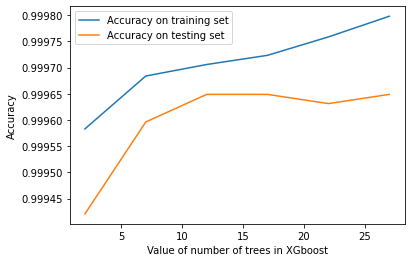

In [197]:
tree_range = range(2, 30, 5)
score1=[]
score2=[]
for tree in tree_range:
    xgb=XGBClassifier(n_estimators=tree)
    xgb.fit(X_train,y_train)
    score1.append(xgb.score(X_train,y_train))
    score2.append(xgb.score(X_test,y_test))
    
%matplotlib inline
plt.plot(tree_range,score1,label= 'Accuracy on training set')
plt.plot(tree_range,score2,label= 'Accuracy on testing set')
plt.xlabel('Value of number of trees in XGboost')
plt.ylabel('Accuracy')
plt.legend()

In [198]:
# make predictions for test data
# use predict_proba since we need probabilities to compute auc
y_pred = model.predict_proba(X_test)
y_pred[:10]

array([[9.9999881e-01, 1.1636231e-06],
       [9.9999917e-01, 8.3922629e-07],
       [9.9982482e-01, 1.7520296e-04],
       [9.9999774e-01, 2.2859303e-06],
       [9.9999851e-01, 1.5085935e-06],
       [9.9999779e-01, 2.1772619e-06],
       [9.9999005e-01, 9.9787449e-06],
       [9.9999994e-01, 3.9718508e-08],
       [9.9999321e-01, 6.7805381e-06],
       [9.9998766e-01, 1.2312115e-05]], dtype=float32)

In [199]:
# evaluate predictions
roc = metrics.roc_auc_score(y_test, y_pred[:, 1])
print("AUC: %.2f%%" % (roc * 100.0))

AUC: 99.89%


In [200]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# specify range of hyperparameters
param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          

# specify model
xgb_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb_model, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      


In [201]:
# fit the model
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:  7.0min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=200, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=Non

In [202]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,11.028997,2.252272,0.099298,0.016753,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.978957,0.969911,0.948046,...,0.968719,0.010839,5,0.998848,0.999471,0.999700,0.999241,0.999482,0.999348,0.000289
1,14.171257,1.738461,0.086968,0.003862,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.988055,0.971585,0.956662,...,0.975616,0.010880,1,0.999787,0.999884,0.999833,0.999691,0.999816,0.999802,0.000064
2,15.654899,0.963580,0.087780,0.005195,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.988374,0.972614,0.953308,...,0.975355,0.012684,2,0.999709,0.999759,0.999906,0.999743,0.999797,0.999783,0.000068
3,10.186113,0.124257,0.086428,0.001603,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.979593,0.949980,0.938939,...,0.960636,0.014416,6,0.999963,0.999895,0.999855,0.999952,0.999986,0.999930,0.000048
4,14.984964,0.935501,0.100077,0.007007,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.979098,0.964928,0.944376,...,0.972506,0.016504,4,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
5,15.209031,1.017935,0.093145,0.006720,0.6,0.9,"{'learning_rate': 0.6, 'subsample': 0.9}",0.988447,0.971716,0.951507,...,0.972631,0.012334,3,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000


In [204]:
# convert parameters to int for plotting on x-axis
cv_results['param_learning_rate'] = cv_results['param_learning_rate'].astype('float')
#cv_results['param_max_depth'] = cv_results['param_max_depth'].astype('float')
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,11.028997,2.252272,0.099298,0.016753,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.978957,0.969911,0.948046,...,0.968719,0.010839,5,0.998848,0.999471,0.999700,0.999241,0.999482,0.999348,0.000289
1,14.171257,1.738461,0.086968,0.003862,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.988055,0.971585,0.956662,...,0.975616,0.010880,1,0.999787,0.999884,0.999833,0.999691,0.999816,0.999802,0.000064
2,15.654899,0.963580,0.087780,0.005195,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.988374,0.972614,0.953308,...,0.975355,0.012684,2,0.999709,0.999759,0.999906,0.999743,0.999797,0.999783,0.000068
3,10.186113,0.124257,0.086428,0.001603,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.979593,0.949980,0.938939,...,0.960636,0.014416,6,0.999963,0.999895,0.999855,0.999952,0.999986,0.999930,0.000048
4,14.984964,0.935501,0.100077,0.007007,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.979098,0.964928,0.944376,...,0.972506,0.016504,4,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000


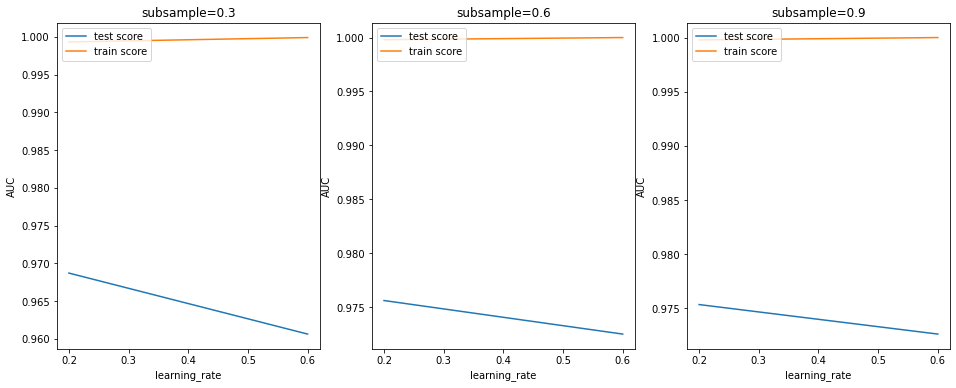

In [205]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    #plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    #plt.xscale('log')

In [206]:
# chosen hyperparameters
# 'objective':'binary:logistic' outputs probability rather than label, which we need for auc

#The results show that a subsample size of 0.6 and learning_rate of about 0.2 seems optimal.
#Also, XGBoost has resulted in the highest ROC AUC obtained (across various hyperparameters).

params = {'learning_rate': 0.2,
          'max_depth': 2, 
          'n_estimators':200,
          'subsample':0.6,
         'objective':'binary:logistic'}

# fit model on training data
model = XGBClassifier(params = params)
model.fit(X_train, y_train)

[17:02:31] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:480: 
Parameters: { params } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              params={'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 200,
                      'objective': 'binary:logistic', 'subsample': 0.6},
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [207]:
y_pred = model.predict_proba(X_test)
y_pred[:10]

array([[9.9999905e-01, 9.3335473e-07],
       [9.9999422e-01, 5.7812849e-06],
       [9.9993497e-01, 6.5025066e-05],
       [9.9999785e-01, 2.1335156e-06],
       [9.9999869e-01, 1.3056863e-06],
       [9.9999720e-01, 2.7850165e-06],
       [9.9999976e-01, 2.2938762e-07],
       [9.9999970e-01, 3.2137683e-07],
       [9.9999940e-01, 5.9622261e-07],
       [9.9999863e-01, 1.3847372e-06]], dtype=float32)

In [208]:
# roc_auc
auc = sklearn.metrics.roc_auc_score(y_test, y_pred[:, 1])
auc

0.9887097248860152

In [209]:
# feature importance
importance = dict(zip(X_train.columns, model.feature_importances_))
importance

{'V1': 0.027118657,
 'V2': 0.014137689,
 'V3': 0.021015912,
 'V4': 0.03620989,
 'V5': 0.018065598,
 'V6': 0.016495416,
 'V7': 0.02596658,
 'V8': 0.021119943,
 'V9': 0.018197294,
 'V10': 0.051744387,
 'V11': 0.0192247,
 'V12': 0.030961204,
 'V13': 0.01365831,
 'V14': 0.0644424,
 'V15': 0.011194863,
 'V16': 0.018428164,
 'V17': 0.36957818,
 'V18': 0.023805195,
 'V19': 0.015802082,
 'V20': 0.01640921,
 'V21': 0.012641866,
 'V22': 0.017760007,
 'V23': 0.011452476,
 'V24': 0.015801847,
 'V25': 0.011313425,
 'V26': 0.02547122,
 'V27': 0.035958864,
 'V28': 0.018070128,
 'Amount': 0.017954437}

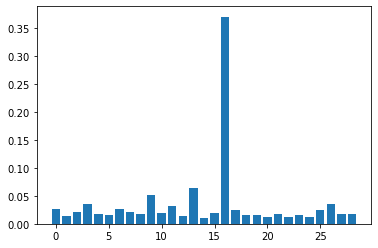

In [210]:
# plot
plt.bar(range(len(model.feature_importances_)), model.feature_importances_)
plt.show()

#### Proceed with the model which shows the best result 
- Apply the best hyperparameter on the model
- Predict on the test dataset

In [212]:
clf = XGBClassifier(params = params)  #initialise the model with optimum hyperparameters
clf.fit(X_train, y_train)

#print the evaluation score on the X_test by choosing the best evaluation metric
accuracy = sklearn.metrics.accuracy_score(y_test, predictions)
precision=sklearn.metrics.precision_score(y_test, predictions)
recall=sklearn.metrics.recall_score(y_test, predictions)
roc=sklearn.metrics.roc_auc_score(y_test,predictions)
print("Accuracy: %.2f%% " % (accuracy * 100.0))
print("Precision: %.2f%% " % (precision *100))
print("Recall: %.2f%% " % (recall * 100))
print("AUC: %.2f%% " % (roc *100))

[17:05:18] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:480: 
Parameters: { params } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Accuracy: 99.65% 
Precision: 0.00% 
Recall: 0.00% 
AUC: 49.91% 


### Print the important features of the best model to understand the dataset
- This will not give much explanation on the already transformed dataset
- But it will help us in understanding if the dataset is not PCA transformed

Top var = 17
2nd Top var = 14
3rd Top var = 10


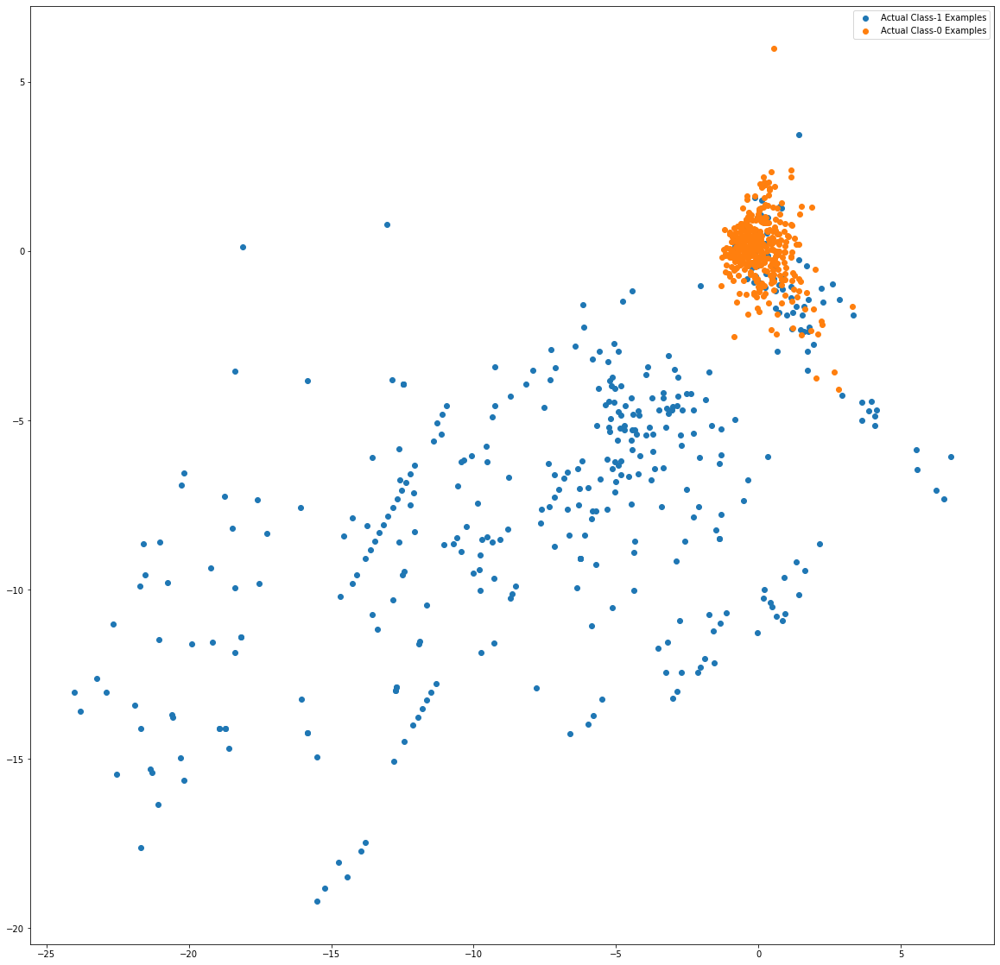

In [213]:
var_imp = []
for i in clf.feature_importances_:
    var_imp.append(i)
print('Top var =', var_imp.index(np.sort(clf.feature_importances_)[-1])+1)
print('2nd Top var =', var_imp.index(np.sort(clf.feature_importances_)[-2])+1)
print('3rd Top var =', var_imp.index(np.sort(clf.feature_importances_)[-3])+1)

# Variable on Index-16 and Index-13 seems to be the top 2 variables
top_var_index = var_imp.index(np.sort(clf.feature_importances_)[-1])
second_top_var_index = var_imp.index(np.sort(clf.feature_importances_)[-2])

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]

np.random.shuffle(X_train_0)

import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]

plt.scatter(X_train_1[:, top_var_index], X_train_1[:, second_top_var_index], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], top_var_index], X_train_0[:X_train_1.shape[0], second_top_var_index],
            label='Actual Class-0 Examples')
plt.legend()

## Model building with balancing Classes

##### Perform class balancing with :
- Random Oversampling
- SMOTE
- ADASYN

## Model Building
- Build different models on the balanced dataset and see the result

### Random Oversampling

In [73]:
#Random Oversampling
#Code used to split the data set into data set Train and data set test of 80-20
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.20, 
                                                    stratify=y, 
                                                    random_state = 99)

ros = RandomOverSampler(sampling_strategy='minority')
X_train, y_train = ros.fit_resample(X, y)

print(sorted(Counter(y_train).items()))

[(0, 284315), (1, 284315)]


### Logistic Regression

In [15]:
#Logist Regression

for i in range (2,29):
    # specify model
    lm = LogisticRegression()
    lm.fit(X_train,y_train)
    
    rfe=RFE(lm,i)
    rfe = rfe.fit(X_train, y_train)
    
    # tuples of (feature name, whether selected, ranking)
    list(zip(X_train.columns,rfe.support_,rfe.ranking_))
    
    # predict prices of X_test
    y_pred = rfe.predict(X_test)
    
    # evaluate the model on test set
    r2 = sklearn.metrics.r2_score(y_test, y_pred)
    print('{0}. RFE Score {1} with number of features={2}'.format(i-1,r2,i))

print('\n')
# k-fold CV (using all the 29 variables)
for i in range (2,10):
    cv_num = cross_val_score(lm, X_train, y_train, scoring='r2', cv=i)
    print('cv = {0}, mean value is {1}'.format(i,round(cv_num.mean(),2)*100))


1. RFE Score -19.402448233091764 with number of features=2
2. RFE Score -14.812919547391264 with number of features=3
3. RFE Score -12.66636938258702 with number of features=4
4. RFE Score -12.359719359043556 with number of features=5
5. RFE Score -12.932132736324688 with number of features=6
6. RFE Score -13.73964446498914 with number of features=7
7. RFE Score -13.25922609477105 with number of features=8
8. RFE Score -12.778807724552957 with number of features=9
9. RFE Score -11.961074328437054 with number of features=10
10. RFE Score -12.042847668048644 with number of features=11
11. RFE Score -12.175729344917478 with number of features=12
12. RFE Score -12.032626000597196 with number of features=13
13. RFE Score -11.725975977053732 with number of features=14
14. RFE Score -12.053069335500092 with number of features=15
15. RFE Score -11.950852660985605 with number of features=16
16. RFE Score -11.9917393307914 with number of features=17
17. RFE Score -12.257502684529069 with number 

#### perfom cross validation on the X_train & y_train to create:
- X_train_cv
- X_test_cv 
- y_train_cv
- y_test_cv 

In [17]:
from sklearn.model_selection import GridSearchCV

#perform cross validation
# creating a KFold object with 5 splits 
folds = StratifiedKFold(n_splits = 4, shuffle = False, random_state = None)

#perform hyperparameter tuning
hyper_params = [{'n_features_to_select': list(range(1, 30))}]

# step-3: perform grid search
# 3.1 specify model
lm = LogisticRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm)     

#print the evaluation result by choosing a evaluation metric
model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)

# fit the model
model_cv.fit(X_train, y_train)  


Fitting 4 folds for each of 29 candidates, totalling 116 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 116 out of 116 | elapsed: 47.2min finished


GridSearchCV(cv=StratifiedKFold(n_splits=4, random_state=None, shuffle=False),
             estimator=RFE(estimator=LogisticRegression()),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                   10, 11, 12, 13, 14, 15, 16,
                                                   17, 18, 19, 20, 21, 22, 23,
                                                   24, 25, 26, 27, 28, 29]}],
             return_train_score=True, scoring='r2', verbose=1)

In [18]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,34.404055,3.159238,0.006765,0.001529,1,{'n_features_to_select': 1},0.696028,0.699630,0.657027,0.662570,0.678814,0.019158,29,0.673967,0.671631,0.681912,0.693730,0.680310,0.008634
1,35.099441,1.658509,0.008349,0.000702,2,{'n_features_to_select': 2},0.706580,0.747971,0.686206,0.714231,0.713747,0.022256,28,0.702602,0.720901,0.714317,0.732325,0.717536,0.010764
2,34.993173,2.654360,0.008207,0.001459,3,{'n_features_to_select': 3},0.746873,0.757143,0.708576,0.735447,0.737010,0.018122,27,0.743130,0.734351,0.747313,0.740504,0.741324,0.004702
3,34.594069,1.059143,0.009743,0.001580,4,{'n_features_to_select': 4},0.751713,0.760407,0.715188,0.743439,0.742687,0.016972,26,0.754807,0.743102,0.753157,0.745972,0.749259,0.004865
4,35.871026,2.392171,0.010836,0.001691,5,{'n_features_to_select': 5},0.751403,0.768792,0.715244,0.742229,0.744417,0.019357,25,0.756805,0.753897,0.762939,0.746741,0.755096,0.005824
5,32.846391,1.790571,0.010457,0.001057,6,{'n_features_to_select': 6},0.762855,0.771634,0.730523,0.759702,0.756179,0.015444,23,0.773978,0.758108,0.771662,0.760491,0.766060,0.006861
6,32.532054,1.055134,0.011018,0.000981,7,{'n_features_to_select': 7},0.741133,0.787335,0.734660,0.755819,0.754737,0.020322,24,0.768182,0.775216,0.776577,0.759338,0.769828,0.006844
7,32.784405,1.385103,0.010938,0.000740,8,{'n_features_to_select': 8},0.761336,0.790655,0.740146,0.768650,0.765197,0.018045,22,0.788000,0.780778,0.779541,0.771934,0.780063,0.005698
8,31.350006,1.019565,0.011583,0.001383,9,{'n_features_to_select': 9},0.760801,0.782636,0.744311,0.778358,0.766527,0.015214,21,0.787109,0.775122,0.778406,0.784943,0.781395,0.004835
9,32.630571,3.893096,0.011915,0.002355,10,{'n_features_to_select': 10},0.756665,0.786829,0.752218,0.774559,0.767568,0.013914,19,0.783451,0.777486,0.782917,0.783714,0.781892,0.002560


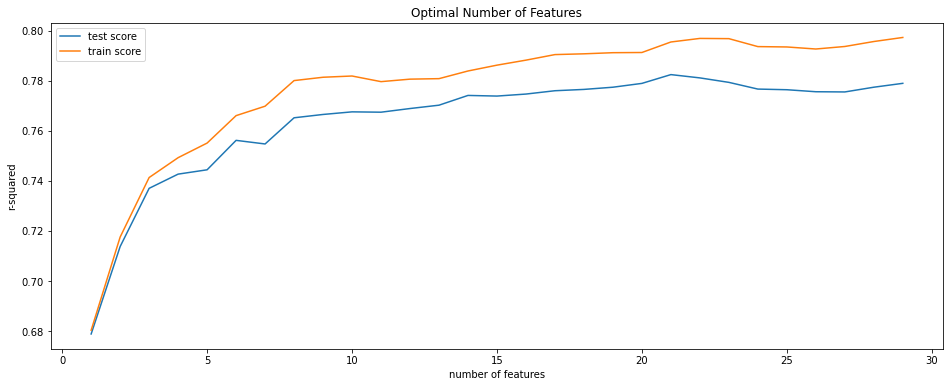

In [19]:
# plotting cv results
plt.figure(figsize=(16,6))

plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

In [20]:
# final model
n_features_optimal = 20

lm = LogisticRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = lm.predict(X_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

-12.134842675111683


### Similarly explore other algorithms on balanced dataset by building models like:
- KNN
- SVM
- Decision Tree
- Random Forest
- XGBoost

# Decision Tree

In [11]:
# Importing decision tree classifier from sklearn library

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(max_depth=5)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5)

In [12]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics


# Making predictions
y_pred_default = dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred_default))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     56864
           1       0.08      0.99      0.15        98

    accuracy                           0.98     56962
   macro avg       0.54      0.99      0.57     56962
weighted avg       1.00      0.98      0.99     56962



In [13]:
# Printing confusion matrix and accuracy
print(confusion_matrix(y_test,y_pred_default))
print(accuracy_score(y_test,y_pred_default))

[[55755  1109]
 [    1    97]]
0.9805133246725888


In [14]:
# Putting features
features = list(df.columns[1:])
features

['V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'Amount',
 'Class']

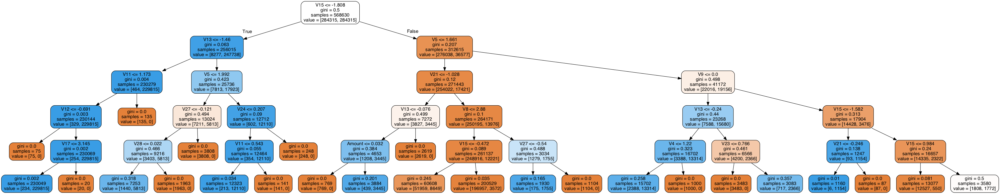

In [16]:
# plotting tree with max_depth=3

dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,
                feature_names=features, filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [17]:
# Tuning max_depth
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'max_depth': range(1, 30)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = None)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
tree.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': range(1, 30)}, return_train_score=True,
             scoring='accuracy')

In [18]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.055405,0.079386,0.014694,0.001773,1,{'max_depth': 1},0.926428,0.928249,0.923456,0.913485,...,0.921117,0.006227,28,0.919792,0.919337,0.920535,0.923026,0.922907,0.921119,0.001556
1,2.018229,0.083666,0.013431,0.000956,2,{'max_depth': 2},0.926428,0.928249,0.923456,0.913485,...,0.921117,0.006227,28,0.919792,0.919337,0.920535,0.923026,0.922907,0.921119,0.001556
2,3.065169,0.317461,0.013621,0.002332,3,{'max_depth': 3},0.930517,0.941544,0.937657,0.936277,...,0.937154,0.003774,27,0.939356,0.938840,0.938143,0.938484,0.938229,0.938610,0.000445
3,3.759453,0.367185,0.014697,0.002685,4,{'max_depth': 4},0.943592,0.959341,0.947875,0.944428,...,0.948819,0.005625,26,0.952465,0.951425,0.953151,0.954186,0.950506,0.952346,0.001287
4,5.714639,0.288613,0.017910,0.001264,5,{'max_depth': 5},0.959842,0.967492,0.963245,0.960000,...,0.963345,0.003115,25,0.966569,0.962337,0.966021,0.965667,0.965674,0.965254,0.001495


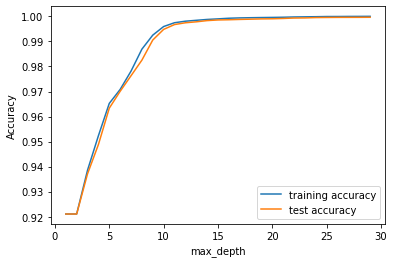

In [19]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [20]:
# Tuning min_samples_leaf
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
tree.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(random_state=100),
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             return_train_score=True, scoring='accuracy')

In [21]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,8.604647,1.056746,0.017152,0.001705,5,{'min_samples_leaf': 5},0.998883,0.999727,0.999323,0.999543,...,0.999423,0.000302,1,0.999890,0.999881,0.999890,0.999877,0.999870,0.999882,0.000008
1,7.996974,0.523142,0.018935,0.003842,25,{'min_samples_leaf': 25},0.997652,0.999112,0.998866,0.998338,...,0.998597,0.000543,2,0.999453,0.999246,0.999360,0.999224,0.999233,0.999303,0.000090
2,7.958808,1.464353,0.016761,0.001493,45,{'min_samples_leaf': 45},0.996157,0.998452,0.997872,0.997582,...,0.997726,0.000865,3,0.998881,0.998472,0.998811,0.998802,0.998848,0.998763,0.000148
3,6.652038,0.108530,0.015001,0.000653,65,{'min_samples_leaf': 65},0.995603,0.998285,0.997142,0.996105,...,0.996949,0.000978,4,0.998263,0.998408,0.998200,0.997986,0.998222,0.998216,0.000136
4,6.587659,0.072822,0.015962,0.000785,85,{'min_samples_leaf': 85},0.994803,0.998321,0.996456,0.995718,...,0.996495,0.001205,5,0.997470,0.998156,0.997531,0.997701,0.998026,0.997777,0.000271


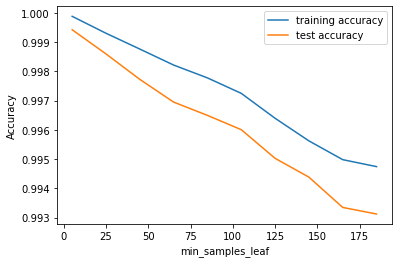

In [22]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [23]:
# Tuning min_samples_split
# GridSearchCV to find optimal min_samples_split

# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True)
tree.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(random_state=100),
             param_grid={'min_samples_split': range(5, 200, 20)},
             return_train_score=True, scoring='accuracy')

In [24]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,8.417346,0.815341,0.019881,0.003455,5,{'min_samples_split': 5},0.99927,0.999824,0.999525,0.999613,...,0.99961,0.000205,1,1.0,1.0,1.0,1.0,1.0,1.0,0.0
1,7.951182,0.924314,0.016924,0.001091,25,{'min_samples_split': 25},0.99927,0.999824,0.999525,0.999613,...,0.99961,0.000205,1,1.0,1.0,1.0,1.0,1.0,1.0,0.0
2,7.333033,0.096429,0.016365,0.001448,45,{'min_samples_split': 45},0.99927,0.999824,0.999525,0.999613,...,0.99961,0.000205,1,1.0,1.0,1.0,1.0,1.0,1.0,0.0
3,7.304291,0.104940,0.016983,0.000320,65,{'min_samples_split': 65},0.99927,0.999824,0.999525,0.999613,...,0.99961,0.000205,1,1.0,1.0,1.0,1.0,1.0,1.0,0.0
4,7.337161,0.140348,0.016784,0.001007,85,{'min_samples_split': 85},0.99927,0.999824,0.999525,0.999613,...,0.99961,0.000205,1,1.0,1.0,1.0,1.0,1.0,1.0,0.0


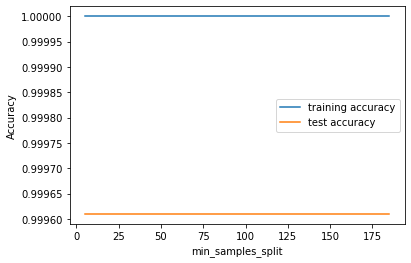

In [25]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [26]:
# Grid Search to Find Optimal Hyperparameters
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(100, 200, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, return_train_score=True)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:  7.4min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(100, 200, 50),
                         'min_samples_split': range(50, 150, 50)},
             return_train_score=True, verbose=1)

In [27]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,6.187452,0.547042,0.015999,0.003366,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.933058,...,0.947270,0.008340,13,0.956301,0.948849,0.945314,0.964650,0.959391,0.954901,0.007010
1,4.924391,0.070326,0.013294,0.000875,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.933058,...,0.947270,0.008340,13,0.956301,0.948849,0.945314,0.964650,0.959391,0.954901,0.007010
2,4.977117,0.043705,0.013244,0.000522,entropy,5,150,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.932812,...,0.947185,0.008432,15,0.955725,0.948587,0.945070,0.964757,0.959499,0.954728,0.007146
3,4.960476,0.054225,0.013004,0.000359,entropy,5,150,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.932812,...,0.947185,0.008432,15,0.955725,0.948587,0.945070,0.964757,0.959499,0.954728,0.007146
4,5.884203,0.341612,0.014025,0.000650,entropy,10,100,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.978624,...,0.989468,0.005661,5,0.995063,0.992317,0.993183,0.996135,0.993579,0.994055,0.001368
5,5.881314,0.310545,0.014535,0.000460,entropy,10,100,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.978624,...,0.989455,0.005662,6,0.995063,0.992317,0.993126,0.996135,0.993579,0.994044,0.001375
6,5.875156,0.302887,0.014396,0.000538,entropy,10,150,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.975793,...,0.987945,0.006262,7,0.993388,0.991811,0.992761,0.994377,0.992814,0.993030,0.000842
7,5.872384,0.324046,0.014834,0.001140,entropy,10,150,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.975801,...,0.987931,0.006255,8,0.993388,0.991811,0.992704,0.994377,0.992814,0.993019,0.000846
8,4.183692,0.065567,0.012962,0.000231,gini,5,100,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.959332,...,0.963022,0.003236,9,0.966564,0.962170,0.966101,0.965527,0.965689,0.965210,0.001562
9,4.297379,0.131066,0.013097,0.000738,gini,5,100,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.959332,...,0.963022,0.003236,9,0.966564,0.962170,0.966101,0.965527,0.965689,0.965210,0.001562


In [28]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.9932891335314704
DecisionTreeClassifier(max_depth=10, min_samples_leaf=100, min_samples_split=50)


In [29]:
# tree with max_depth = 3
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=100,
                                  min_samples_split=50)
clf_gini.fit(X_train, y_train)

# score
print(clf_gini.score(X_test,y_test))

0.9915382184614304


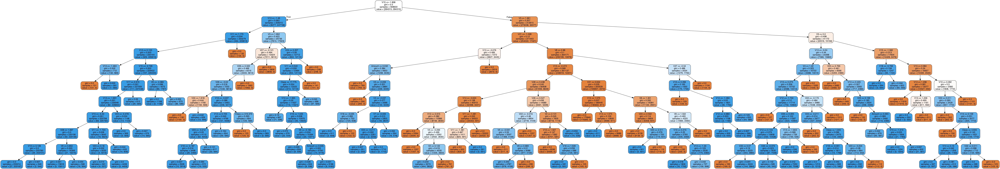

In [30]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [31]:
# classification metrics
y_pred = clf_gini.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56864
           1       0.17      1.00      0.29        98

    accuracy                           0.99     56962
   macro avg       0.58      1.00      0.64     56962
weighted avg       1.00      0.99      0.99     56962



In [32]:
# confusion matrix
print(confusion_matrix(y_test,y_pred))

[[56382   482]
 [    0    98]]


# Random Forest

In [62]:
# Running the random forest with default parameters.
rfc = RandomForestClassifier()

# fit
rfc.fit(X_train,y_train)

RandomForestClassifier()

In [63]:
# Making predictions
predictions = rfc.predict(X_test)

In [64]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       1.00      1.00      1.00        98

    accuracy                           1.00     56962
   macro avg       1.00      1.00      1.00     56962
weighted avg       1.00      1.00      1.00     56962



In [65]:
# Printing confusion matrix
print(confusion_matrix(y_test,predictions))

[[56864     0]
 [    0    98]]


In [66]:
print(accuracy_score(y_test,predictions))

1.0


In [45]:
# Tuning max_features

# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'max_features': [4, 8, 14, 20, 24]}

# instantiate the model
rf = RandomForestClassifier(max_depth=4)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", 
                  return_train_score=True)

rf.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(max_depth=4),
             param_grid={'max_features': [4, 8, 14, 20, 24]},
             return_train_score=True, scoring='accuracy')

In [46]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,36.636670,1.054437,0.356663,0.011592,4,{'max_features': 4},0.945782,0.942045,0.942203,0.941579,...,0.943065,0.001536,5,0.947743,0.941594,0.942390,0.943010,0.943619,0.943671,0.002144
1,65.634751,0.331198,0.337223,0.004079,8,{'max_features': 8},0.949537,0.947013,0.951990,0.949308,...,0.948777,0.002088,4,0.951574,0.946747,0.952590,0.950499,0.947158,0.949714,0.002353
2,110.704734,0.403717,0.336359,0.003995,14,{'max_features': 14},0.952306,0.955577,0.955753,0.958813,...,0.955296,0.002154,3,0.955547,0.954806,0.957318,0.959998,0.955085,0.956551,0.001933
3,155.507776,0.223303,0.343620,0.011541,20,{'max_features': 20},0.950636,0.961645,0.960150,0.960458,...,0.958549,0.004003,1,0.960915,0.959046,0.962994,0.962388,0.960948,0.961258,0.001371
4,186.520550,1.123862,0.331564,0.005613,24,{'max_features': 24},0.947620,0.963183,0.955832,0.954865,...,0.956012,0.005093,2,0.959007,0.959956,0.960038,0.958545,0.961001,0.959709,0.000859


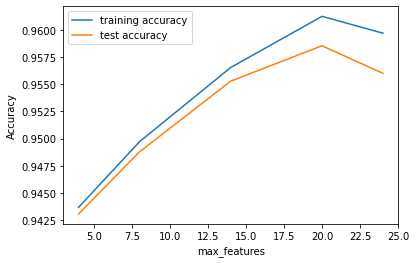

In [47]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [48]:
# Tuning min_samples_leaf
# GridSearchCV to find optimal min_samples_leaf
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", 
                  return_train_score=True)

rf.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(),
             param_grid={'min_samples_leaf': range(100, 400, 50)},
             return_train_score=True, scoring='accuracy')

In [49]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,100.514177,0.971239,0.593492,0.006970,100,{'min_samples_leaf': 100},0.999358,0.999938,0.999358,0.998962,...,0.999393,0.000312,1,0.999600,0.999554,0.999613,0.999444,0.999516,0.999545,0.000061
1,99.735177,1.116020,0.590794,0.012313,150,{'min_samples_leaf': 150},0.999279,0.999912,0.999147,0.998611,...,0.999145,0.000453,2,0.999459,0.999400,0.999479,0.999319,0.999270,0.999385,0.000080
2,100.134357,1.034950,0.593432,0.013073,200,{'min_samples_leaf': 200},0.999138,0.999912,0.998822,0.998628,...,0.999042,0.000469,3,0.999365,0.999319,0.999279,0.999283,0.999253,0.999300,0.000039
3,99.648649,0.956906,0.613554,0.023703,250,{'min_samples_leaf': 250},0.998954,0.999851,0.998989,0.998523,...,0.999012,0.000451,4,0.999288,0.999147,0.999406,0.999261,0.999215,0.999264,0.000086
4,98.989862,1.150460,0.585098,0.013940,300,{'min_samples_leaf': 300},0.998910,0.999859,0.998707,0.998426,...,0.998903,0.000503,5,0.999037,0.999123,0.999081,0.999191,0.999180,0.999122,0.000058


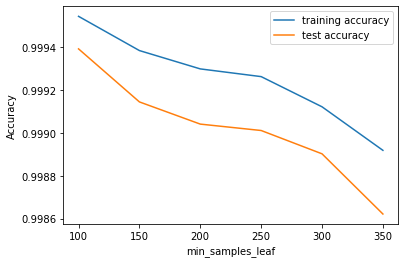

In [50]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [51]:
# Tuning min_samples_split
# GridSearchCV to find optimal min_samples_split
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", 
                  return_train_score=True)

rf.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(),
             param_grid={'min_samples_split': range(200, 500, 50)},
             return_train_score=True, scoring='accuracy')

In [52]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,103.963870,1.445695,0.638954,0.030048,200,{'min_samples_split': 200},0.999666,0.999991,0.999859,0.999982,...,0.999898,0.000126,1,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,106.190368,1.578450,0.629288,0.015190,250,{'min_samples_split': 250},0.999666,0.999991,0.999859,0.999982,...,0.999898,0.000126,1,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
2,105.635228,1.693002,0.634983,0.018003,300,{'min_samples_split': 300},0.999675,0.999982,0.999859,0.999982,...,0.999898,0.000122,1,1.000000,1.000000,0.999998,1.000000,0.999998,0.999999,0.000001
3,105.258034,1.199428,0.636727,0.013110,350,{'min_samples_split': 350},0.999666,0.999974,0.999859,0.999982,...,0.999894,0.000124,5,1.000000,0.999996,1.000000,0.999996,0.999991,0.999996,0.000003
4,105.036186,1.323276,0.625878,0.012929,400,{'min_samples_split': 400},0.999666,0.999991,0.999859,0.999982,...,0.999898,0.000126,1,0.999993,1.000000,0.999998,0.999998,1.000000,0.999998,0.000002


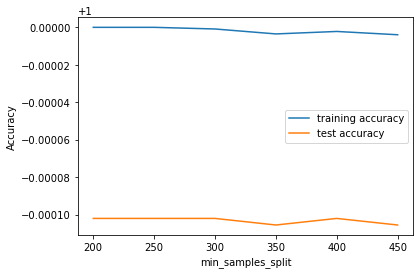

In [53]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [67]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1, return_train_score=True)

In [68]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 142.9min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 202.9min finished


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [4, 8, 10], 'max_features': [5, 10],
                         'min_samples_leaf': range(100, 400, 200),
                         'min_samples_split': range(200, 500, 200),
                         'n_estimators': [100, 200, 300]},
             return_train_score=True, verbose=1)

In [69]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9954293655918615 using {'max_depth': 10, 'max_features': 10, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 100}


In [70]:
# Fitting the final model with the best parameters obtained from grid search.
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=10,
                             min_samples_leaf=100, 
                             min_samples_split=200,
                             max_features=10,
                             n_estimators=200)

In [71]:
rfc.fit(X_train,y_train)

RandomForestClassifier(max_depth=10, max_features=10, min_samples_leaf=100,
                       min_samples_split=200, n_estimators=200)

In [72]:
# evaluation metrics
print(classification_report(y_test,predictions))
print(confusion_matrix(y_test,predictions))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       1.00      1.00      1.00        98

    accuracy                           1.00     56962
   macro avg       1.00      1.00      1.00     56962
weighted avg       1.00      1.00      1.00     56962

[[56864     0]
 [    0    98]]


# XGBoost

In [74]:
# Fitting the decision tree with default hyperparameters, apart from
model = XGBClassifier()
model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

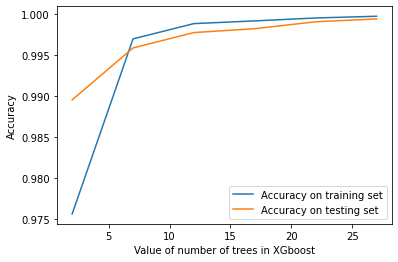

In [75]:
tree_range = range(2, 30, 5)
score1=[]
score2=[]
for tree in tree_range:
    xgb=XGBClassifier(n_estimators=tree)
    xgb.fit(X_train,y_train)
    score1.append(xgb.score(X_train,y_train))
    score2.append(xgb.score(X_test,y_test))
    
%matplotlib inline
plt.plot(tree_range,score1,label= 'Accuracy on training set')
plt.plot(tree_range,score2,label= 'Accuracy on testing set')
plt.xlabel('Value of number of trees in XGboost')
plt.ylabel('Accuracy')
plt.legend()

In [76]:
# make predictions for test data
# use predict_proba since we need probabilities to compute auc
y_pred = model.predict_proba(X_test)
y_pred[:10]

array([[9.9999982e-01, 1.8849633e-07],
       [9.9999833e-01, 1.6692175e-06],
       [9.9989319e-01, 1.0680850e-04],
       [9.9993086e-01, 6.9131522e-05],
       [9.9999946e-01, 5.2226272e-07],
       [9.9999750e-01, 2.4984238e-06],
       [9.9999917e-01, 8.4134990e-07],
       [9.9999964e-01, 3.6394022e-07],
       [9.9999785e-01, 2.1644489e-06],
       [9.9999833e-01, 1.6512201e-06]], dtype=float32)

In [77]:
# evaluate predictions
roc = metrics.roc_auc_score(y_test, y_pred[:, 1])
print("AUC: %.2f%%" % (roc * 100.0))

AUC: 100.00%


In [78]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# specify range of hyperparameters
param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          

# specify model
xgb_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb_model, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      


In [79]:
# fit the model
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed: 14.9min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=200, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=Non

In [80]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,21.699064,5.340020,0.206287,0.043471,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.999539,0.999961,0.999779,...,0.999795,0.000142,5,0.999924,0.999859,0.999884,0.999880,0.999879,0.999885,0.000021
1,31.442182,3.014282,0.243046,0.032380,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.999471,0.999967,0.999776,...,0.999790,0.000172,6,0.999913,0.999874,0.999902,0.999871,0.999867,0.999885,0.000019
2,31.728009,0.894817,0.243061,0.014326,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.999522,0.999959,0.999816,...,0.999805,0.000151,4,0.999922,0.999861,0.999884,0.999866,0.999866,0.999880,0.000022
3,24.884663,1.514977,0.233144,0.025839,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.999690,0.999998,0.999907,...,0.999912,0.000116,2,0.999992,0.999991,0.999997,0.999996,0.999994,0.999994,0.000002
4,31.384285,0.464957,0.228116,0.002368,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.999657,0.999998,0.999903,...,0.999903,0.000127,3,0.999995,0.999986,0.999993,0.999993,0.999992,0.999992,0.000003
5,31.100387,0.650753,0.239821,0.025141,0.6,0.9,"{'learning_rate': 0.6, 'subsample': 0.9}",0.999730,0.999996,0.999917,...,0.999923,0.000101,1,0.999994,0.999990,0.999995,0.999989,0.999998,0.999993,0.000003


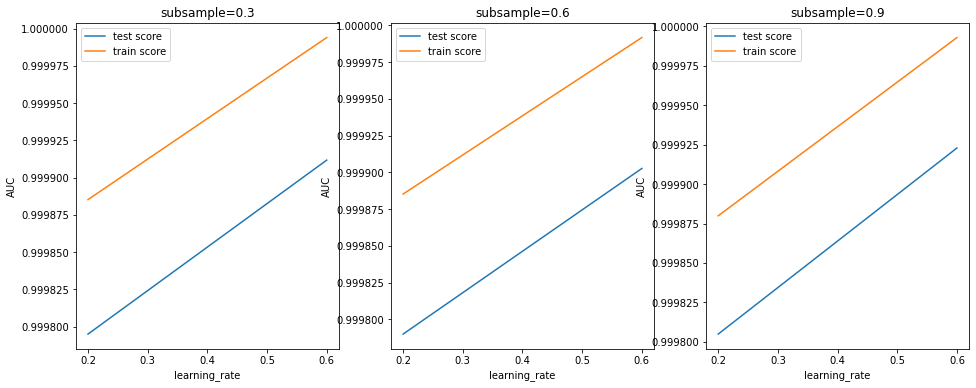

In [84]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    #plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    #plt.xscale('log')

In [85]:
# chosen hyperparameters
# 'objective':'binary:logistic' outputs probability rather than label, which we need for auc

#The results show that a subsample size of 0.6 and learning_rate of about 0.2 seems optimal.
#Also, XGBoost has resulted in the highest ROC AUC obtained (across various hyperparameters).

params = {'learning_rate': 0.2,
          'max_depth': 2, 
          'n_estimators':200,
          'subsample':0.6,
         'objective':'binary:logistic'}

# fit model on training data
model = XGBClassifier(params = params)
model.fit(X_train, y_train)

[15:37:57] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:480: 
Parameters: { params } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              params={'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 200,
                      'objective': 'binary:logistic', 'subsample': 0.6},
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [86]:
y_pred = model.predict_proba(X_test)
y_pred[:10]

array([[9.9999982e-01, 1.8849633e-07],
       [9.9999833e-01, 1.6692175e-06],
       [9.9989319e-01, 1.0680850e-04],
       [9.9993086e-01, 6.9131522e-05],
       [9.9999946e-01, 5.2226272e-07],
       [9.9999750e-01, 2.4984238e-06],
       [9.9999917e-01, 8.4134990e-07],
       [9.9999964e-01, 3.6394022e-07],
       [9.9999785e-01, 2.1644489e-06],
       [9.9999833e-01, 1.6512201e-06]], dtype=float32)

In [87]:
# roc_auc
auc = sklearn.metrics.roc_auc_score(y_test, y_pred[:, 1])
auc

1.0

In [88]:
# feature importance
importance = dict(zip(X_train.columns, model.feature_importances_))
importance

{'V1': 0.010281335,
 'V2': 0.0071743126,
 'V3': 0.011890585,
 'V4': 0.073093176,
 'V5': 0.0023248629,
 'V6': 0.018070748,
 'V7': 0.014891533,
 'V8': 0.043383166,
 'V9': 0.006200457,
 'V10': 0.017635727,
 'V11': 0.010191091,
 'V12': 0.0359607,
 'V13': 0.008817401,
 'V14': 0.5286389,
 'V15': 0.009377882,
 'V16': 0.0062243096,
 'V17': 0.013113069,
 'V18': 0.014434127,
 'V19': 0.017382178,
 'V20': 0.024411548,
 'V21': 0.0117756035,
 'V22': 0.013204338,
 'V23': 0.012457147,
 'V24': 0.007243831,
 'V25': 0.010985815,
 'V26': 0.020622142,
 'V27': 0.018998137,
 'V28': 0.009285362,
 'Amount': 0.021930486}

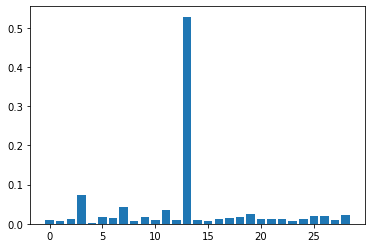

In [89]:
# plot
plt.bar(range(len(model.feature_importances_)), model.feature_importances_)
plt.show()

#### Proceed with the model which shows the best result 
- Apply the best hyperparameter on the model
- Predict on the test dataset

In [90]:
clf = XGBClassifier(params = params)  #initialise the model with optimum hyperparameters
clf.fit(X_train, y_train)
print(sklearn.metrics.roc_auc_score(y_test, y_pred[:, 1])) #print the evaluation score on the X_test by choosing the best evaluation metric

[15:38:58] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:480: 
Parameters: { params } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


1.0


### Print the class distribution after applying SMOTE 

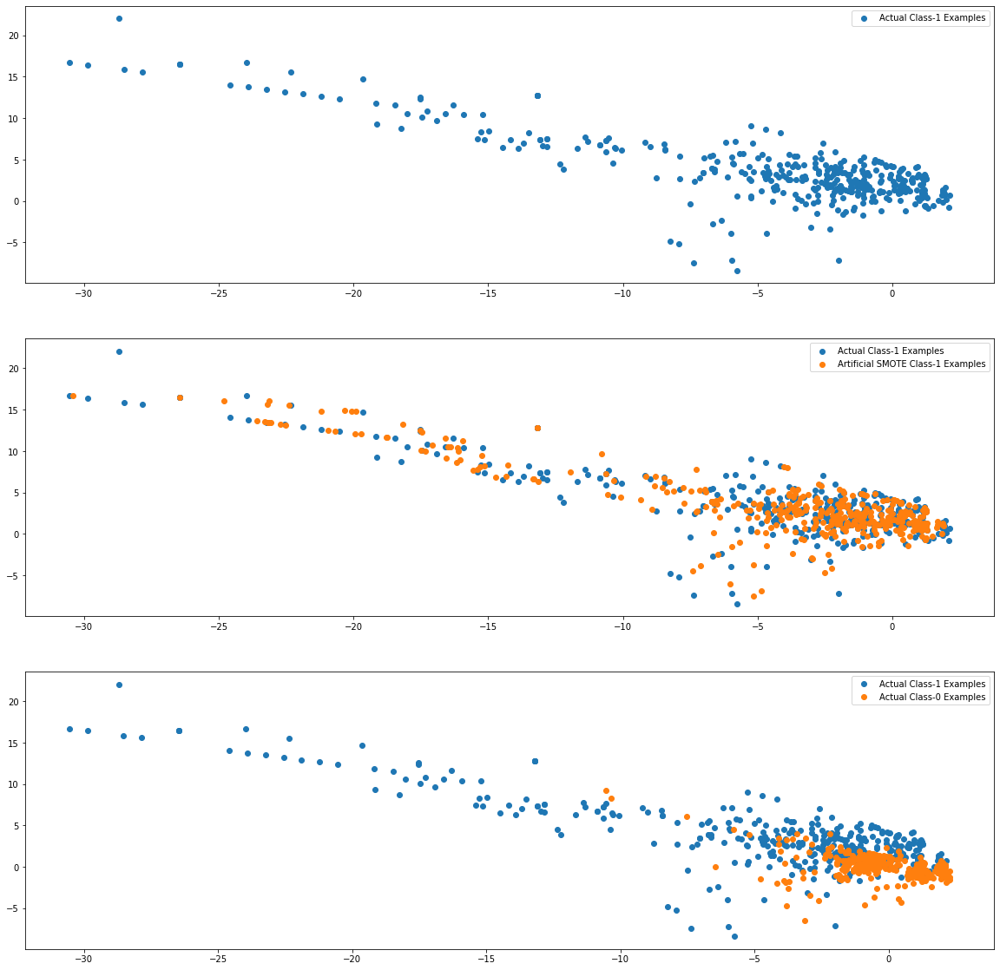

In [10]:
import warnings
warnings.filterwarnings("ignore")


sm = over_sampling.SMOTE(random_state=0)
X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)
# Artificial minority samples and corresponding minority labels from SMOTE are appended
# below X_train and y_train respectively
# So to exclusively get the artificial minority samples from SMOTE, we do
X_train_smote_1 = X_train_smote[X_train.shape[0]:]

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]


plt.rcParams['figure.figsize'] = [20, 20]
fig = plt.figure()

plt.subplot(3, 1, 1)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 2)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_smote_1.iloc[:X_train_1.shape[0], 0],X_train_smote_1.iloc[:X_train_1.shape[0], 1],
            label='Artificial SMOTE Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 3)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], 0], X_train_0[:X_train_1.shape[0], 1], label='Actual Class-0 Examples')
plt.legend()

##### Build models on other algorithms to see the better performing on SMOTE

#### perfom cross validation on the X_train & y_train to create:
- X_train_cv
- X_test_cv 
- y_train_cv
- y_test_cv 

In [13]:
#perform cross validation & then balance classes on X_train_cv & y_train_cv using SMOTE

#perform hyperparameter tuning

#print the evaluation result by choosing a evaluation metric

#print the optimum value of hyperparameters
X_train_cv = X_train_smote
X_test_cv = X_test
y_train_cv = y_train_smote
y_test_cv = y_test

### Logistic Regression

In [15]:
#Logist Regression

for i in range (2,29):
    # specify model
    lm = LogisticRegression()
    lm.fit(X_train_cv,y_train_cv)
    
    rfe=RFE(lm,i)
    rfe = rfe.fit(X_train_cv, y_train_cv)
    
    # tuples of (feature name, whether selected, ranking)
    list(zip(X_train_cv.columns,rfe.support_,rfe.ranking_))
    
    # predict prices of X_test
    y_pred = rfe.predict(X_test_cv)
    
    # evaluate the model on test set
    r2 = sklearn.metrics.r2_score(y_test_cv, y_pred)
    print('{0}. RFE Score {1} with number of features={2}'.format(i-1,r2,i))

print('\n')
# k-fold CV (using all the 29 variables)
for i in range (2,10):
    cv_num = cross_val_score(lm, X_train_cv, y_train_cv, scoring='r2', cv=i)
    print('cv = {0}, mean value is {1}'.format(i,round(cv_num.mean(),2)*100))


1. RFE Score -11.838414319019668 with number of features=2
2. RFE Score -14.076959490886951 with number of features=3
3. RFE Score -12.175729344917478 with number of features=4
4. RFE Score -12.185951012368927 with number of features=5
5. RFE Score -11.9917393307914 with number of features=6
6. RFE Score -11.971295995888502 with number of features=7
7. RFE Score -10.846912576229137 with number of features=8
8. RFE Score -10.48915421542843 with number of features=9
9. RFE Score -10.632257559748712 with number of features=10
10. RFE Score -10.274499198948005 with number of features=11
11. RFE Score -10.049622515016132 with number of features=12
12. RFE Score -10.008735845210337 with number of features=13
13. RFE Score -10.611814224845816 with number of features=14
14. RFE Score -10.080287517370477 with number of features=15
15. RFE Score -10.652700894651609 with number of features=16
16. RFE Score -10.611814224845816 with number of features=17
17. RFE Score -10.611814224845816 with numbe

In [16]:
#from sklearn.model_selection import GridSearchCV

#perform cross validation
# creating a KFold object with 5 splits 
folds = StratifiedKFold(n_splits = 4, shuffle = False, random_state = None)

#perform hyperparameter tuning
hyper_params = [{'n_features_to_select': list(range(1, 30))}]

# step-3: perform grid search
# 3.1 specify model
lm = LogisticRegression()
lm.fit(X_train_cv, y_train_cv)
rfe = RFE(lm)     

#print the evaluation result by choosing a evaluation metric
model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)

# fit the model
model_cv.fit(X_train_cv, y_train_cv)  


Fitting 4 folds for each of 29 candidates, totalling 116 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 116 out of 116 | elapsed: 51.4min finished


GridSearchCV(cv=StratifiedKFold(n_splits=4, random_state=None, shuffle=False),
             estimator=RFE(estimator=LogisticRegression()),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                   10, 11, 12, 13, 14, 15, 16,
                                                   17, 18, 19, 20, 21, 22, 23,
                                                   24, 25, 26, 27, 28, 29]}],
             return_train_score=True, scoring='r2', verbose=1)

In [17]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,34.546170,1.672128,0.007969,0.001026,1,{'n_features_to_select': 1},0.731636,0.728541,0.729910,0.728362,0.729612,0.001313,29,0.729043,0.730040,0.729607,0.730064,0.729688,0.000415
1,33.841611,1.918110,0.007824,0.000600,2,{'n_features_to_select': 2},0.769164,0.762376,0.769901,0.767861,0.767326,0.002949,28,0.769292,0.765962,0.769211,0.769926,0.768598,0.001546
2,33.303746,1.079758,0.007724,0.000983,3,{'n_features_to_select': 3},0.793046,0.790971,0.795858,0.790758,0.792659,0.002052,27,0.792740,0.793327,0.791768,0.793655,0.792873,0.000717
3,33.440997,1.197180,0.008513,0.000752,4,{'n_features_to_select': 4},0.804935,0.801242,0.803421,0.800431,0.802507,0.001778,26,0.801850,0.802741,0.802308,0.803246,0.802536,0.000517
4,32.318114,0.172888,0.008998,0.000933,5,{'n_features_to_select': 5},0.806658,0.803246,0.805144,0.801838,0.804222,0.001832,25,0.803445,0.804160,0.803844,0.803996,0.803861,0.000265
5,39.619038,2.886904,0.011645,0.001490,6,{'n_features_to_select': 6},0.806869,0.804091,0.807782,0.802506,0.805312,0.002115,24,0.804371,0.804969,0.806294,0.805356,0.805247,0.000699
6,30.122285,4.187755,0.009262,0.001233,7,{'n_features_to_select': 7},0.809296,0.806728,0.811510,0.803913,0.807862,0.002839,23,0.807044,0.807560,0.809483,0.806822,0.807727,0.001049
7,27.102835,1.149365,0.008767,0.000390,8,{'n_features_to_select': 8},0.811723,0.810175,0.811053,0.808380,0.810333,0.001254,22,0.810385,0.810631,0.809507,0.810304,0.810207,0.000422
8,27.894565,1.315318,0.009453,0.000142,9,{'n_features_to_select': 9},0.813657,0.811055,0.819389,0.810068,0.813542,0.003621,21,0.812472,0.810127,0.817127,0.813024,0.813188,0.002521
9,27.953188,0.986667,0.008497,0.000370,10,{'n_features_to_select': 10},0.815733,0.817808,0.819178,0.806234,0.814738,0.005061,20,0.815438,0.817185,0.817409,0.809553,0.814896,0.003178


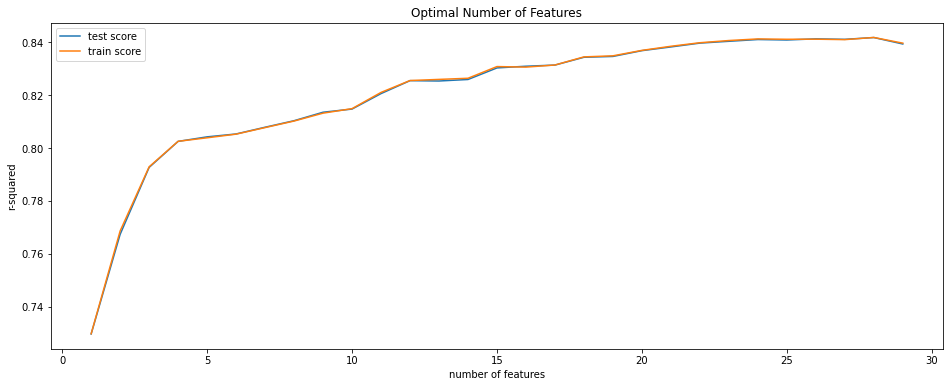

In [18]:
# plotting cv results
plt.figure(figsize=(16,6))

plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

In [19]:
# final model
n_features_optimal = 20

lm = LogisticRegression()
lm.fit(X_train_cv, y_train_cv)

rfe = RFE(lm, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train_cv, y_train_cv)

# predict prices of X_test
y_pred = lm.predict(X_test_cv)
r2 = sklearn.metrics.r2_score(y_test_cv, y_pred)
print(r2)

-10.029179180113234


### Similarly explore other algorithms on balanced dataset by building models like:
- KNN
- SVM
- Decision Tree
- Random Forest
- XGBoost

# Decision Tree

In [20]:
# Importing decision tree classifier from sklearn library

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(max_depth=5)
dt_default.fit(X_train_cv, y_train_cv)

DecisionTreeClassifier(max_depth=5)

In [21]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics


# Making predictions
y_pred_default = dt_default.predict(X_test_cv)

# Printing classification report
print(classification_report(y_test_cv, y_pred_default))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98     56864
           1       0.05      0.92      0.09        98

    accuracy                           0.97     56962
   macro avg       0.52      0.94      0.54     56962
weighted avg       1.00      0.97      0.98     56962



In [22]:
# Printing confusion matrix and accuracy
print(confusion_matrix(y_test_cv,y_pred_default))
print(accuracy_score(y_test_cv,y_pred_default))

[[55042  1822]
 [    8    90]]
0.9678733190548084


In [23]:
# Putting features
features = list(df.columns[1:])
features

['V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'Amount',
 'Class']

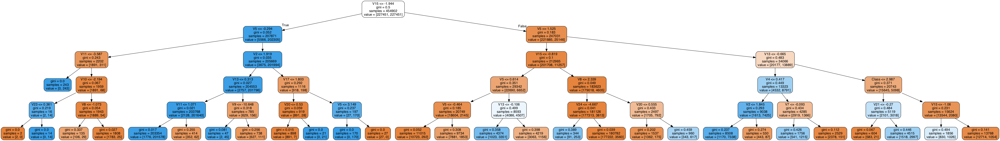

In [24]:
# plotting tree with max_depth=3

dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,
                feature_names=features, filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [25]:
# Tuning max_depth
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'max_depth': range(1, 30)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = None)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
tree.fit(X_train_cv, y_train_cv)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': range(1, 30)}, return_train_score=True,
             scoring='accuracy')

In [26]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.452808,0.103364,0.012117,0.002284,1,{'max_depth': 1},0.932711,0.932316,0.931908,0.933095,...,0.932465,0.000405,29,0.932419,0.932521,0.932617,0.932334,0.932535,0.932485,0.000098
1,2.651852,0.035539,0.010802,0.000511,2,{'max_depth': 2},0.936108,0.935459,0.935700,0.936437,...,0.935916,0.000336,28,0.935893,0.936058,0.935989,0.935843,0.935984,0.935953,0.000076
2,4.463743,0.129921,0.011616,0.001282,3,{'max_depth': 3},0.946538,0.946044,0.947285,0.947197,...,0.946177,0.001262,27,0.946590,0.946796,0.947491,0.947491,0.944840,0.946642,0.000971
3,6.154195,0.533415,0.013283,0.001548,4,{'max_depth': 4},0.955122,0.954430,0.954913,0.953440,...,0.954221,0.000773,26,0.955441,0.955694,0.954979,0.953226,0.953342,0.954536,0.001049
4,7.818763,0.572988,0.011748,0.000818,5,{'max_depth': 5},0.965224,0.963586,0.964102,0.962640,...,0.963256,0.001514,25,0.965852,0.964437,0.963825,0.963121,0.961764,0.963800,0.001358


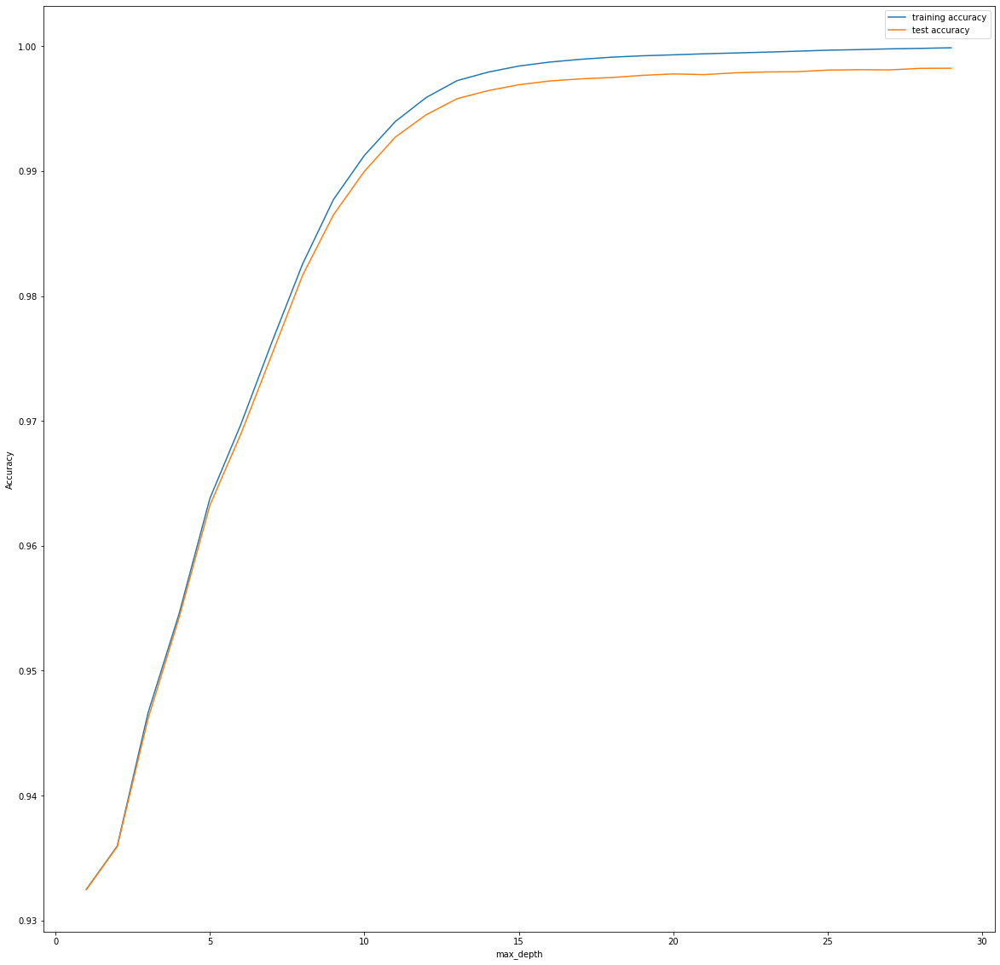

In [27]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [28]:
# Tuning min_samples_leaf
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
tree.fit(X_train_cv, y_train_cv)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(random_state=100),
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             return_train_score=True, scoring='accuracy')

In [29]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,23.611036,0.604585,0.015209,0.000755,5,{'min_samples_leaf': 5},0.997681,0.997527,0.997549,0.997659,...,0.997582,0.000074,1,0.999060,0.999099,0.999110,0.999200,0.999071,0.999108,0.000050
1,22.324384,1.756224,0.015197,0.001039,25,{'min_samples_leaf': 25},0.994263,0.993922,0.994757,0.994592,...,0.994436,0.000305,2,0.995881,0.995804,0.995919,0.995799,0.995936,0.995868,0.000057
2,21.814962,1.612070,0.015347,0.001082,45,{'min_samples_leaf': 45},0.992064,0.991625,0.991592,0.991405,...,0.991723,0.000240,3,0.993218,0.992927,0.992886,0.992993,0.993216,0.993048,0.000142
3,20.849038,0.671964,0.014222,0.000533,65,{'min_samples_leaf': 65},0.990536,0.990152,0.990492,0.990207,...,0.990352,0.000152,4,0.991831,0.991465,0.991350,0.991691,0.991402,0.991548,0.000183
4,20.698910,0.774557,0.013861,0.000572,85,{'min_samples_leaf': 85},0.988503,0.988217,0.988624,0.987756,...,0.988351,0.000336,5,0.990119,0.989624,0.989168,0.989555,0.989638,0.989621,0.000303


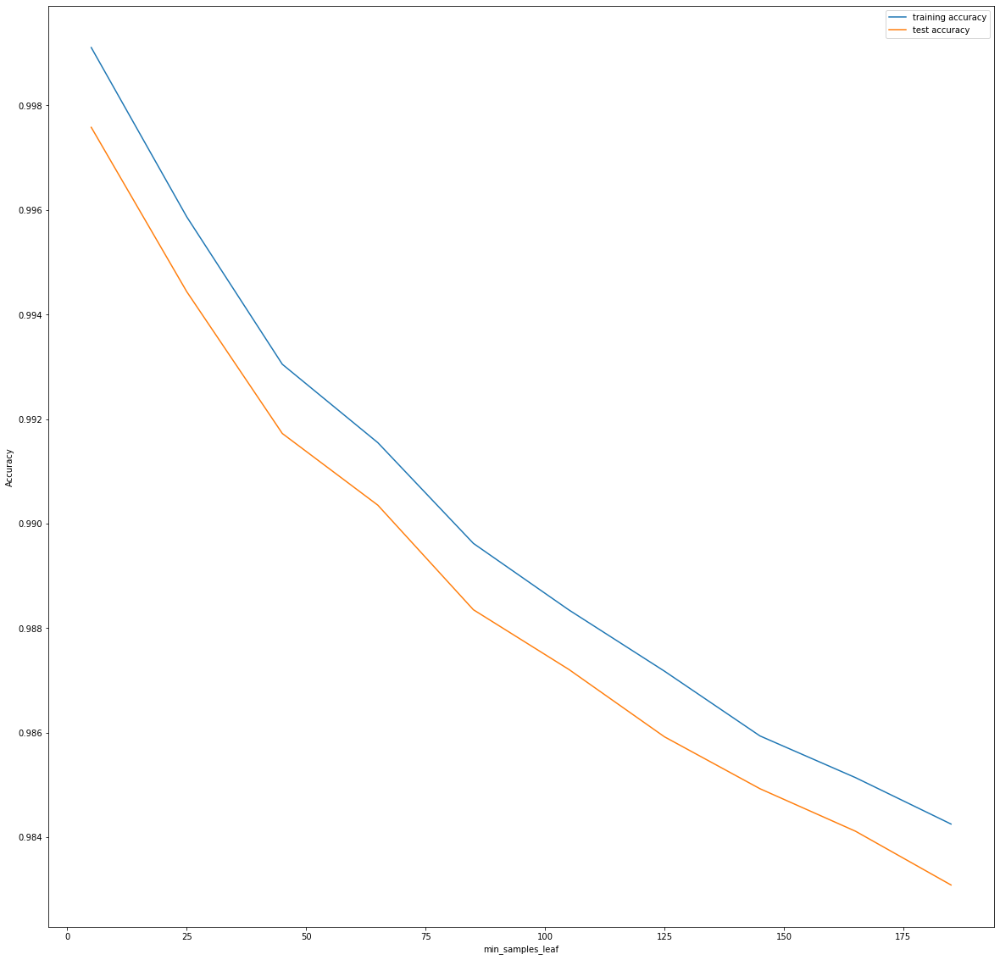

In [30]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [31]:
# Tuning min_samples_split
# GridSearchCV to find optimal min_samples_split

# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True)
tree.fit(X_train_cv, y_train_cv)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(random_state=100),
             param_grid={'min_samples_split': range(5, 200, 20)},
             return_train_score=True, scoring='accuracy')

In [32]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,22.720748,0.584297,0.015242,0.001199,5,{'min_samples_split': 5},0.998252,0.998142,0.998296,0.998395,...,0.998268,0.000082,1,0.999967,0.999951,0.999959,0.999951,0.999970,0.999959,0.000008
1,22.857972,1.007911,0.014437,0.000431,25,{'min_samples_split': 25},0.997967,0.997714,0.997923,0.997769,...,0.997800,0.000128,2,0.999593,0.999423,0.999544,0.999401,0.999409,0.999474,0.000079
2,22.250400,0.775327,0.014777,0.000801,45,{'min_samples_split': 45},0.997340,0.997351,0.997373,0.997329,...,0.997301,0.000097,3,0.999066,0.998964,0.999008,0.998777,0.998851,0.998933,0.000105
3,22.411097,0.872883,0.014428,0.001251,65,{'min_samples_split': 65},0.996571,0.996296,0.996823,0.996615,...,0.996621,0.000191,4,0.998368,0.998129,0.998236,0.998066,0.998233,0.998206,0.000103
4,22.223724,0.735799,0.014391,0.000573,85,{'min_samples_split': 85},0.995977,0.995790,0.996054,0.995570,...,0.995907,0.000204,5,0.997634,0.997593,0.997472,0.997219,0.997615,0.997507,0.000154


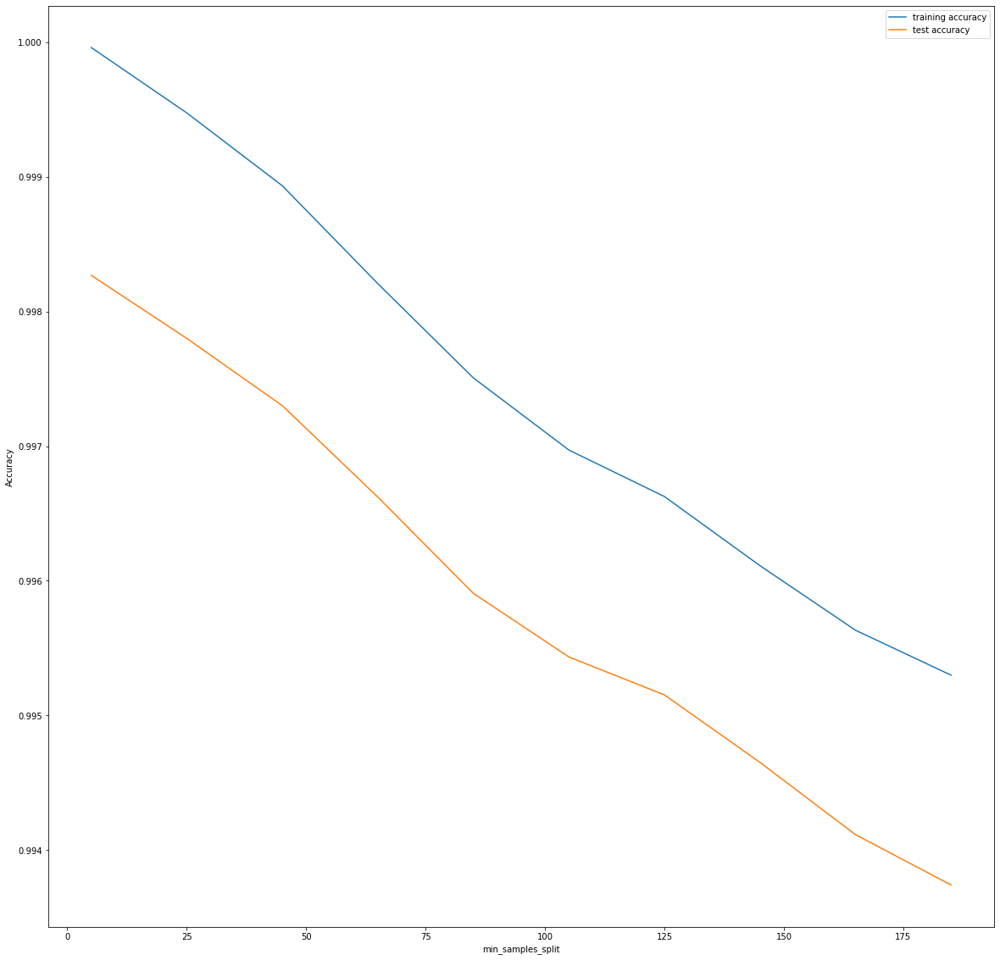

In [33]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [34]:
# Grid Search to Find Optimal Hyperparameters
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(100, 200, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, return_train_score=True)

# Fit the grid search to the data
grid_search.fit(X_train_cv,y_train_cv)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed: 12.4min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(100, 200, 50),
                         'min_samples_split': range(50, 150, 50)},
             return_train_score=True, verbose=1)

In [35]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,7.851498,0.225115,0.012252,0.000755,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.960673,...,0.960235,0.000393,13,0.960579,0.960698,0.960354,0.960618,0.960299,0.960510,0.000155
1,7.599670,0.091171,0.010758,0.000608,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.960673,...,0.960235,0.000393,13,0.960579,0.960698,0.960354,0.960618,0.960299,0.960510,0.000155
2,7.566061,0.048085,0.010531,0.000517,entropy,5,150,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.960453,...,0.959996,0.000436,15,0.960494,0.960489,0.960211,0.960291,0.960022,0.960301,0.000178
3,7.570385,0.034842,0.010480,0.000734,entropy,5,150,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.960453,...,0.959996,0.000436,15,0.960494,0.960489,0.960211,0.960291,0.960022,0.960301,0.000178
4,11.899251,0.234907,0.012022,0.000505,entropy,10,100,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.986305,...,0.987043,0.000649,2,0.987865,0.987528,0.988220,0.987805,0.988682,0.988020,0.000398
5,12.470069,0.267013,0.012186,0.000509,entropy,10,100,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.986294,...,0.987050,0.000680,1,0.987865,0.987528,0.988456,0.987805,0.988682,0.988067,0.000431
6,12.172724,0.439162,0.012926,0.000648,entropy,10,150,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.984414,...,0.985098,0.000535,6,0.985829,0.985711,0.986074,0.986162,0.985959,0.985947,0.000162
7,11.622213,0.086646,0.011791,0.000608,entropy,10,150,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.984414,...,0.985111,0.000550,5,0.985829,0.985711,0.986074,0.986162,0.985961,0.985948,0.000162
8,6.255437,0.081212,0.010956,0.000928,gini,5,100,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.965004,...,0.963080,0.001518,10,0.965583,0.964207,0.963698,0.962956,0.961478,0.963584,0.001358
9,6.255644,0.054762,0.010587,0.000324,gini,5,100,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.965015,...,0.963082,0.001521,9,0.965583,0.964207,0.963698,0.962956,0.961478,0.963584,0.001358


In [36]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.9870499605399072
DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=100,
                       min_samples_split=100)


In [38]:
# tree with max_depth = 3
clf_gini = DecisionTreeClassifier(criterion = "entropy", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=100,
                                  min_samples_split=100)
clf_gini.fit(X_train_cv, y_train_cv)

# score
print(clf_gini.score(X_test_cv,y_test_cv))

0.980039324461922


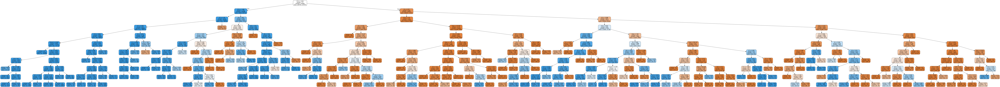

In [39]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [40]:
# classification metrics
y_pred = clf_gini.predict(X_test_cv)
print(classification_report(y_test_cv, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     56864
           1       0.07      0.88      0.13        98

    accuracy                           0.98     56962
   macro avg       0.54      0.93      0.56     56962
weighted avg       1.00      0.98      0.99     56962



In [41]:
# confusion matrix
print(confusion_matrix(y_test_cv,y_pred))

[[55739  1125]
 [   12    86]]


# Random Forest

In [42]:
# Running the random forest with default parameters.
rfc = RandomForestClassifier()

# fit
rfc.fit(X_train_cv,y_train_cv)

RandomForestClassifier()

In [43]:
# Making predictions
predictions = rfc.predict(X_test_cv)

In [44]:
# Let's check the report of our default model
print(classification_report(y_test_cv,predictions))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.88      0.85      0.86        98

    accuracy                           1.00     56962
   macro avg       0.94      0.92      0.93     56962
weighted avg       1.00      1.00      1.00     56962



In [45]:
# Printing confusion matrix
print(confusion_matrix(y_test_cv,predictions))

[[56853    11]
 [   15    83]]


In [46]:
print(accuracy_score(y_test_cv,predictions))

0.9995435553526912


In [47]:
# Tuning max_features

# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'max_features': [4, 8, 14, 20, 24]}

# instantiate the model
rf = RandomForestClassifier(max_depth=4)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", 
                  return_train_score=True)

rf.fit(X_train_cv, y_train_cv)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(max_depth=4),
             param_grid={'max_features': [4, 8, 14, 20, 24]},
             return_train_score=True, scoring='accuracy')

In [48]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,54.742637,1.145405,0.312400,0.003148,4,{'max_features': 4},0.947736,0.946835,0.948483,0.948802,...,0.947523,0.001113,5,0.947706,0.947612,0.948159,0.948525,0.946365,0.947673,0.000732
1,111.432634,2.274356,0.357331,0.013574,8,{'max_features': 8},0.954221,0.952715,0.952407,0.955056,...,0.953718,0.000999,4,0.953960,0.953548,0.952391,0.954647,0.954204,0.953750,0.000767
2,170.766922,2.145204,0.310114,0.027706,14,{'max_features': 14},0.956518,0.955232,0.956617,0.956518,...,0.956294,0.000532,3,0.955946,0.956477,0.956458,0.956221,0.956919,0.956404,0.000321
3,237.947657,5.527169,0.288560,0.010513,20,{'max_features': 20},0.959706,0.958200,0.957958,0.957738,...,0.958180,0.000819,2,0.959115,0.959428,0.957386,0.957917,0.957609,0.958291,0.000824
4,258.348917,23.605885,0.284215,0.022463,24,{'max_features': 24},0.962289,0.960629,0.960255,0.962014,...,0.960701,0.001422,1,0.961854,0.961538,0.959956,0.962102,0.959016,0.960893,0.001200


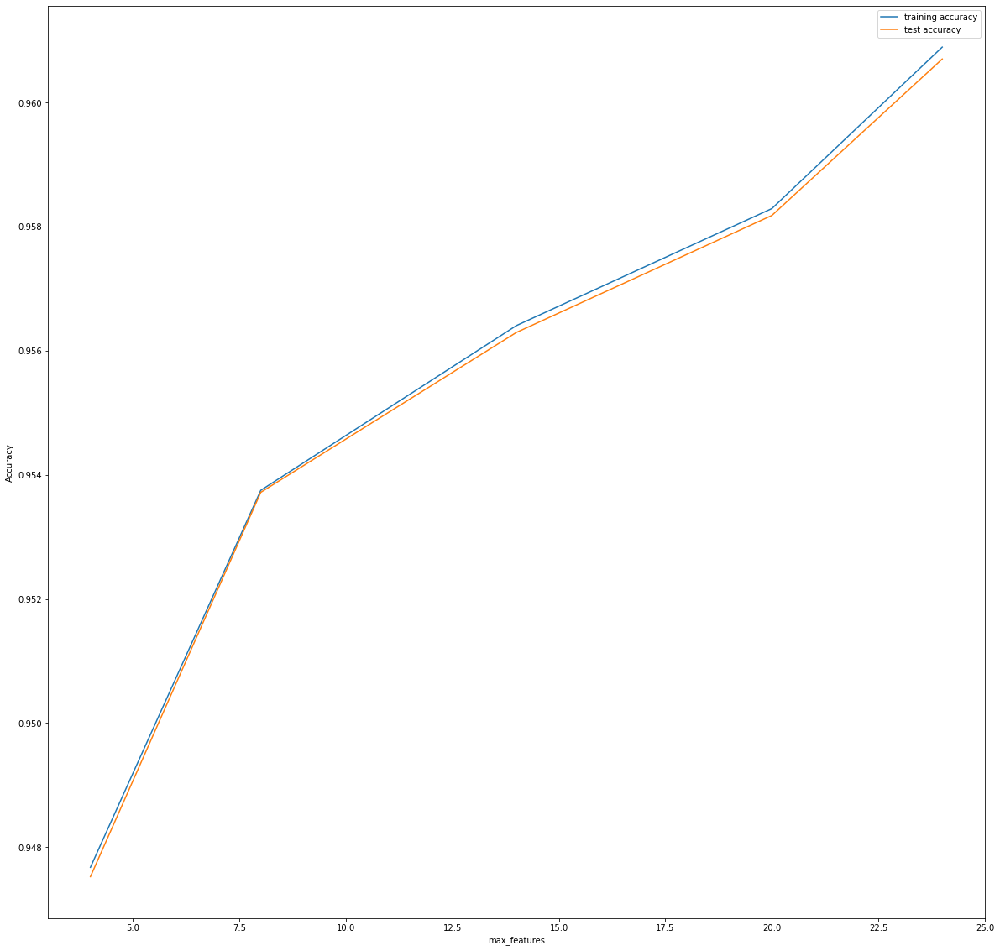

In [49]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [50]:
# Tuning min_samples_leaf
# GridSearchCV to find optimal min_samples_leaf
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", 
                  return_train_score=True)

rf.fit(X_train_cv, y_train_cv)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(),
             param_grid={'min_samples_leaf': range(100, 400, 50)},
             return_train_score=True, scoring='accuracy')

In [51]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,173.548738,2.842249,0.625973,0.022361,100,{'min_samples_leaf': 100},0.996505,0.996736,0.996977,0.996933,...,0.996876,0.000244,1,0.997241,0.996997,0.997348,0.997436,0.997554,0.997315,0.000190
1,169.345322,4.644180,0.621721,0.014960,150,{'min_samples_leaf': 150},0.994010,0.994350,0.994175,0.994416,...,0.994313,0.000207,2,0.994873,0.994829,0.994906,0.994982,0.994966,0.994911,0.000057
2,172.382007,10.293875,0.634527,0.042352,200,{'min_samples_leaf': 200},0.991680,0.992405,0.992075,0.991756,...,0.991939,0.000269,3,0.992457,0.992702,0.992647,0.992427,0.992202,0.992487,0.000178
3,158.244666,12.823440,0.581589,0.031798,250,{'min_samples_leaf': 250},0.989613,0.989976,0.990163,0.989338,...,0.989782,0.000286,4,0.990459,0.990237,0.990597,0.990333,0.989929,0.990311,0.000226
4,149.286542,12.864136,0.549366,0.027085,300,{'min_samples_leaf': 300},0.987657,0.987228,0.988195,0.987019,...,0.987551,0.000406,5,0.988434,0.987681,0.988621,0.988050,0.988050,0.988167,0.000329


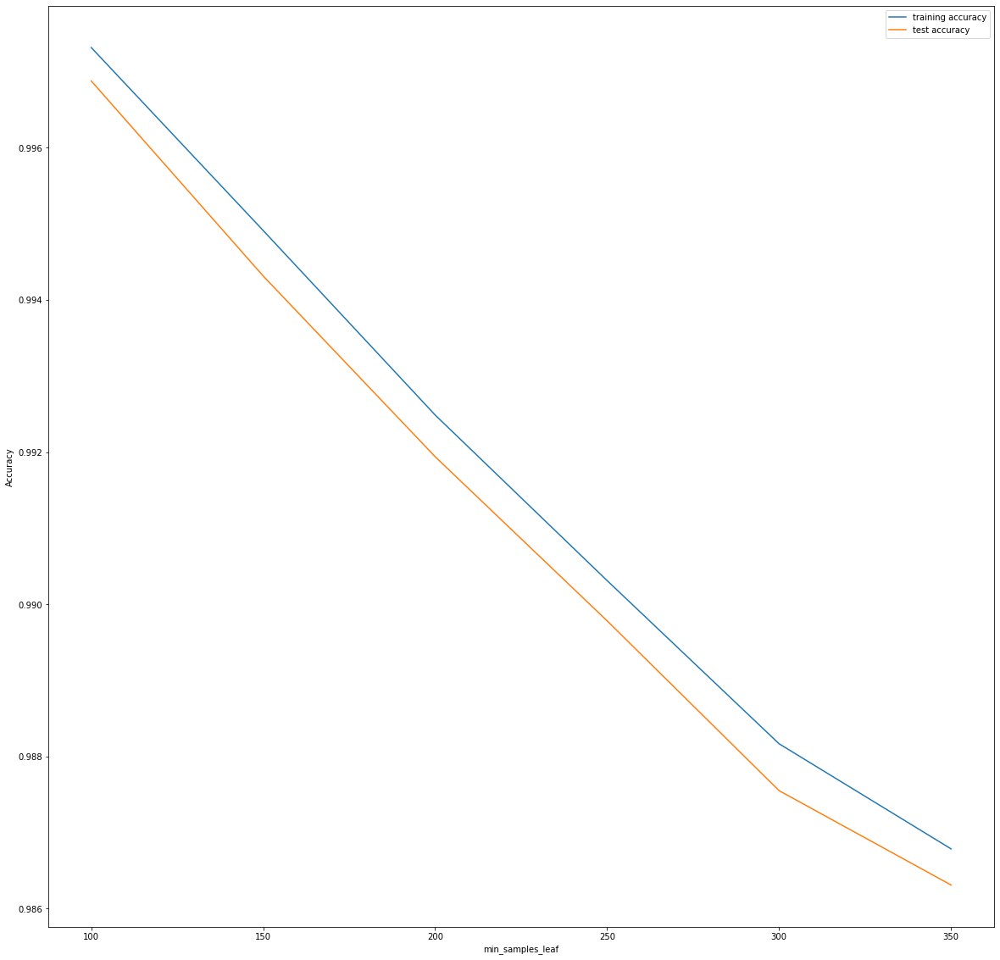

In [52]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [53]:
# Tuning min_samples_split
# GridSearchCV to find optimal min_samples_split
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", 
                  return_train_score=True)

rf.fit(X_train_cv, y_train_cv)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(),
             param_grid={'min_samples_split': range(200, 500, 50)},
             return_train_score=True, scoring='accuracy')

In [54]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,195.553450,7.347549,0.644882,0.016700,200,{'min_samples_split': 200},0.999231,0.999373,0.999330,0.999297,...,0.999226,0.000169,1,0.999621,0.999547,0.999736,0.999717,0.999511,0.999626,0.000089
1,195.434209,4.197167,0.643074,0.010227,250,{'min_samples_split': 250},0.998494,0.999055,0.998703,0.998439,...,0.998666,0.000216,2,0.999044,0.999162,0.999231,0.999019,0.999167,0.999125,0.000080
2,189.356945,10.870545,0.636956,0.030482,300,{'min_samples_split': 300},0.998120,0.998000,0.998406,0.998296,...,0.998160,0.000167,3,0.998659,0.998164,0.998777,0.998730,0.998579,0.998582,0.000219
3,191.709854,6.026647,0.632144,0.022818,350,{'min_samples_split': 350},0.997406,0.997571,0.997549,0.997329,...,0.997512,0.000131,4,0.997975,0.997851,0.998060,0.997928,0.998365,0.998036,0.000178
4,198.930493,1.713138,0.651015,0.021850,400,{'min_samples_split': 400},0.996461,0.996922,0.997153,0.996791,...,0.996775,0.000251,5,0.997227,0.997236,0.997826,0.997197,0.997203,0.997338,0.000245


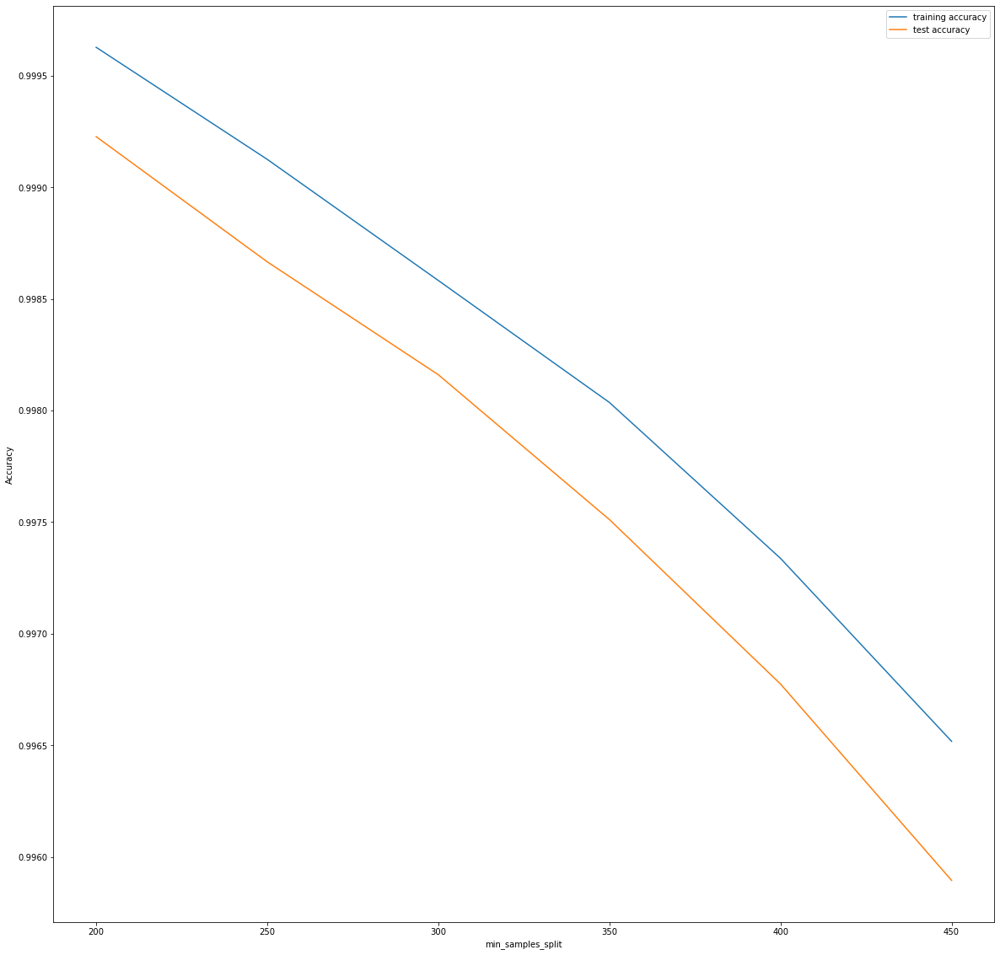

In [55]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [56]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1, return_train_score=True)

In [57]:
# Fit the grid search to the data
grid_search.fit(X_train_cv, y_train_cv)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 138.4min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 195.1min finished


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [4, 8, 10], 'max_features': [5, 10],
                         'min_samples_leaf': range(100, 400, 200),
                         'min_samples_split': range(200, 500, 200),
                         'n_estimators': [100, 200, 300]},
             return_train_score=True, verbose=1)

In [58]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9906507335645919 using {'max_depth': 10, 'max_features': 10, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 200}


In [59]:
# Fitting the final model with the best parameters obtained from grid search.
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=10,
                             min_samples_leaf=100, 
                             min_samples_split=200,
                             max_features=10,
                             n_estimators=200)

In [60]:
rfc.fit(X_train_cv,y_train_cv)

RandomForestClassifier(max_depth=10, max_features=10, min_samples_leaf=100,
                       min_samples_split=200, n_estimators=200)

In [61]:
# evaluation metrics
print(classification_report(y_test_cv,predictions))
print(confusion_matrix(y_test_cv,predictions))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.88      0.85      0.86        98

    accuracy                           1.00     56962
   macro avg       0.94      0.92      0.93     56962
weighted avg       1.00      1.00      1.00     56962

[[56853    11]
 [   15    83]]


# XGBoost

In [62]:
# Fitting the decision tree with default hyperparameters, apart from
model = XGBClassifier()
model.fit(X_train_cv, y_train_cv)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

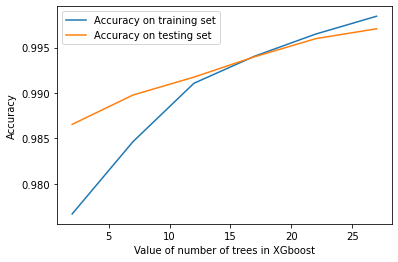

In [63]:
tree_range = range(2, 30, 5)
score1=[]
score2=[]
for tree in tree_range:
    xgb=XGBClassifier(n_estimators=tree)
    xgb.fit(X_train_cv,y_train_cv)
    score1.append(xgb.score(X_train_cv,y_train_cv))
    score2.append(xgb.score(X_test_cv,y_test_cv))
    
%matplotlib inline
plt.plot(tree_range,score1,label= 'Accuracy on training set')
plt.plot(tree_range,score2,label= 'Accuracy on testing set')
plt.xlabel('Value of number of trees in XGboost')
plt.ylabel('Accuracy')
plt.legend()

In [64]:
# make predictions for test data
# use predict_proba since we need probabilities to compute auc
y_pred = model.predict_proba(X_test_cv)
y_pred[:10]

array([[3.9339066e-06, 9.9999607e-01],
       [9.9999821e-01, 1.8073241e-06],
       [9.9997914e-01, 2.0859039e-05],
       [9.9999297e-01, 7.0277574e-06],
       [9.9999988e-01, 1.3303962e-07],
       [9.9999964e-01, 3.7022465e-07],
       [1.0000000e+00, 3.7923797e-09],
       [9.9999058e-01, 9.4081934e-06],
       [9.9999994e-01, 6.5928269e-08],
       [9.9999899e-01, 1.0368644e-06]], dtype=float32)

In [65]:
# evaluate predictions
roc = metrics.roc_auc_score(y_test_cv, y_pred[:, 1])
print("AUC: %.2f%%" % (roc * 100.0))

AUC: 98.80%


In [66]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# specify range of hyperparameters
param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          

# specify model
xgb_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb_model, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      


In [67]:
# fit the model
model_cv.fit(X_train_cv, y_train_cv)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:  9.5min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=200, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=Non

In [68]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,14.062220,0.566151,0.119614,0.004096,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.999752,0.999763,0.999792,...,0.999767,0.000014,5,0.999818,0.999774,0.999795,0.999771,0.999789,0.999789,0.000017
1,19.396052,0.331625,0.123350,0.002055,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.999737,0.999783,0.999787,...,0.999771,0.000018,4,0.999802,0.999789,0.999788,0.999790,0.999780,0.999790,0.000007
2,21.272641,0.086603,0.149317,0.054776,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.999698,0.999762,0.999768,...,0.999752,0.000028,6,0.999781,0.999774,0.999767,0.999769,0.999792,0.999777,0.000009
3,14.558586,0.117058,0.122326,0.001688,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.999927,0.999986,0.999967,...,0.999962,0.000019,2,0.999987,0.999981,0.999982,0.999980,0.999976,0.999981,0.000003
4,19.146991,0.162925,0.122640,0.003243,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.999926,0.999979,0.999970,...,0.999962,0.000019,3,0.999986,0.999983,0.999979,0.999984,0.999985,0.999984,0.000002
5,21.449500,0.282216,0.123413,0.004166,0.6,0.9,"{'learning_rate': 0.6, 'subsample': 0.9}",0.999947,0.999983,0.999979,...,0.999970,0.000013,1,0.999989,0.999986,0.999983,0.999982,0.999986,0.999985,0.000003


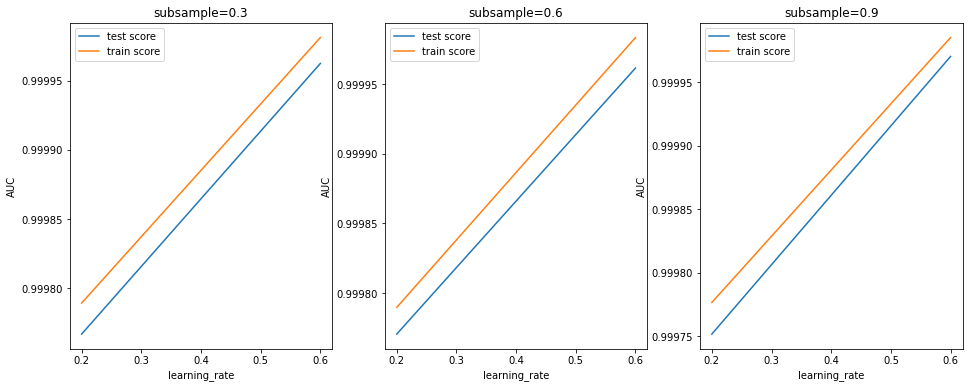

In [69]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    #plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    #plt.xscale('log')

In [70]:
# chosen hyperparameters
# 'objective':'binary:logistic' outputs probability rather than label, which we need for auc

#The results show that a subsample size of 0.6 and learning_rate of about 0.2 seems optimal.
#Also, XGBoost has resulted in the highest ROC AUC obtained (across various hyperparameters).

params = {'learning_rate': 0.2,
          'max_depth': 2, 
          'n_estimators':200,
          'subsample':0.9,
         'objective':'binary:logistic'}

# fit model on training data
model = XGBClassifier(params = params)
model.fit(X_train_cv, y_train_cv)

[03:25:52] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:480: 
Parameters: { params } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              params={'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 200,
                      'objective': 'binary:logistic', 'subsample': 0.9},
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [71]:
y_pred = model.predict_proba(X_test_cv)
y_pred[:10]

array([[3.9339066e-06, 9.9999607e-01],
       [9.9999821e-01, 1.8073241e-06],
       [9.9997914e-01, 2.0859039e-05],
       [9.9999297e-01, 7.0277574e-06],
       [9.9999988e-01, 1.3303962e-07],
       [9.9999964e-01, 3.7022465e-07],
       [1.0000000e+00, 3.7923797e-09],
       [9.9999058e-01, 9.4081934e-06],
       [9.9999994e-01, 6.5928269e-08],
       [9.9999899e-01, 1.0368644e-06]], dtype=float32)

In [72]:
# roc_auc
auc = sklearn.metrics.roc_auc_score(y_test_cv, y_pred[:, 1])
auc

0.9880310558382047

In [73]:
# feature importance
importance = dict(zip(X_train_cv.columns, model.feature_importances_))
importance

{'V1': 0.011396532,
 'V2': 0.0108800735,
 'V3': 0.014435098,
 'V4': 0.05894277,
 'V5': 0.0074378033,
 'V6': 0.012085624,
 'V7': 0.008799154,
 'V8': 0.017204836,
 'V9': 0.007804199,
 'V10': 0.012307141,
 'V11': 0.012802937,
 'V12': 0.026587361,
 'V13': 0.008084259,
 'V14': 0.6760931,
 'V15': 0.0111750625,
 'V16': 0.00570581,
 'V17': 0.006986077,
 'V18': 0.009242646,
 'V19': 0.009143266,
 'V20': 0.00566578,
 'V21': 0.006549984,
 'V22': 0.0039345506,
 'V23': 0.0071852533,
 'V24': 0.0065920088,
 'V25': 0.008223312,
 'V26': 0.009208885,
 'V27': 0.004872599,
 'V28': 0.004433163,
 'Amount': 0.016220951}

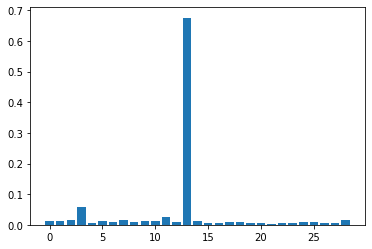

In [74]:
# plot
plt.bar(range(len(model.feature_importances_)), model.feature_importances_)
plt.show()

#### Proceed with the model which shows the best result 
- Apply the best hyperparameter on the model
- Predict on the test dataset

In [75]:
clf = XGBClassifier(params = params)  #initialise the model with optimum hyperparameters
clf.fit(X_train_cv, y_train_cv)
print(sklearn.metrics.roc_auc_score(y_test_cv, y_pred[:, 1])) #print the evaluation score on the X_test by choosing the best evaluation metric

[03:27:05] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:480: 
Parameters: { params } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


0.9880310558382047


##### Build models on other algorithms to see the better performing on SMOTE

### Print the class distribution after applying ADASYN

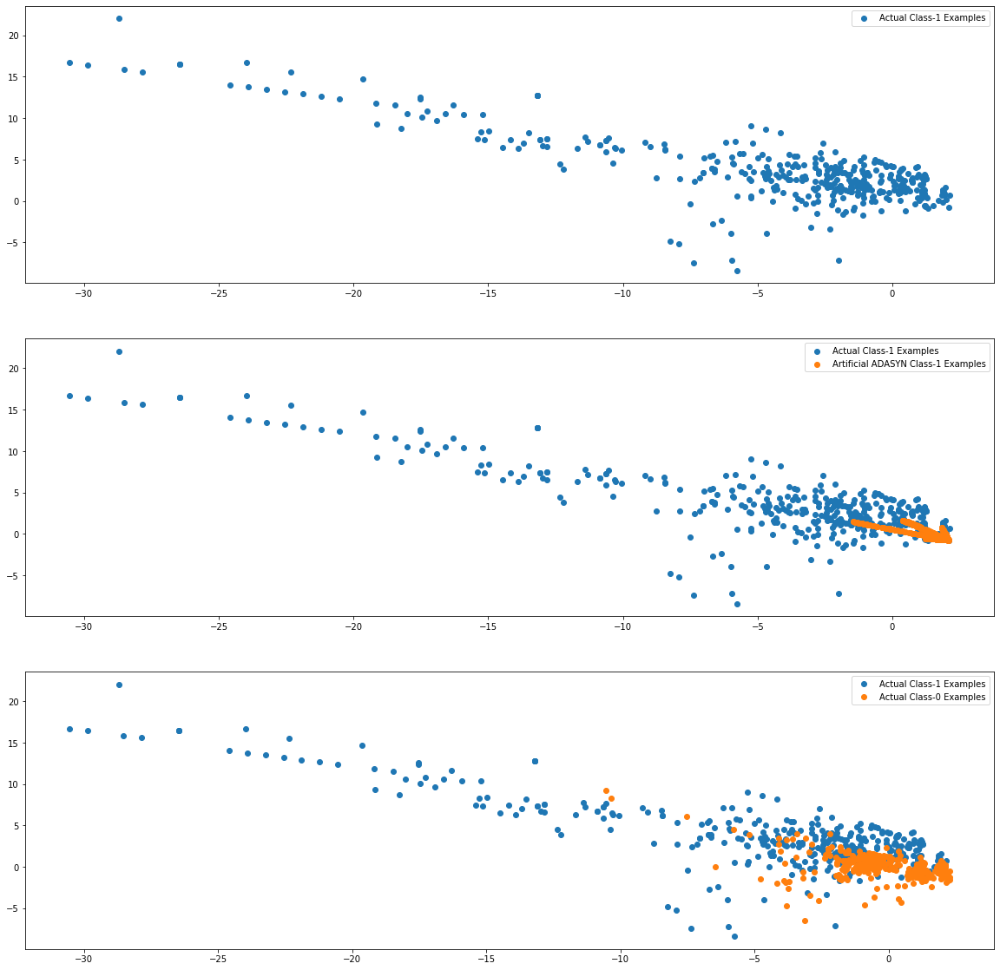

In [77]:
import warnings
warnings.filterwarnings("ignore")

from imblearn import over_sampling

ada = over_sampling.ADASYN(random_state=0)
X_train_adasyn, y_train_adasyn = ada.fit_resample(X_train, y_train)
# Artificial minority samples and corresponding minority labels from ADASYN are appended
# below X_train and y_train respectively
# So to exclusively get the artificial minority samples from ADASYN, we do
X_train_adasyn_1 = X_train_adasyn[X_train.shape[0]:]

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]



import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
fig = plt.figure()

plt.subplot(3, 1, 1)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 2)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_adasyn_1.iloc[:X_train_1.shape[0], 0], X_train_adasyn_1.iloc[:X_train_1.shape[0], 1],
            label='Artificial ADASYN Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 3)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], 0], X_train_0[:X_train_1.shape[0], 1], label='Actual Class-0 Examples')
plt.legend()

##### Build models on other algorithms to see the better performing on ADASYN

In [89]:
#perform cross validation & then balance classes on X_train_cv & y_train_cv using SMOTE

#perform hyperparameter tuning

#print the evaluation result by choosing a evaluation metric

#print the optimum value of hyperparameters
X_train_cv = X_train_adasyn
X_test_cv = X_test
y_train_cv = y_train_adasyn
y_test_cv = y_test


### Logistic Regression

In [79]:
#Logist Regression

for i in range (2,29):
    # specify model
    lm = LogisticRegression()
    lm.fit(X_train_cv,y_train_cv)
    
    rfe=RFE(lm,i)
    rfe = rfe.fit(X_train_cv, y_train_cv)
    
    # tuples of (feature name, whether selected, ranking)
    list(zip(X_train_cv.columns,rfe.support_,rfe.ranking_))
    
    # predict prices of X_test
    y_pred = rfe.predict(X_test_cv)
    
    # evaluate the model on test set
    r2 = sklearn.metrics.r2_score(y_test_cv, y_pred)
    print('{0}. RFE Score {1} with number of features={2}'.format(i-1,r2,i))

print('\n')
# k-fold CV (using all the 29 variables)
for i in range (2,10):
    cv_num = cross_val_score(lm, X_train_cv, y_train_cv, scoring='r2', cv=i)
    print('cv = {0}, mean value is {1}'.format(i,round(cv_num.mean(),2)*100))


1. RFE Score -45.375705227223115 with number of features=2
2. RFE Score -38.455636362592294 with number of features=3
3. RFE Score -37.80144964569957 with number of features=4
4. RFE Score -37.597016296670596 with number of features=5
5. RFE Score -36.44196787465688 with number of features=6
6. RFE Score -32.9257142713585 with number of features=7
7. RFE Score -33.08926095058168 with number of features=8
8. RFE Score -33.73322600002296 with number of features=9
9. RFE Score -32.465739236043305 with number of features=10
10. RFE Score -32.44529590114041 with number of features=11
11. RFE Score -30.636060762233974 with number of features=12
12. RFE Score -30.738277436748465 with number of features=13
13. RFE Score -31.3106908140296 with number of features=14
14. RFE Score -31.11647913245207 with number of features=15
15. RFE Score -31.995542533276662 with number of features=16
16. RFE Score -32.45551756859186 with number of features=17
17. RFE Score -31.791109184247688 with number of fea

In [80]:
#from sklearn.model_selection import GridSearchCV

#perform cross validation
# creating a KFold object with 5 splits 
folds = StratifiedKFold(n_splits = 4, shuffle = False, random_state = None)

#perform hyperparameter tuning
hyper_params = [{'n_features_to_select': list(range(1, 30))}]

# step-3: perform grid search
# 3.1 specify model
lm = LogisticRegression()
lm.fit(X_train_cv, y_train_cv)
rfe = RFE(lm)     

#print the evaluation result by choosing a evaluation metric
model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)

# fit the model
model_cv.fit(X_train_cv, y_train_cv)  


Fitting 4 folds for each of 29 candidates, totalling 116 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 116 out of 116 | elapsed: 38.3min finished


GridSearchCV(cv=StratifiedKFold(n_splits=4, random_state=None, shuffle=False),
             estimator=RFE(estimator=LogisticRegression()),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                   10, 11, 12, 13, 14, 15, 16,
                                                   17, 18, 19, 20, 21, 22, 23,
                                                   24, 25, 26, 27, 28, 29]}],
             return_train_score=True, scoring='r2', verbose=1)

In [81]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,27.854247,1.356627,0.005202,0.000624,1,{'n_features_to_select': 1},0.330490,0.369569,0.546461,0.558948,0.451367,0.102370,29,0.492117,0.477636,0.420372,0.416738,0.451716,0.033578
1,27.417101,1.334106,0.005194,0.000225,2,{'n_features_to_select': 2},0.446495,0.502915,0.665351,0.586454,0.550304,0.083013,28,0.567319,0.579490,0.543671,0.572713,0.565798,0.013484
2,27.506695,1.153926,0.005181,0.000381,3,{'n_features_to_select': 3},0.576113,0.512799,0.668974,0.638583,0.599117,0.060036,24,0.616669,0.635358,0.552288,0.601286,0.601401,0.030815
3,27.283391,1.614754,0.005642,0.000629,4,{'n_features_to_select': 4},0.574987,0.479208,0.681777,0.632779,0.592188,0.075389,26,0.618451,0.650777,0.589174,0.602611,0.615253,0.022979
4,26.787716,1.441419,0.006165,0.000254,5,{'n_features_to_select': 5},0.569993,0.480650,0.682867,0.634151,0.591915,0.075691,27,0.627151,0.666511,0.590324,0.605144,0.622282,0.028701
5,26.633696,1.447189,0.007828,0.000480,6,{'n_features_to_select': 6},0.560074,0.508086,0.697992,0.661517,0.606917,0.076220,20,0.637340,0.684286,0.605871,0.642921,0.642604,0.027904
6,25.952806,1.219903,0.008309,0.000296,7,{'n_features_to_select': 7},0.536190,0.489092,0.721594,0.667391,0.603567,0.094404,22,0.627550,0.682738,0.629766,0.642933,0.645747,0.022152
7,25.484728,1.190308,0.007487,0.000362,8,{'n_features_to_select': 8},0.559933,0.464716,0.721454,0.674039,0.605035,0.100048,21,0.639404,0.702682,0.634198,0.631583,0.651967,0.029416
8,25.277080,0.985011,0.008277,0.000689,9,{'n_features_to_select': 9},0.544421,0.470168,0.722368,0.671260,0.602054,0.099976,23,0.653028,0.712367,0.627902,0.639380,0.658169,0.032531
9,24.703632,1.142959,0.007420,0.000848,10,{'n_features_to_select': 10},0.544773,0.472349,0.702389,0.670451,0.597490,0.093229,25,0.651375,0.718136,0.623997,0.657155,0.662666,0.034388


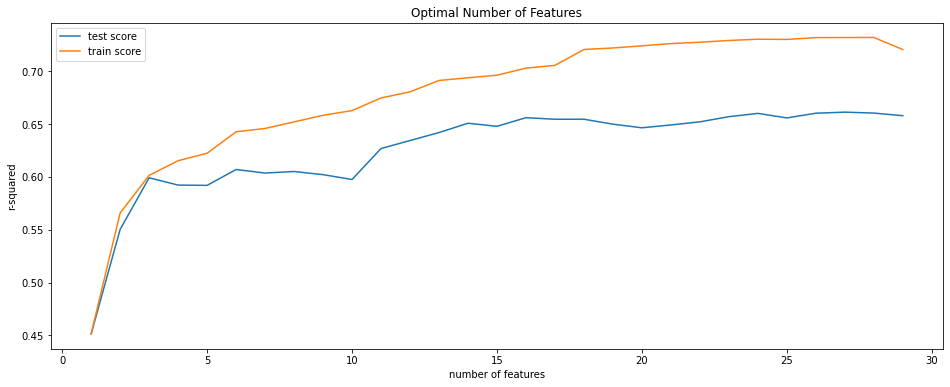

In [82]:
# plotting cv results
plt.figure(figsize=(16,6))

plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

In [83]:
# final model
n_features_optimal = 20

lm = LogisticRegression()
lm.fit(X_train_cv, y_train_cv)

rfe = RFE(lm, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train_cv, y_train_cv)

# predict prices of X_test
y_pred = lm.predict(X_test_cv)
r2 = sklearn.metrics.r2_score(y_test_cv, y_pred)
print(r2)

-31.147144134806418


### Similarly explore other algorithms on balanced dataset by building models like:
- KNN
- SVM
- Decision Tree
- Random Forest
- XGBoost

# Decision Tree

In [90]:
# Importing decision tree classifier from sklearn library

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(max_depth=5)
dt_default.fit(X_train_cv, y_train_cv)


DecisionTreeClassifier(max_depth=5)

In [91]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics


# Making predictions
y_pred_default = dt_default.predict(X_test_cv)

# Printing classification report
print(classification_report(y_test_cv, y_pred_default))


              precision    recall  f1-score   support

           0       1.00      0.94      0.97     56864
           1       0.03      0.93      0.05        98

    accuracy                           0.94     56962
   macro avg       0.51      0.94      0.51     56962
weighted avg       1.00      0.94      0.97     56962



In [92]:
# Printing confusion matrix and accuracy
print(confusion_matrix(y_test_cv,y_pred_default))
print(accuracy_score(y_test_cv,y_pred_default))


[[53606  3258]
 [    7    91]]
0.942681085636038


In [101]:
# Putting features
features = list(df.columns[1:])
features


['V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'Amount',
 'Class']

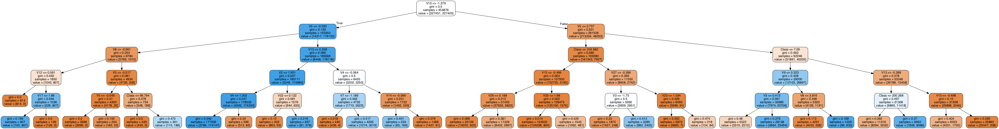

In [102]:
# plotting tree with max_depth=3

dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,
                feature_names=features, filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


In [103]:
# Tuning max_depth
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'max_depth': range(1, 30)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = None)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
tree.fit(X_train_cv, y_train_cv)


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': range(1, 30)}, return_train_score=True,
             scoring='accuracy')

In [104]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.312238,0.060142,0.011095,0.001597,1,{'max_depth': 1},0.833308,0.835185,0.855686,0.895026,...,0.860824,0.025262,29,0.870572,0.867615,0.864829,0.852913,0.857164,0.862619,0.006588
1,2.754816,0.130601,0.011614,0.001991,2,{'max_depth': 2},0.843838,0.843419,0.868129,0.905513,...,0.871066,0.025483,28,0.882773,0.876549,0.876164,0.862070,0.868363,0.873184,0.007196
2,3.801558,0.035693,0.010532,0.000316,3,{'max_depth': 3},0.880166,0.887936,0.908272,0.897906,...,0.894360,0.009579,27,0.907329,0.906005,0.905840,0.906189,0.908209,0.906714,0.000912
3,5.013677,0.096362,0.010253,0.000309,4,{'max_depth': 4},0.920660,0.906029,0.898741,0.923265,...,0.910406,0.009754,26,0.930445,0.925999,0.922361,0.917456,0.922781,0.923808,0.004298
4,6.294348,0.369412,0.011859,0.001754,5,{'max_depth': 5},0.916868,0.916581,0.930420,0.947337,...,0.924812,0.012749,25,0.941377,0.943655,0.941586,0.939800,0.944007,0.942085,0.001558


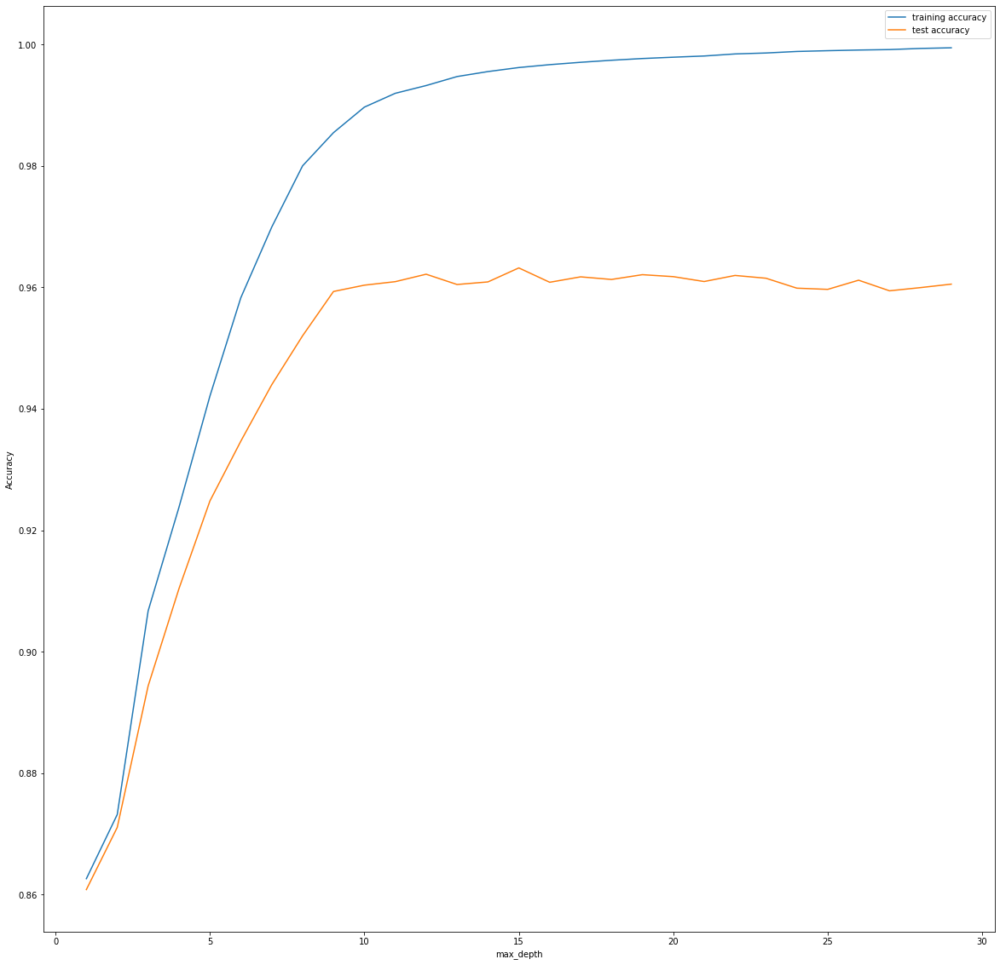

In [105]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [106]:
# Tuning min_samples_leaf
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
tree.fit(X_train_cv, y_train_cv)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(random_state=100),
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             return_train_score=True, scoring='accuracy')

In [107]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,18.619627,0.860423,0.012602,0.001565,5,{'min_samples_leaf': 5},0.933939,0.951382,0.944666,0.980390,...,0.954300,0.015768,10,0.999288,0.999203,0.999247,0.999266,0.999214,0.999244,0.000032
1,18.729018,0.849025,0.014093,0.000428,25,{'min_samples_leaf': 25},0.949206,0.953075,0.944204,0.981577,...,0.957984,0.013135,2,0.996285,0.996834,0.996560,0.996494,0.996540,0.996542,0.000176
2,18.225753,1.320748,0.013339,0.000820,45,{'min_samples_leaf': 45},0.949316,0.948854,0.941742,0.980951,...,0.957604,0.014375,3,0.993971,0.994246,0.994163,0.994394,0.994125,0.994180,0.000139
3,17.827268,1.546706,0.013638,0.000504,65,{'min_samples_leaf': 65},0.942139,0.951679,0.939643,0.977510,...,0.955043,0.014173,9,0.991860,0.992121,0.992152,0.992116,0.992196,0.992089,0.000118
4,17.025599,0.898740,0.013891,0.000380,85,{'min_samples_leaf': 85},0.947459,0.947546,0.945798,0.978049,...,0.957347,0.013166,4,0.990311,0.990313,0.990247,0.990192,0.990341,0.990281,0.000054


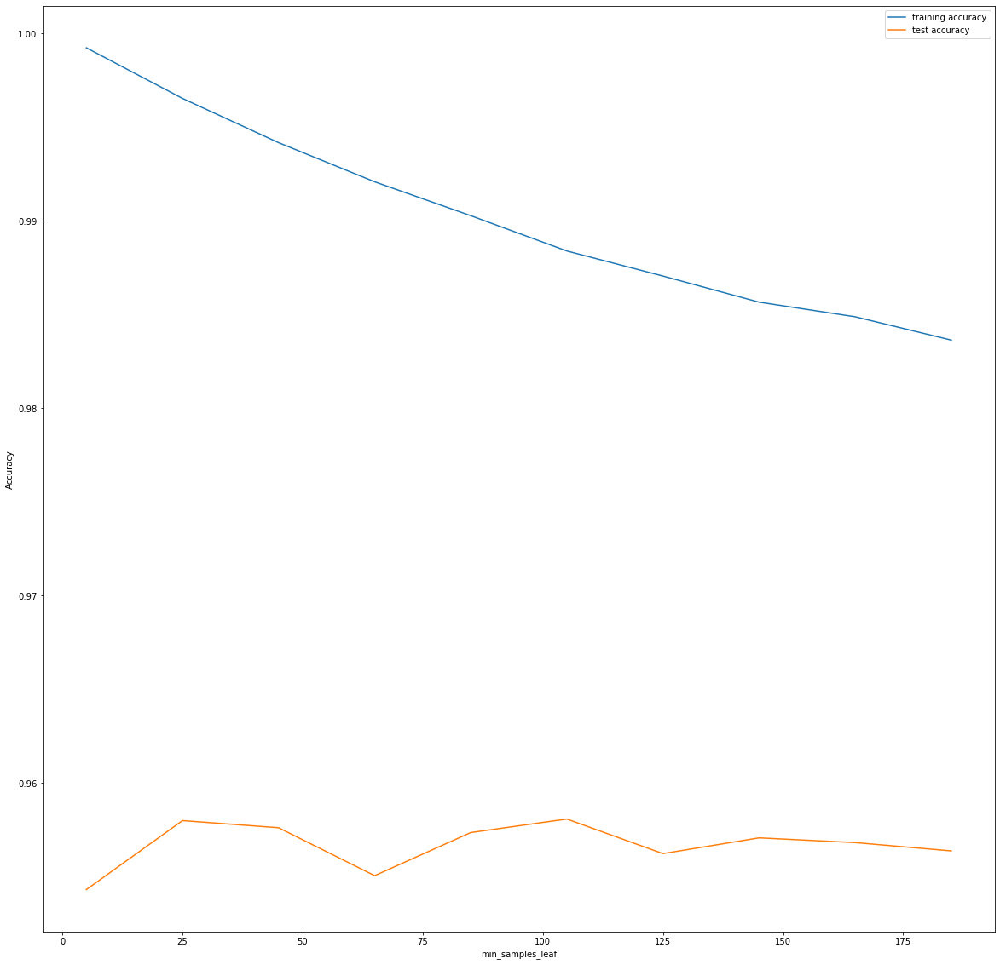

In [108]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [109]:
# Tuning min_samples_split
# GridSearchCV to find optimal min_samples_split

# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True)
tree.fit(X_train_cv, y_train_cv)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(random_state=100),
             param_grid={'min_samples_split': range(5, 200, 20)},
             return_train_score=True, scoring='accuracy')

In [110]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,20.698972,0.532429,0.013770,0.000518,5,{'min_samples_split': 5},0.944315,0.952723,0.949942,0.981775,...,0.957386,0.012988,1,0.999975,0.999951,0.999981,0.999970,0.999967,0.999969,0.000010
1,20.715954,0.555203,0.014051,0.000750,25,{'min_samples_split': 25},0.930223,0.949986,0.949096,0.978368,...,0.952249,0.015389,9,0.999742,0.999706,0.999717,0.999706,0.999791,0.999732,0.000032
2,20.471148,0.408864,0.013802,0.000178,45,{'min_samples_split': 45},0.930366,0.948140,0.946645,0.977983,...,0.951569,0.015448,10,0.999351,0.999431,0.999428,0.999390,0.999404,0.999401,0.000029
3,20.545931,0.509999,0.013707,0.000356,65,{'min_samples_split': 65},0.931817,0.951162,0.947887,0.978225,...,0.953906,0.015269,3,0.998928,0.998983,0.999187,0.999019,0.999101,0.999044,0.000091
4,20.376667,0.609155,0.014052,0.000342,85,{'min_samples_split': 85},0.931564,0.948975,0.949250,0.978653,...,0.952655,0.015170,6,0.998785,0.998458,0.998821,0.998717,0.998755,0.998707,0.000129


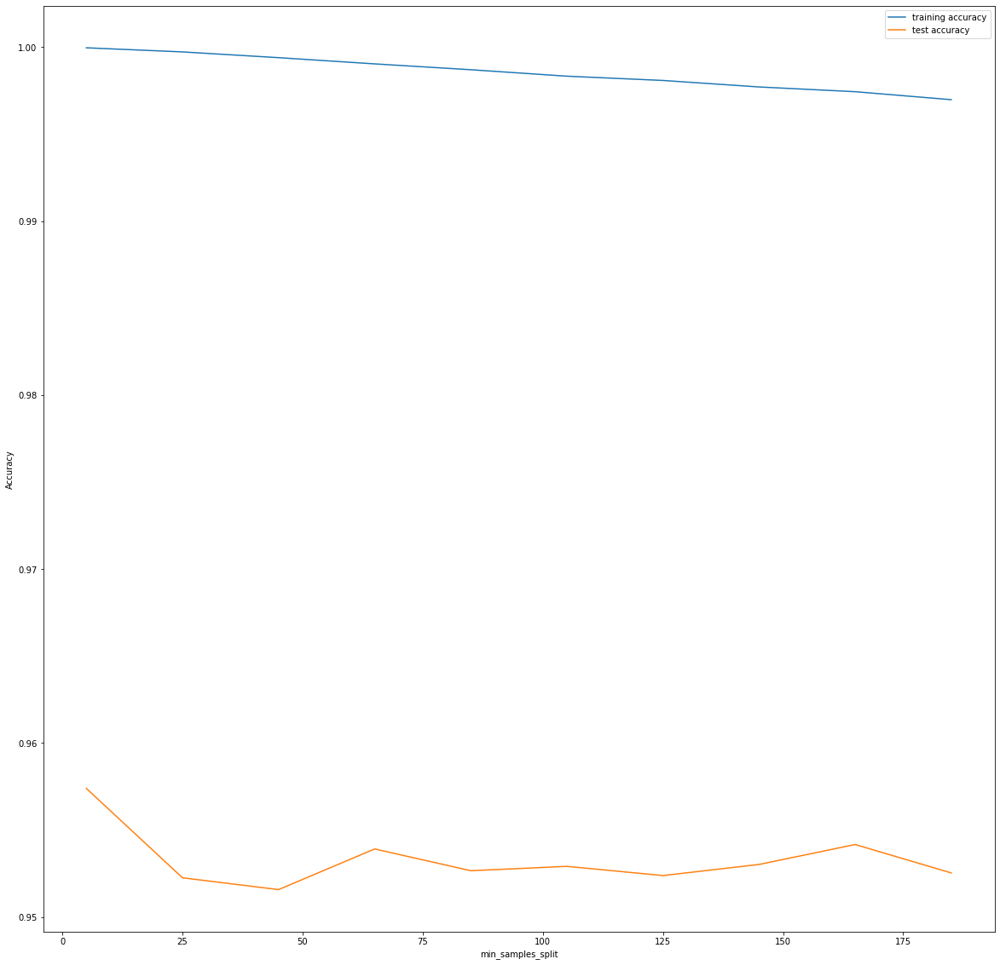

In [111]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [112]:
# Grid Search to Find Optimal Hyperparameters
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(100, 200, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, return_train_score=True)

# Fit the grid search to the data
grid_search.fit(X_train_cv,y_train_cv)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed: 10.9min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(100, 200, 50),
                         'min_samples_split': range(50, 150, 50)},
             return_train_score=True, verbose=1)

In [113]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,7.538753,0.500772,0.010389,0.001672,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.907987,...,0.918261,0.011167,13,0.929489,0.935406,0.932144,0.927384,0.936964,0.932277,0.003563
1,6.791236,0.042301,0.010057,0.000344,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.907987,...,0.918261,0.011167,13,0.929489,0.935406,0.932144,0.927384,0.936964,0.932277,0.003563
2,6.739657,0.025176,0.009145,0.000391,entropy,5,150,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.907877,...,0.918239,0.011188,15,0.929354,0.935406,0.932144,0.927200,0.936964,0.932213,0.003635
3,6.709181,0.013871,0.009380,0.000388,entropy,5,150,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.907877,...,0.918239,0.011188,15,0.929354,0.935406,0.932144,0.927200,0.936964,0.932213,0.003635
4,10.514179,0.162583,0.010260,0.000826,entropy,10,100,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.950108,...,0.955852,0.005143,3,0.984600,0.984749,0.985265,0.980399,0.985793,0.984161,0.001928
5,10.562006,0.196203,0.010084,0.000275,entropy,10,100,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.950130,...,0.955753,0.005148,5,0.984595,0.984749,0.985268,0.980399,0.985793,0.984161,0.001928
6,10.440691,0.185183,0.009869,0.000406,entropy,10,150,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.948822,...,0.950560,0.006856,8,0.984193,0.982594,0.983223,0.977763,0.984389,0.982433,0.002424
7,10.500657,0.201075,0.010941,0.000937,entropy,10,150,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.948822,...,0.950595,0.006879,7,0.984193,0.982594,0.983223,0.977763,0.984389,0.982433,0.002424
8,5.394740,0.041134,0.009921,0.000292,gini,5,100,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.916868,...,0.924821,0.012803,11,0.941377,0.943650,0.941437,0.939670,0.944004,0.942028,0.001604
9,5.380118,0.038971,0.009043,0.000626,gini,5,100,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.916868,...,0.924821,0.012803,11,0.941377,0.943650,0.941437,0.939670,0.944004,0.942028,0.001604


In [114]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.9570454491765015
DecisionTreeClassifier(max_depth=10, min_samples_leaf=100,
                       min_samples_split=100)


In [115]:
# tree with max_depth = 3
clf_gini = DecisionTreeClassifier(criterion = "entropy", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=100,
                                  min_samples_split=100)
clf_gini.fit(X_train_cv, y_train_cv)

# score
print(clf_gini.score(X_test_cv,y_test_cv))

0.9747550998911555


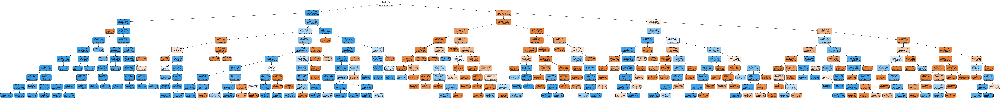

In [116]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [117]:
# classification metrics
y_pred = clf_gini.predict(X_test_cv)
print(classification_report(y_test_cv, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.97      0.99     56864
           1       0.06      0.93      0.11        98

    accuracy                           0.97     56962
   macro avg       0.53      0.95      0.55     56962
weighted avg       1.00      0.97      0.99     56962



In [118]:
# confusion matrix
print(confusion_matrix(y_test_cv,y_pred))

[[55433  1431]
 [    7    91]]


# Random Forest

In [119]:
# Running the random forest with default parameters.
rfc = RandomForestClassifier()

# fit
rfc.fit(X_train_cv,y_train_cv)

RandomForestClassifier()

In [120]:
# Making predictions
predictions = rfc.predict(X_test_cv)

In [121]:
# Let's check the report of our default model
print(classification_report(y_test_cv,predictions))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.88      0.84      0.86        98

    accuracy                           1.00     56962
   macro avg       0.94      0.92      0.93     56962
weighted avg       1.00      1.00      1.00     56962



In [122]:
# Printing confusion matrix
print(confusion_matrix(y_test_cv,predictions))

[[56853    11]
 [   16    82]]


In [123]:
print(accuracy_score(y_test_cv,predictions))

0.9995259997893332


In [124]:
# Tuning max_features

# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'max_features': [4, 8, 14, 20, 24]}

# instantiate the model
rf = RandomForestClassifier(max_depth=4)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", 
                  return_train_score=True)

rf.fit(X_train_cv, y_train_cv)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(max_depth=4),
             param_grid={'max_features': [4, 8, 14, 20, 24]},
             return_train_score=True, scoring='accuracy')

In [125]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,40.719900,0.844168,0.280801,0.007315,4,{'max_features': 4},0.886113,0.861929,0.903941,0.934092,...,0.900850,0.025087,5,0.920234,0.913306,0.920789,0.913913,0.920539,0.917756,0.003396
1,78.552532,0.541075,0.273845,0.006468,8,{'max_features': 8},0.898940,0.903380,0.904974,0.950811,...,0.915531,0.018948,4,0.936403,0.939341,0.931204,0.937118,0.937107,0.936234,0.002703
2,135.567953,0.366422,0.274621,0.007645,14,{'max_features': 14},0.913681,0.921836,0.927332,0.945897,...,0.926191,0.010779,2,0.940181,0.942685,0.944757,0.939420,0.940278,0.941464,0.001978
3,190.767477,0.539541,0.267980,0.004949,20,{'max_features': 20},0.911548,0.929783,0.924243,0.942215,...,0.926806,0.009859,1,0.939643,0.945634,0.939874,0.939591,0.941806,0.941309,0.002312
4,228.646837,0.671816,0.272254,0.006875,24,{'max_features': 24},0.913988,0.925496,0.922836,0.935565,...,0.923834,0.006997,3,0.936903,0.941402,0.937843,0.929670,0.939877,0.937139,0.004050


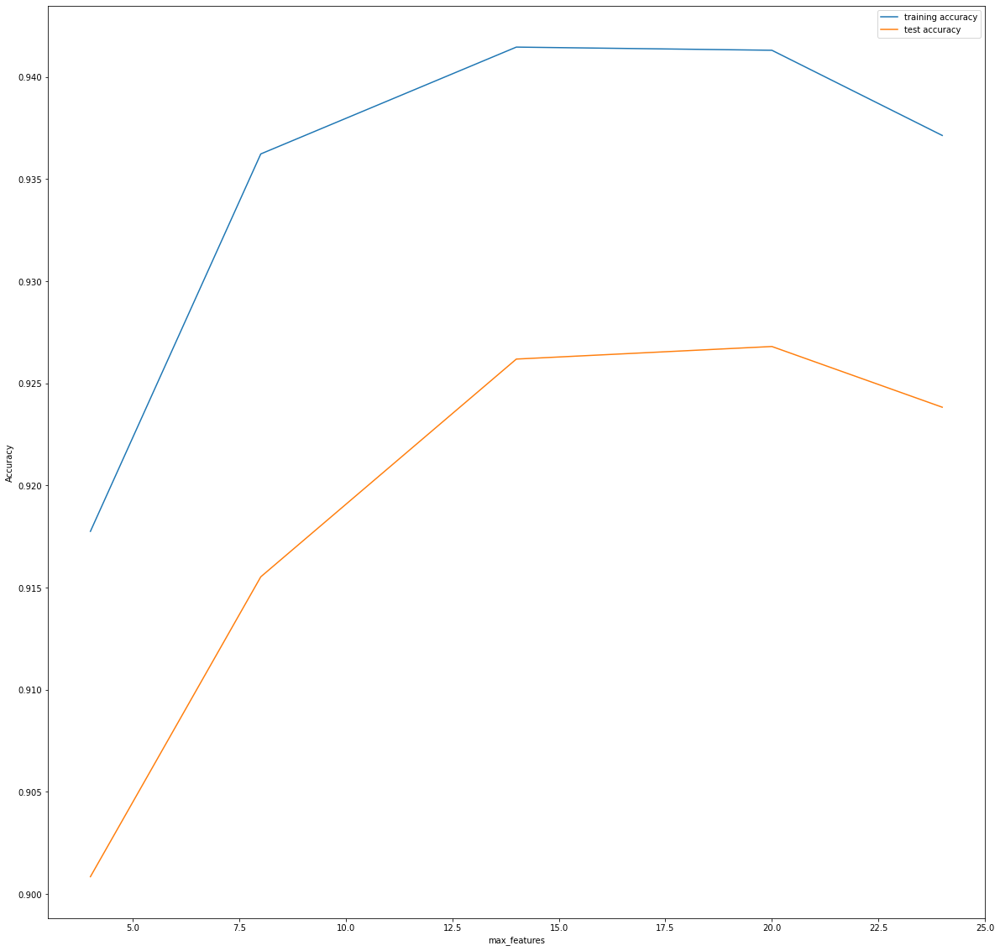

In [126]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [127]:
# Tuning min_samples_leaf
# GridSearchCV to find optimal min_samples_leaf
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", 
                  return_train_score=True)

rf.fit(X_train_cv, y_train_cv)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(),
             param_grid={'min_samples_leaf': range(100, 400, 50)},
             return_train_score=True, scoring='accuracy')

In [128]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,140.659341,1.514444,0.505465,0.002912,100,{'min_samples_leaf': 100},0.960781,0.949777,0.962825,0.997626,...,0.966639,0.016206,1,0.998750,0.998634,0.998840,0.998945,0.998659,0.998766,0.000115
1,135.252271,0.416370,0.503066,0.005970,150,{'min_samples_leaf': 150},0.960616,0.946568,0.961869,0.996043,...,0.965032,0.016473,2,0.998046,0.997521,0.998376,0.998225,0.997546,0.997943,0.000350
2,130.679952,1.018399,0.484162,0.002342,200,{'min_samples_leaf': 200},0.959264,0.942743,0.961297,0.995614,...,0.963603,0.017345,3,0.997123,0.996821,0.997499,0.997123,0.996870,0.997087,0.000241
3,127.316396,0.677654,0.489440,0.011326,250,{'min_samples_leaf': 250},0.956428,0.942907,0.955120,0.995043,...,0.961873,0.017545,4,0.995958,0.995144,0.995177,0.996565,0.995554,0.995680,0.000532
4,125.458151,0.755318,0.479470,0.007847,300,{'min_samples_leaf': 300},0.955307,0.937763,0.954097,0.992437,...,0.959204,0.017962,5,0.995078,0.994617,0.993858,0.995427,0.994927,0.994782,0.000530


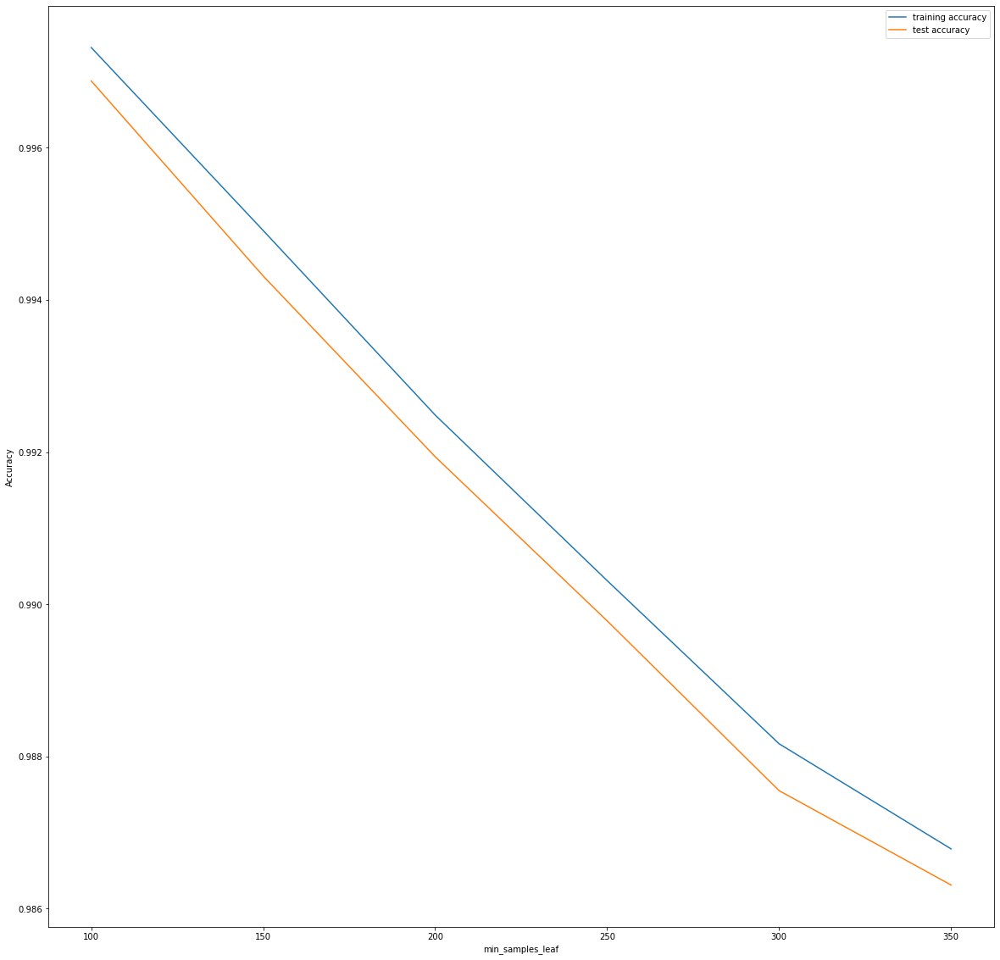

In [52]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [129]:
# Tuning min_samples_split
# GridSearchCV to find optimal min_samples_split
# specify number of folds for k-fold CV
n_folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", 
                  return_train_score=True)

rf.fit(X_train_cv, y_train_cv)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(),
             param_grid={'min_samples_split': range(200, 500, 50)},
             return_train_score=True, scoring='accuracy')

In [130]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,170.956447,2.007928,0.541606,0.003446,200,{'min_samples_split': 200},0.954933,0.943094,0.944633,0.993724,...,0.959363,0.018347,4,0.999940,0.999777,0.999863,0.999907,0.999915,0.999880,0.000057
1,168.582136,1.112503,0.556307,0.012119,250,{'min_samples_split': 250},0.952988,0.943578,0.947249,0.995142,...,0.959888,0.018529,1,0.999918,0.999703,0.999838,0.999901,0.999832,0.999838,0.000076
2,170.330340,1.182249,0.552351,0.015814,300,{'min_samples_split': 300},0.950580,0.944644,0.943820,0.996625,...,0.959158,0.019617,6,0.999786,0.999662,0.999761,0.999876,0.999766,0.999770,0.000068
3,168.659326,2.008698,0.547636,0.006284,350,{'min_samples_split': 350},0.955054,0.943952,0.942589,0.997582,...,0.959666,0.019989,3,0.999830,0.999585,0.999761,0.999874,0.999640,0.999738,0.000110
4,169.573100,1.400709,0.553324,0.016394,400,{'min_samples_split': 400},0.954570,0.943237,0.943556,0.996592,...,0.959349,0.019592,5,0.999646,0.999552,0.999678,0.999841,0.999558,0.999655,0.000105


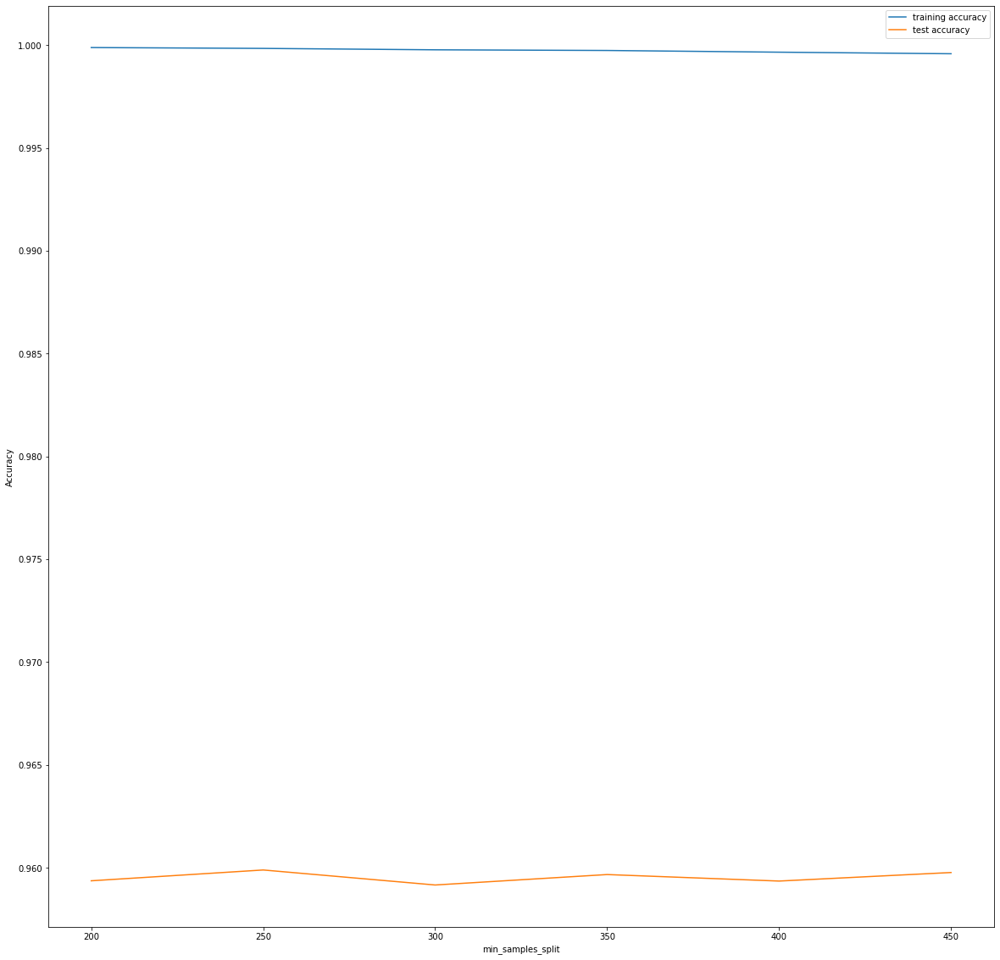

In [131]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [132]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1, return_train_score=True)

In [133]:
# Fit the grid search to the data
grid_search.fit(X_train_cv, y_train_cv)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 104.6min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 163.2min finished


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [4, 8, 10], 'max_features': [5, 10],
                         'min_samples_leaf': range(100, 400, 200),
                         'min_samples_split': range(200, 500, 200),
                         'n_estimators': [100, 200, 300]},
             return_train_score=True, verbose=1)

In [134]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9588855034672297 using {'max_depth': 10, 'max_features': 10, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 300}


In [135]:
# Fitting the final model with the best parameters obtained from grid search.
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=10,
                             min_samples_leaf=100, 
                             min_samples_split=200,
                             max_features=10,
                             n_estimators=300)

In [136]:
rfc.fit(X_train_cv,y_train_cv)

RandomForestClassifier(max_depth=10, max_features=10, min_samples_leaf=100,
                       min_samples_split=200, n_estimators=300)

In [137]:
# evaluation metrics
print(classification_report(y_test_cv,predictions))
print(confusion_matrix(y_test_cv,predictions))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.88      0.84      0.86        98

    accuracy                           1.00     56962
   macro avg       0.94      0.92      0.93     56962
weighted avg       1.00      1.00      1.00     56962

[[56853    11]
 [   16    82]]


# XGBoost

In [139]:
# Fitting the decision tree with default hyperparameters, apart from
model = XGBClassifier()
eval_set=[(X_train_cv, y_train_cv), (X_test_cv, y_test_cv)]
model.fit(X_train_cv, y_train_cv, eval_metric=['auc','error','logloss'], 
          eval_set=eval_set, verbose=True)


[0]	validation_0-auc:0.98853	validation_0-error:0.04201	validation_0-logloss:0.47225	validation_1-auc:0.97363	validation_1-error:0.05147	validation_1-logloss:0.47455
[1]	validation_0-auc:0.99248	validation_0-error:0.02970	validation_0-logloss:0.34581	validation_1-auc:0.97182	validation_1-error:0.03690	validation_1-logloss:0.34975
[2]	validation_0-auc:0.99479	validation_0-error:0.02838	validation_0-logloss:0.26419	validation_1-auc:0.98548	validation_1-error:0.03666	validation_1-logloss:0.26879
[3]	validation_0-auc:0.99685	validation_0-error:0.02350	validation_0-logloss:0.20723	validation_1-auc:0.98463	validation_1-error:0.02755	validation_1-logloss:0.21141
[4]	validation_0-auc:0.99762	validation_0-error:0.01943	validation_0-logloss:0.16583	validation_1-auc:0.98528	validation_1-error:0.02458	validation_1-logloss:0.16959
[5]	validation_0-auc:0.99805	validation_0-error:0.01720	validation_0-logloss:0.13660	validation_1-auc:0.98678	validation_1-error:0.02161	validation_1-logloss:0.13944
[6]	

[50]	validation_0-auc:0.99999	validation_0-error:0.00030	validation_0-logloss:0.00339	validation_1-auc:0.98550	validation_1-error:0.00130	validation_1-logloss:0.00600
[51]	validation_0-auc:0.99999	validation_0-error:0.00026	validation_0-logloss:0.00313	validation_1-auc:0.98613	validation_1-error:0.00123	validation_1-logloss:0.00572
[52]	validation_0-auc:0.99999	validation_0-error:0.00025	validation_0-logloss:0.00299	validation_1-auc:0.98569	validation_1-error:0.00118	validation_1-logloss:0.00554
[53]	validation_0-auc:0.99999	validation_0-error:0.00024	validation_0-logloss:0.00287	validation_1-auc:0.98501	validation_1-error:0.00119	validation_1-logloss:0.00543
[54]	validation_0-auc:1.00000	validation_0-error:0.00021	validation_0-logloss:0.00267	validation_1-auc:0.98568	validation_1-error:0.00111	validation_1-logloss:0.00524
[55]	validation_0-auc:1.00000	validation_0-error:0.00019	validation_0-logloss:0.00244	validation_1-auc:0.98617	validation_1-error:0.00107	validation_1-logloss:0.0050

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

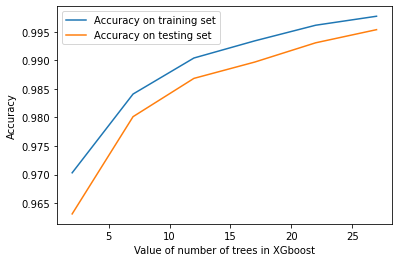

In [140]:
tree_range = range(2, 30, 5)
score1=[]
score2=[]
for tree in tree_range:
    xgb=XGBClassifier(n_estimators=tree)
    xgb.fit(X_train_cv,y_train_cv)
    score1.append(xgb.score(X_train_cv,y_train_cv))
    score2.append(xgb.score(X_test_cv,y_test_cv))
    
%matplotlib inline
plt.plot(tree_range,score1,label= 'Accuracy on training set')
plt.plot(tree_range,score2,label= 'Accuracy on testing set')
plt.xlabel('Value of number of trees in XGboost')
plt.ylabel('Accuracy')
plt.legend()

In [141]:
# make predictions for test data
# use predict_proba since we need probabilities to compute auc
y_pred = model.predict_proba(X_test_cv)
y_pred[:10]

array([[4.8875809e-06, 9.9999511e-01],
       [9.9999928e-01, 7.3598801e-07],
       [9.9999422e-01, 5.7905609e-06],
       [9.9999356e-01, 6.4182364e-06],
       [9.9999988e-01, 1.4142046e-07],
       [1.0000000e+00, 3.7362842e-09],
       [1.0000000e+00, 2.2455566e-09],
       [9.9999660e-01, 3.3914755e-06],
       [1.0000000e+00, 9.8046540e-09],
       [9.9999648e-01, 3.5332716e-06]], dtype=float32)

In [142]:
# evaluate predictions
roc = metrics.roc_auc_score(y_test_cv, y_pred[:, 1])
print("AUC: %.2f%%" % (roc * 100.0))

AUC: 99.06%


In [143]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = StratifiedKFold(n_splits = 5, shuffle = False, random_state = None)

# specify range of hyperparameters
param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          

# specify model
xgb_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb_model, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      


In [144]:
# fit the model
model_cv.fit(X_train_cv, y_train_cv)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed: 10.5min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=200, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=Non

In [145]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,14.891469,1.203205,0.125069,0.007543,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.995906,0.997354,0.996924,...,0.997697,0.001292,4,0.999563,0.999565,0.999563,0.999551,0.999493,0.999547,0.000028
1,21.116293,1.612842,0.132418,0.013737,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.995522,0.996843,0.995700,...,0.997301,0.001639,5,0.999548,0.999595,0.999556,0.999523,0.999521,0.999549,0.000027
2,23.762107,0.655654,0.137054,0.003598,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.996955,0.997313,0.997131,...,0.997839,0.000941,3,0.999558,0.999571,0.999554,0.999510,0.999466,0.999532,0.000039
3,16.297773,0.445089,0.136073,0.002654,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.994179,0.999099,0.999475,...,0.998498,0.002179,1,0.999965,0.999965,0.999965,0.999965,0.999961,0.999964,0.000002
4,21.853697,0.464971,0.139273,0.004206,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.989269,0.999333,0.997528,...,0.997170,0.004043,6,0.999977,0.999967,0.999975,0.999973,0.999959,0.999970,0.000007
5,24.394979,0.301267,0.142865,0.000991,0.6,0.9,"{'learning_rate': 0.6, 'subsample': 0.9}",0.992928,0.998858,0.998139,...,0.997926,0.002582,2,0.999968,0.999967,0.999967,0.999971,0.999960,0.999966,0.000004


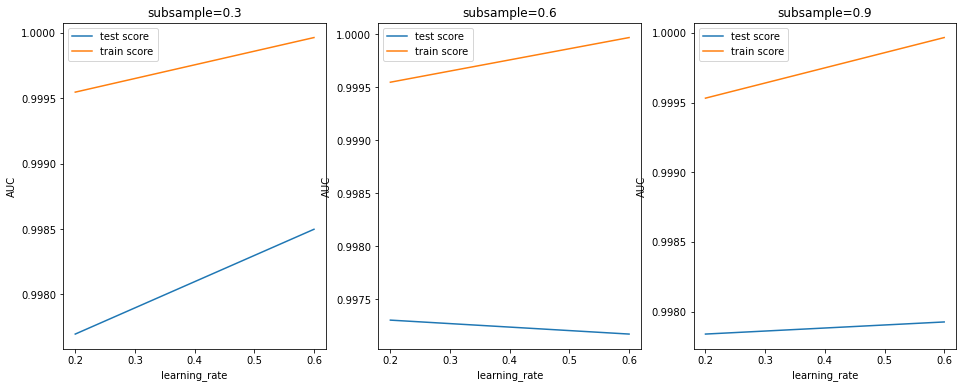

In [146]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    #plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    #plt.xscale('log')

In [147]:
# chosen hyperparameters
# 'objective':'binary:logistic' outputs probability rather than label, which we need for auc

#The results show that a subsample size of 0.6 and learning_rate of about 0.2 seems optimal.
#Also, XGBoost has resulted in the highest ROC AUC obtained (across various hyperparameters).

params = {'learning_rate': 0.2,
          'max_depth': 2, 
          'n_estimators':200,
          'subsample':0.9,
         'objective':'binary:logistic'}

# fit model on training data
model = XGBClassifier(params = params)
model.fit(X_train_cv, y_train_cv)

[15:59:18] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:480: 
Parameters: { params } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              params={'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 200,
                      'objective': 'binary:logistic', 'subsample': 0.9},
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [148]:
y_pred = model.predict_proba(X_test_cv)
predictions = model.predict(X_test_cv)
y_pred[:10]

array([[4.8875809e-06, 9.9999511e-01],
       [9.9999928e-01, 7.3598801e-07],
       [9.9999422e-01, 5.7905609e-06],
       [9.9999356e-01, 6.4182364e-06],
       [9.9999988e-01, 1.4142046e-07],
       [1.0000000e+00, 3.7362842e-09],
       [1.0000000e+00, 2.2455566e-09],
       [9.9999660e-01, 3.3914755e-06],
       [1.0000000e+00, 9.8046540e-09],
       [9.9999648e-01, 3.5332716e-06]], dtype=float32)

In [152]:
accuracy = sklearn.metrics.accuracy_score(y_test_cv, predictions)
precision=sklearn.metrics.precision_score(y_test_cv, predictions)
recall=sklearn.metrics.recall_score(y_test_cv, predictions)
roc=sklearn.metrics.roc_auc_score(y_test_cv,predictions)
print("Accuracy: %.2f%% " % (accuracy * 100.0))
print("Precision: %.2f%% " % (precision *100))
print("Recall: %.2f%% " % (recall * 100))
print("AUC: %.2f%% " % (roc *100))

# roc_auc
auc = sklearn.metrics.roc_auc_score(y_test_cv, y_pred[:, 1])
auc

Accuracy: 99.95% 
Precision: 82.52% 
Recall: 86.73% 
AUC: 93.35% 


0.9905915869442881

In [153]:
# feature importance
importance = dict(zip(X_train_cv.columns, model.feature_importances_))
importance

{'V1': 0.017071368,
 'V2': 0.022360913,
 'V3': 0.017159093,
 'V4': 0.11674428,
 'V5': 0.02884203,
 'V6': 0.019380845,
 'V7': 0.014933892,
 'V8': 0.031867895,
 'V9': 0.011125038,
 'V10': 0.015104209,
 'V11': 0.017925948,
 'V12': 0.03917726,
 'V13': 0.008407201,
 'V14': 0.43767822,
 'V15': 0.013039431,
 'V16': 0.013533089,
 'V17': 0.009162076,
 'V18': 0.013241715,
 'V19': 0.010687011,
 'V20': 0.010503783,
 'V21': 0.017972913,
 'V22': 0.009055655,
 'V23': 0.0072316285,
 'V24': 0.01085635,
 'V25': 0.022457091,
 'V26': 0.017160133,
 'V27': 0.006926803,
 'V28': 0.0062506464,
 'Amount': 0.03414342}

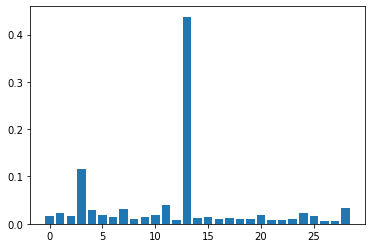

In [154]:
# plot
plt.bar(range(len(model.feature_importances_)), model.feature_importances_)
plt.show()

### Select the oversampling method which shows the best result on a model
- Apply the best hyperparameter on the model
- Predict on the test dataset

In [156]:
clf = XGBClassifier(params = params)  #initialise the model with optimum hyperparameters
clf.fit(X_train_cv, y_train_cv)

#print the evaluation score on the X_test by choosing the best evaluation metric
accuracy = sklearn.metrics.accuracy_score(y_test_cv, predictions)
precision=sklearn.metrics.precision_score(y_test_cv, predictions)
recall=sklearn.metrics.recall_score(y_test_cv, predictions)
roc=sklearn.metrics.roc_auc_score(y_test_cv,predictions)
print("Accuracy: %.2f%% " % (accuracy * 100.0))
print("Precision: %.2f%% " % (precision *100))
print("Recall: %.2f%% " % (recall * 100))
print("AUC: %.2f%% " % (roc *100))

[16:04:00] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:480: 
Parameters: { params } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Accuracy: 99.95% 
Precision: 82.52% 
Recall: 86.73% 
AUC: 93.35% 


### Print the important features of the best model to understand the dataset

Top var = 14
2nd Top var = 4
3rd Top var = 12


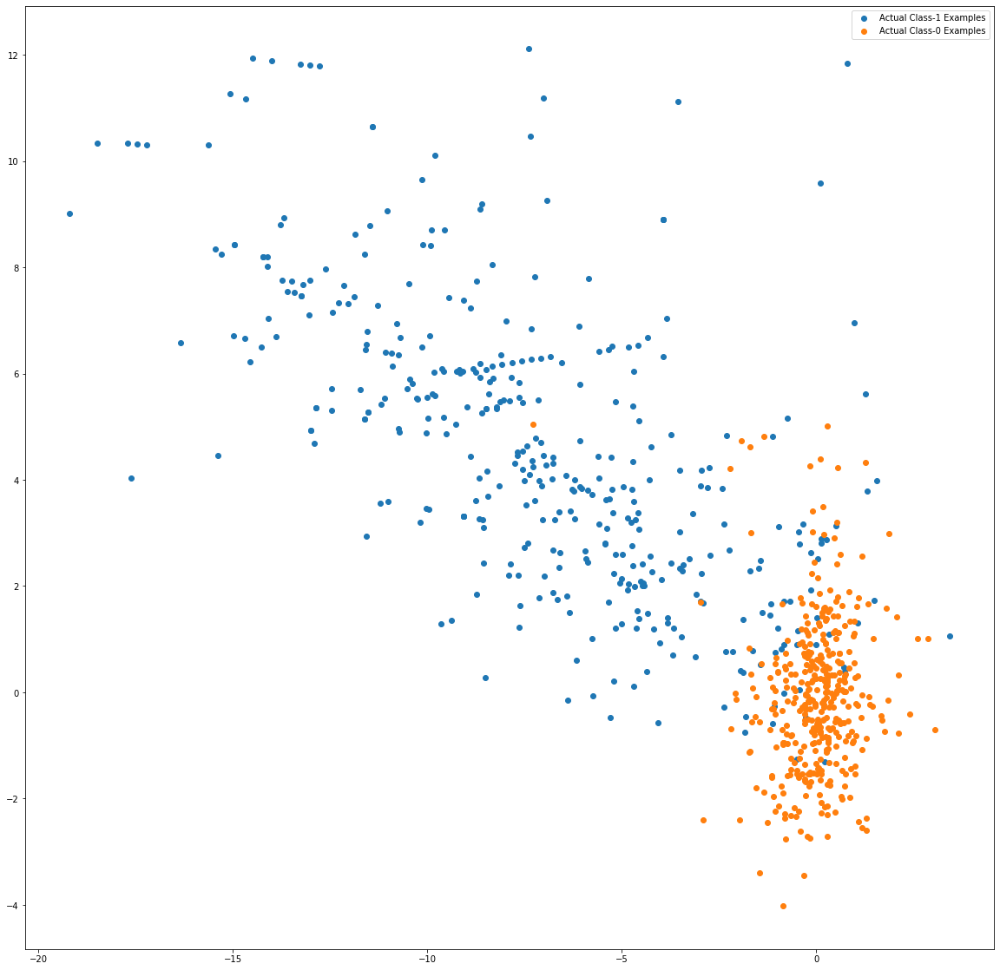

In [157]:
var_imp = []
for i in clf.feature_importances_:
    var_imp.append(i)
print('Top var =', var_imp.index(np.sort(clf.feature_importances_)[-1])+1)
print('2nd Top var =', var_imp.index(np.sort(clf.feature_importances_)[-2])+1)
print('3rd Top var =', var_imp.index(np.sort(clf.feature_importances_)[-3])+1)

# Variable on Index-13 and Index-9 seems to be the top 2 variables
top_var_index = var_imp.index(np.sort(clf.feature_importances_)[-1])
second_top_var_index = var_imp.index(np.sort(clf.feature_importances_)[-2])

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]

np.random.shuffle(X_train_0)

import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]

plt.scatter(X_train_1[:, top_var_index], X_train_1[:, second_top_var_index], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], top_var_index], X_train_0[:X_train_1.shape[0], second_top_var_index],
            label='Actual Class-0 Examples')
plt.legend()

In [182]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [181]:
#### Print the FPR,TPR & select the best threshold from the roc curve

# # Let's take a look at the confusion matrix again 
print("confusion matrix:")
confusion = confusion_matrix(y_test_cv,predictions)
print(confusion)
print('\n')

# Let's check the overall accuracy.
accuracy = sklearn.metrics.accuracy_score(y_test_cv, predictions)
print("Accuracy    : %.2f%% " % (accuracy * 100.0))


TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

# Let's see the sensitivity 
sensitivity = TP / float(TP+FN)
print("Sensitivity : %.2f%% " % (sensitivity * 100.0))

# Let us calculate specificity
specificity = TN / float(TN+FP)
print("Specificity : %.2f%% " % (specificity * 100.0))
print('\n')

# Calculate True postive rate 
print("True Postive Rate : %.2f%% " % (sensitivity * 100.0))


# Calculate false postive rate - predicting Fraud when customer does not have non-Fraud
FPR = FP/ float(TN+FP)
print("False Postive Rate : %.2f%% " % (FPR * 100.0))

# positive predictive value 
PPV = TP / float(TP+FP)
print("Positive Predictive Value : %.2f%% " % (PPV * 100.0))

# Negative predictive value
NPV = TN / float(TN+ FN)
print("Negative Predictive Value : %.2f%% " % (NPV * 100.0))


confusion matrix:
[[56846    18]
 [   13    85]]


Accuracy    : 99.95% 
Sensitivity : 86.73% 
Specificity : 99.97% 


True Postive Rate : 86.73% 
False Postive Rate : 0.03% 
Positive Predictive Value : 82.52% 
Negative Predictive Value : 99.98% 


In [183]:
fpr, tpr, thresholds = metrics.roc_curve(y_test_cv,predictions, drop_intermediate = False )

In [186]:
print('Train auc =', metrics.roc_auc_score(y_test_cv,predictions))
fpr, tpr, thresholds = metrics.roc_curve(y_test_cv,predictions)
threshold = thresholds[np.argmax(tpr-fpr)]
print(threshold)

Train auc = 0.9335151970185936
1


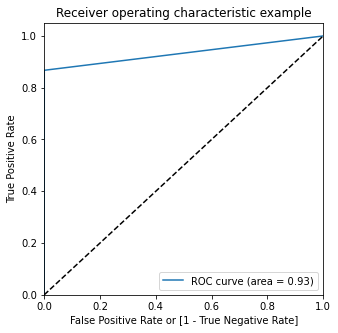

In [184]:
draw_roc(y_test_cv,predictions)